In [4]:
library("tidyverse")
library("reshape")
library(ggbeeswarm)
library("tidyr")
library("ggplot2")
library("reshape2")
library("dplyr")
theme_set(theme_bw(base_size = 18)) 



-- Attaching packages --------------------------------------- tidyverse 1.3.2 --
v ggplot2 3.4.0      v purrr   0.3.5 
v tibble  3.1.8      v dplyr   1.0.10
v tidyr   1.2.1      v stringr 1.4.1 
v readr   2.1.3      v forcats 0.5.2 
-- Conflicts ------------------------------------------ tidyverse_conflicts() --
x dplyr::filter() masks stats::filter()
x dplyr::lag()    masks stats::lag()

Attaching package: 'reshape'


The following object is masked from 'package:dplyr':

    rename


The following objects are masked from 'package:tidyr':

    expand, smiths



Attaching package: 'reshape2'


The following objects are masked from 'package:reshape':

    colsplit, melt, recast


The following object is masked from 'package:tidyr':

    smiths




In [5]:
#Gene of interest
Gene = read.delim("/projects/ps-gleesonlab8/User/hiyoothere/NTD/5.Analysis/Gene/20220814_Gene_interest.txt", header = F)
colnames(Gene)[1] = "gene"
colnames(Gene)[2] = "Gene_interest"
head(Gene)

#False indel by manual inspection
#false_indel = read.delim("/projects/ps-gleesonlab8/User/hiyoothere/NTD/6.manual_check/INDEL/Inspected_220822/combined_NTD_WES_indel_inspection.exp.txt", header = T)
false_indel_unique = false_indel[!duplicated(false_indel$locus), ]
false_indel_unique = false_indel_unique[,c(2,5)]
head(false_indel_unique)
#9 for false indels

,gene,Gene_interest
,<chr>,<chr>
1,Actb,Somite2
2,ADAM12,Somite2
3,ALCAM,Somite2
4,ALDH1A2,Somite2
5,ANKRD33B,Somite2
6,APCDD1,Somite2


ERROR: Error in eval(expr, envir, enclos): object 'false_indel' not found


# 1. Loading files for annotations

In [ ]:
#batch information
batch = read.delim("/projects/ps-gleesonlab8/User/hiyoothere/NTD/0.Data/0.SampleInfo/20220919_NTD_WES_Trios.batch", header = F)
colnames(batch)[1] = "pro"
colnames(batch)[2] = "batch"
head(batch)

#Gene Alias from HGNC
hgnc = read.delim("/projects/ps-gleesonlab8/User/hiyoothere/NTD/5.Analysis/Gene/20220814_hgnc_alias.txt", header = F)
colnames(hgnc)[1] = "gene"
colnames(hgnc)[2] = "gene_alias"
head(hgnc)
hgnc_unique <- unique(hgnc)

#Ensembl id and gene symbol for blanks
ensembl = read.delim("/projects/ps-gleesonlab8/User/hiyoothere/Resources/HGNC/HGNC_ensembleid.txt")
colnames(ensembl)[1] = "gene_hgnc"
colnames(ensembl)[2] = "gene_id"
head(ensembl)
ensembl_unique <- ensembl[!duplicated(ensembl$gene_id),]
head(ensembl)


#HopeKit samples
HopeKit = read.delim("/projects/ps-gleesonlab8/User/hiyoothere/NTD/5.Analysis/Gene/20220814_HopeKit.txt", header = F)
colnames(HopeKit)[1] = "pro"
colnames(HopeKit)[2] = "HopeKit"
HopeKit$pro = as.character(HopeKit$pro)
dim(HopeKit)
HopeKit_unique <- unique(HopeKit)
dim(HopeKit_unique)

#PPI from INSIDER
ppi = read.delim("/projects/ps-gleesonlab8/User/hiyoothere/NTD/5.Analysis/PPI/INSIDER_PPI_220816.s.Pmerged.1b.txt", header = F, sep='\t')
colnames(ppi)[1] = "locus"
colnames(ppi)[2] = "ppi"
colnames(ppi)[3] = "ppi_prediction"
ppi_unique <- ppi[!duplicated(ppi$locus),]


#PED
ped = read.delim('/projects/ps-gleesonlab8/User/hiyoothere/NTD/0.Data/0.SampleInfo/20220919_NTD_WES_Trios.wH.ped', header=T)
#ped = read.delim('/projects/ps-gleesonlab8/User/hiyoothere/NTD/0.Data/0.SampleInfo/20220919_NTD_WES_Trios.truffle.wH.ped', header = T)
colnames(ped)[1] = 'family'
colnames(ped)[2] = 'pro'
ped.pro = ped[ped[, 3] != 0 & ped[, 4] != 0, ] # proband only
colnames(ped.pro) = c('fid', 'sample', 'dad', 'mom', 'V5', 'V6')
head(ped.pro)


##HGNC gene symbol bt ensembl gene id
#library("biomaRt")
#mart <- useDataset("hsapiens_gene_ensembl", useMart("ensembl"))
#G_list <- getBM(filters= "ensembl_gene_id", attributes= c("ensembl_gene_id","hgnc_symbol",
# "description"),values=data$gene_id, mart= mart)
#head(G_list)
#G_list
#empty <- subset(G_list, G_list$hgnc_symbol == "")
#dim(empty)

# 2. Loading converted vcfs

In [ ]:
data = read.delim('/oasis/tscc/scratch/hiyoothere/NTD/4.Analysis/1.HC/0.gvcf/9.DNM_Filter/NTD_All_re.genotyped.VQSR.CGP.ann.All.vep.DNM.sorted.den_input', header=T)
head(data)
dim(data)


table(data$confidence)
head(subset(data, data$confidence == ""))

head(subset(data, data$confidence != ""))


# Select one of double recruited family by somalier mean depth
### 5751	7877!
### 6385	7223!
### 6496	7779!
### 7771! 7076
### 7932 8055!

## with ! is used


### qurtetes:  c('103', '224','270', '394', '7106', '7196', '7267')

## Filter samples based on TRUFFLE kindship failure and contamination

In [2]:
#Kindship 
l_kindshipfail_ssc = c('11431', '11532', '11628', '11714', '12401', '12879', '11352', '12120', '12879')
l_kindshipfail_ntd = c('5751', '5916', '6327',  '6385',
                      '6496', '6698', '6706', '6944', '6951', '6959', '7079', 
                      '7160', '7166', '7076', '7929',  '7932', '8028', '8030', '8036',
                      '5985', '7221', '7132')

MM= c('5754', '5916', '6027','6081', '6117', '6254', '6305', '6327', '6390', '6425', '6495', '6698', '6706', '6759', '6833', '6944', '6951', '6959', '7079', '7160', '7166', '7436', '7929', '8028', '8030', '8036')
print (length(MM))

l_notMM = c('32', '41', '122', '126', '269', '282', '453', '554', 'ZRV', '103', '332')
l_kindshipfail = c(l_kindshipfail_ssc, l_kindshipfail_ntd, l_notMM)

paste("Truffle failed control trios: ", length(l_kindshipfail_ssc))
paste("Truffle failed ntd trios: ", length(l_kindshipfail_ntd))
paste("Not MM samples: ", length(l_notMM))
length(l_kindshipfail)


paste("Number of variants before Truffle:", dim(data)[1])
data <- data[!(data$family %in% l_kindshipfail),]
paste("Number of variante after Truffle filter:", dim(data)[1])
#Contamination
l_contam = c('3183206392')#UCI proband contamination
data<- data[!(data$pro %in% l_contam),]
dim(data)
#data <- data[data$pro != '2205311355',] #UCI mother contamination 

[1] 26


[1] "Truffle failed control trios:  9"

[1] "Truffle failed ntd trios:  22"

[1] "Not MM samples:  11"

[1] 42

[1] "Number of variants before Truffle: "

ERROR: Error in data$family: object of type 'closure' is not subsettable


In [6]:
subset(data, data$family == '5751')
subset(data, data$family == '7877')

locus,ref,alt,family,pro,dad,mom,pro_sex,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,MQ,QD,filter,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,VARIANT_CLASS,SYMBOL_SOURCE,HGNC_ID,CANONICAL,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,CCDS,ENSP,SWISSPROT,TREMBL,UNIPARC,UNIPROT_ISOFORM,GENE_PHENO,SIFT,PolyPhen,DOMAINS,miRNA,HGVS_OFFSET,AF,AFR_AF,AMR_AF,EAS_AF,EUR_AF,SAS_AF,AA_AF,EA_AF,gnomAD_AF,gnomAD_AFR_AF,gnomAD_AMR_AF,gnomAD_ASJ_AF,gnomAD_EAS_AF,gnomAD_FIN_AF,gnomAD_NFE_AF,gnomAD_OTH_AF,gnomAD_SAS_AF,MAX_AF,MAX_AF_POPS,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS,CADD_phred,DisGeNET,MPC,MTR,Mastermind,MetaSVM_pred,MetaSVM_rankscore,Phenotypes,Polyphen2_HDIV_score,SIFT_pred,SplicAI,SpliceRegion,gnomAD_exomes_AC,gnomAD_exomes_AF,gnomAD_exomes_AN,pLI,pLI_values,occurence,probands
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>


,locus,ref,alt,family,pro,dad,mom,pro_sex,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,MQ,QD,filter,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,VARIANT_CLASS,SYMBOL_SOURCE,HGNC_ID,CANONICAL,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,CCDS,ENSP,SWISSPROT,TREMBL,UNIPARC,UNIPROT_ISOFORM,GENE_PHENO,SIFT,PolyPhen,DOMAINS,miRNA,HGVS_OFFSET,AF,AFR_AF,AMR_AF,EAS_AF,EUR_AF,SAS_AF,AA_AF,EA_AF,gnomAD_AF,gnomAD_AFR_AF,gnomAD_AMR_AF,gnomAD_ASJ_AF,gnomAD_EAS_AF,gnomAD_FIN_AF,gnomAD_NFE_AF,gnomAD_OTH_AF,gnomAD_SAS_AF,MAX_AF,MAX_AF_POPS,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS,CADD_phred,DisGeNET,MPC,MTR,Mastermind,MetaSVM_pred,MetaSVM_rankscore,Phenotypes,Polyphen2_HDIV_score,SIFT_pred,SplicAI,SpliceRegion,gnomAD_exomes_AC,gnomAD_exomes_AF,gnomAD_exomes_AN,pLI,pLI_values,occurence,probands
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>
18504,chr1:10122042,GAACCA,G,7877,2482616177,7579234967,8933074184,1,35,30,5,0/1,23,35,35,0,0/0,76,38,38,0,0/0,85,.,hiConfDeNovo,60.00,1.54,PASS,-,frameshift_variant,HIGH,UBE4B,ENSG00000130939,Transcript,ENST00000253251,protein_coding,9/27,,ENST00000253251.12:c.1134_1138del,ENSP00000253251.8:p.Arg378SerfsTer5,1973-1977,1134-1138,378-380,RTT/SX,agAACCAct/agct,,NA,1,,deletion,HGNC,HGNC:12500,,,,1,P1,CCDS110.1,ENSP00000253251,O95155.183,,UPI0000071F1D,O95155-2,1,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,,NA,,NA,,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,2482616177
43362,chr1:22517472,G,C,7877,2482616177,7579234967,8933074184,1,36,32,4,0/1,24,18,18,0,0/0,39,31,31,0,0/0,35,.,hiConfDeNovo,60.00,culprit=QD,PASS,C,upstream_gene_variant,MODIFIER,ZBTB40-IT1,ENSG00000237200,Transcript,ENST00000438551,lncRNA,,,,,,,,,,,2,1,,SNV,HGNC,HGNC:41493,YES,,,3,,,,,,,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,,NA,,NA,,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,2482616177
43363,chr1:22517474,G,T,7877,2482616177,7579234967,8933074184,1,35,31,4,0/1,24,18,18,0,0/0,30,30,30,0,0/0,44,.,hiConfDeNovo,60.00,culprit=QD,PASS,T,non_coding_transcript_exon_variant,MODIFIER,ZBTB40-IT1,ENSG00000237200,Transcript,ENST00000438551,lncRNA,1/2,,ENST00000438551.1:n.1G>T,,1,,,,,,NA,1,,SNV,HGNC,HGNC:41493,YES,,,3,,,,,,,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,,NA,,NA,,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,2482616177
99464,chr1:55142983,T,A,7877,2482616177,7579234967,8933074184,1,41,36,5,0/1,19,43,43,0,0/0,23,39,39,0,0/0,67,.,loConfDeNovo,60.00,1.6,PASS,A,downstream_gene_variant,MODIFIER,USP24,ENSG00000162402,Transcript,ENST00000634589,nonsense_mediated_decay,,,,,,,,,,,4666,-1,cds_start_NF,SNV,HGNC,HGNC:12623,,,,5,,,ENSP00000489531,,A0A0U1RRH2.11,UPI000719A193,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,,NA,,NA,,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,2482616177
99465,chr1:55142991,AGG,A,7877,2482616177,7579234967,8933074184,1,48,42,6,0/1,10,46,46,0,0/0,71,46,46,0,0/0,74,.,loConfDeNovo,60.00,0.74,PASS,-,frameshift_variant,HIGH,USP24,ENSG00000162402,Transcript,ENST00000294383,protein_coding,22/68,,ENST00000294383.7:c.2566_2567del,ENSP00000294383.5:p.Pro856Ter,2817-2818,

In [35]:
recurrent <- subset(data, data$occurence >= 1)
#recurrent
table(recurrent$occurence)


      1       2       3       4 
3025750  469244   71517    5598 

## Make intermediate file

In [36]:
write.table(data, "/projects/ps-gleesonlab8/User/hiyoothere/NTD/5.Analysis/DNM/Filteration/NTD_WES_DNM.sampFil.den_input", sep='\t', quote=F, row.names=F)
DCP1 <- data


In [37]:
data <- DCP1

# 4. Filter DNMs based on GQ, depth and VQSR

In [ ]:
ggplot(data) + 
geom_density(aes(x = data$pro_DP))

summary(data$pro_DP)

## (1) DP in all trio members

In [38]:
dim(data)
data$DP_filter12 = apply(data[c('pro_DP', 'dad_DP', 'mom_DP')], 1, function (x) {all(x >= 12)}) # all 
data = data[data$DP_filter12, ]
dim(data)

[1] 3572109     116

[1] 49128   117

In [39]:
table(data$confidence)
head(subset(data, data$confidence == ""))

head(subset(data, data$confidence != ""))


hiConfDeNovo loConfDeNovo 
       37328        11800 

locus,ref,alt,family,pro,dad,mom,pro_sex,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,MQ,QD,filter,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,VARIANT_CLASS,SYMBOL_SOURCE,HGNC_ID,CANONICAL,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,CCDS,ENSP,SWISSPROT,TREMBL,UNIPARC,UNIPROT_ISOFORM,GENE_PHENO,SIFT,PolyPhen,DOMAINS,miRNA,HGVS_OFFSET,AF,AFR_AF,AMR_AF,EAS_AF,EUR_AF,SAS_AF,AA_AF,EA_AF,gnomAD_AF,gnomAD_AFR_AF,gnomAD_AMR_AF,gnomAD_ASJ_AF,gnomAD_EAS_AF,gnomAD_FIN_AF,gnomAD_NFE_AF,gnomAD_OTH_AF,gnomAD_SAS_AF,MAX_AF,MAX_AF_POPS,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS,CADD_phred,DisGeNET,MPC,MTR,Mastermind,MetaSVM_pred,MetaSVM_rankscore,Phenotypes,Polyphen2_HDIV_score,SIFT_pred,SplicAI,SpliceRegion,gnomAD_exomes_AC,gnomAD_exomes_AF,gnomAD_exomes_AN,pLI,pLI_values,occurence,probands,DP_filter12
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<lgl>


,locus,ref,alt,family,pro,dad,mom,pro_sex,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,MQ,QD,filter,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,VARIANT_CLASS,SYMBOL_SOURCE,HGNC_ID,CANONICAL,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,CCDS,ENSP,SWISSPROT,TREMBL,UNIPARC,UNIPROT_ISOFORM,GENE_PHENO,SIFT,PolyPhen,DOMAINS,miRNA,HGVS_OFFSET,AF,AFR_AF,AMR_AF,EAS_AF,EUR_AF,SAS_AF,AA_AF,EA_AF,gnomAD_AF,gnomAD_AFR_AF,gnomAD_AMR_AF,gnomAD_ASJ_AF,gnomAD_EAS_AF,gnomAD_FIN_AF,gnomAD_NFE_AF,gnomAD_OTH_AF,gnomAD_SAS_AF,MAX_AF,MAX_AF_POPS,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS,CADD_phred,DisGeNET,MPC,MTR,Mastermind,MetaSVM_pred,MetaSVM_rankscore,Phenotypes,Polyphen2_HDIV_score,SIFT_pred,SplicAI,SpliceRegion,gnomAD_exomes_AC,gnomAD_exomes_AF,gnomAD_exomes_AN,pLI,pLI_values,occurence,probands,DP_filter12
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<lgl>
29,chr1:16617,C,A,7013,9006237446,2378273769,2255477343,0,13,8,5,0/1,21,16,16,0,0/0,37,26,26,0,0/0,25,.,hiConfDeNovo,21.55,0.3,VQSRTrancheSNP99.90to100.00,A,downstream_gene_variant,MODIFIER,MIR6859-1,ENSG00000278267,Transcript,ENST00000619216,miRNA,,,,,,,,,,rs1392591913,752,-1,,SNV,HGNC,HGNC:50039,YES,,,NA,,,,,,,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,,NA,,NA,,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,9006237446,TRUE
30,chr1:17532,C,A,6295,1837207056,8142568234,4765157007,2,58,46,12,0/1,99,23,22,1,0/0,8,27,27,0,0/0,59,.,loConfDeNovo,40.02,3.29,VQSRTrancheSNP99.90to100.00,A,upstream_gene_variant,MODIFIER,MIR6859-1,ENSG00000278267,Transcript,ENST00000619216,miRNA,,,,,,,,,,rs1413640003,96,-1,,SNV,HGNC,HGNC:50039,YES,,,NA,,,,,,,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,,NA,,NA,,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,1837207056,TRUE
79,chr1:185179,CAA,C,6766,8446277316,2469059373,7331613836,1,21,15,6,0/1,99,19,19,0,0/0,35,18,18,0,0/0,30,.,hiConfDeNovo,22.13,7.73,VQSRTrancheINDEL99.90to100.00,-,downstream_gene_variant,MODIFIER,DDX11L17,ENSG00000279928,Transcript,ENST00000624431,unprocessed_pseudogene,,,,,,,,,,,1006,1,,deletion,HGNC,HGNC:55080,YES,,,NA,,,,,,,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,,NA,,NA,,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,8446277316,TRUE
80,chr1:185294,C,T,7417,3700215562,4399010376,4596256010,2,37,30,7,0/1,15,28,28,0,0/0,36,24,24,0,0/0,20,.,loConfDeNovo,23.74,1.54,VQSRTrancheSNP99.90to100.00,T,downstream_gene_variant,MODIFIER,DDX11L17,ENSG00000279928,Transcript,ENST00000624431,unprocessed_pseudogene,,,,,,,,,,rs1281896310,1120,1,,SNV,HGNC,HGNC:55080,YES,,,NA,,,,,,,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,,NA,,NA,,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,3700215562,TRUE
121,chr1:494623,A,T,7133,2895107119,2921906436,2668373338,2,26,16,10,0/1,99,23,23,0,0/0,40,26,17,0,0/0,24,.,hiConfDeNovo,42.91,11.47,VQSRTrancheSNP99.90to100.00,T,downstream_gene_variant,MODIFIER,CICP7,ENSG00000233653,Transcript,ENST00000432723,processed_pseudogene,,,,,,,,,,rs1217686777,4717,1,,SNV,HGNC,HGNC:37756,YES,,,NA,,,,,,,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,6.408e-05,0,0.0001961,0,0,0,5.249e-05,0,0,0.0001

## (2) Depth bionomial test for confirming it's germline

,locus,ref,alt,family,pro,dad,mom,pro_sex,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,MQ,QD,filter,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,VARIANT_CLASS,SYMBOL_SOURCE,HGNC_ID,CANONICAL,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,CCDS,ENSP,SWISSPROT,TREMBL,UNIPARC,UNIPROT_ISOFORM,GENE_PHENO,SIFT,PolyPhen,DOMAINS,miRNA,HGVS_OFFSET,AF,AFR_AF,AMR_AF,EAS_AF,EUR_AF,SAS_AF,AA_AF,EA_AF,gnomAD_AF,gnomAD_AFR_AF,gnomAD_AMR_AF,gnomAD_ASJ_AF,gnomAD_EAS_AF,gnomAD_FIN_AF,gnomAD_NFE_AF,gnomAD_OTH_AF,gnomAD_SAS_AF,MAX_AF,MAX_AF_POPS,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS,CADD_phred,DisGeNET,MPC,MTR,Mastermind,MetaSVM_pred,MetaSVM_rankscore,Phenotypes,Polyphen2_HDIV_score,SIFT_pred,SplicAI,SpliceRegion,gnomAD_exomes_AC,gnomAD_exomes_AF,gnomAD_exomes_AN,pLI,pLI_values,occurence,probands,DP_filter12
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<lgl>
29,chr1:16617,C,A,7013,9006237446,2378273769,2255477343,0,13,8,5,0/1,21,16,16,0,0/0,37,26,26,0,0/0,25,.,hiConfDeNovo,21.55,0.3,VQSRTrancheSNP99.90to100.00,A,downstream_gene_variant,MODIFIER,MIR6859-1,ENSG00000278267,Transcript,ENST00000619216,miRNA,,,,,,,,,,rs1392591913,752,-1,,SNV,HGNC,HGNC:50039,YES,,,NA,,,,,,,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,,NA,,NA,,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,9006237446,TRUE
30,chr1:17532,C,A,6295,1837207056,8142568234,4765157007,2,58,46,12,0/1,99,23,22,1,0/0,8,27,27,0,0/0,59,.,loConfDeNovo,40.02,3.29,VQSRTrancheSNP99.90to100.00,A,upstream_gene_variant,MODIFIER,MIR6859-1,ENSG00000278267,Transcript,ENST00000619216,miRNA,,,,,,,,,,rs1413640003,96,-1,,SNV,HGNC,HGNC:50039,YES,,,NA,,,,,,,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,,NA,,NA,,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,1837207056,TRUE
79,chr1:185179,CAA,C,6766,8446277316,2469059373,7331613836,1,21,15,6,0/1,99,19,19,0,0/0,35,18,18,0,0/0,30,.,hiConfDeNovo,22.13,7.73,VQSRTrancheINDEL99.90to100.00,-,downstream_gene_variant,MODIFIER,DDX11L17,ENSG00000279928,Transcript,ENST00000624431,unprocessed_pseudogene,,,,,,,,,,,1006,1,,deletion,HGNC,HGNC:55080,YES,,,NA,,,,,,,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,,NA,,NA,,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,8446277316,TRUE
80,chr1:185294,C,T,7417,3700215562,4399010376,4596256010,2,37,30,7,0/1,15,28,28,0,0/0,36,24,24,0,0/0,20,.,loConfDeNovo,23.74,1.54,VQSRTrancheSNP99.90to100.00,T,downstream_gene_variant,MODIFIER,DDX11L17,ENSG00000279928,Transcript,ENST00000624431,unprocessed_pseudogene,,,,,,,,,,rs1281896310,1120,1,,SNV,HGNC,HGNC:55080,YES,,,NA,,,,,,,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,,NA,,NA,,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,3700215562,TRUE
121,chr1:494623,A,T,7133,2895107119,2921906436,2668373338,2,26,16,10,0/1,99,23,23,0,0/0,40,26,17,0,0/0,24,.,hiConfDeNovo,42.91,11.47,VQSRTrancheSNP99.90to100.00,T,downstream_gene_variant,MODIFIER,CICP7,ENSG00000233653,Transcript,ENST00000432723,processed_pseudogene,,,,,,,,,,rs1217686777,4717,1,,SNV,HGNC,HGNC:37756,YES,,,NA,,,,,,,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,6.408e-05,0,0.0001961,0,0,0,5.249e-05,0,0,0.0001

[1] 49128   118

[1] 16801   118

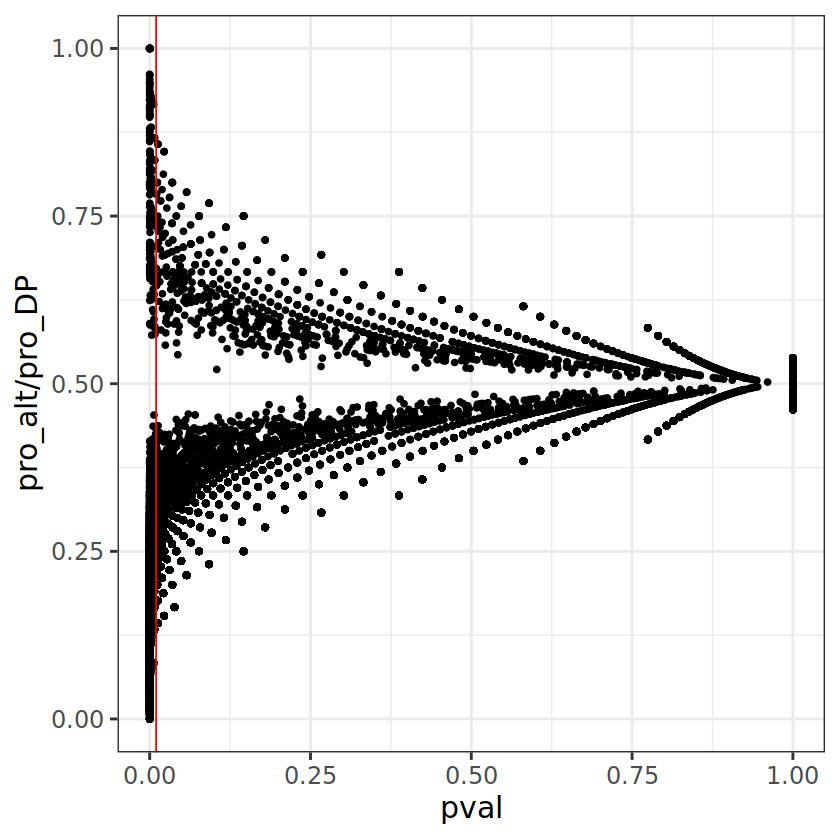

In [40]:
#Binomial

head(data)
function_binom <- function(alt, DP)
{
    binom.test(x= alt,
              n = DP,
              p = 0.5,
              alternative = 'two.sided', 
              conf.level = 0.95)$p.value
}

data$pval <- mapply(function_binom, data$pro_alt, data$pro_DP)


##See distribution of the p val of the binom test
ggplot(data) + 
geom_point(aes(x = pval, y = pro_alt/pro_DP)) + 
geom_vline(aes(xintercept = 0.01), color = 'red')

dim(data)

data <- filter(data, data$pval > 0.01) #8392 vs. heuristic: 8503

dim(data)



## (3) GQ 

In [41]:
table(data$confidence)
loConf <- subset(data, data$confidence == 'loConfDeNovo')
head(loConf)


hiConfDeNovo loConfDeNovo 
       12392         4409 

,locus,ref,alt,family,pro,dad,mom,pro_sex,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,MQ,QD,filter,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,VARIANT_CLASS,SYMBOL_SOURCE,HGNC_ID,CANONICAL,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,CCDS,ENSP,SWISSPROT,TREMBL,UNIPARC,UNIPROT_ISOFORM,GENE_PHENO,SIFT,PolyPhen,DOMAINS,miRNA,HGVS_OFFSET,AF,AFR_AF,AMR_AF,EAS_AF,EUR_AF,SAS_AF,AA_AF,EA_AF,gnomAD_AF,gnomAD_AFR_AF,gnomAD_AMR_AF,gnomAD_ASJ_AF,gnomAD_EAS_AF,gnomAD_FIN_AF,gnomAD_NFE_AF,gnomAD_OTH_AF,gnomAD_SAS_AF,MAX_AF,MAX_AF_POPS,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS,CADD_phred,DisGeNET,MPC,MTR,Mastermind,MetaSVM_pred,MetaSVM_rankscore,Phenotypes,Polyphen2_HDIV_score,SIFT_pred,SplicAI,SpliceRegion,gnomAD_exomes_AC,gnomAD_exomes_AF,gnomAD_exomes_AN,pLI,pLI_values,occurence,probands,DP_filter12,pval
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<lgl>,<dbl>
11,chr1:955917,T,C,5327,7684701625,1460662631,3148333434,2,35,22,13,0/1,16,21,17,4,0/0,21,24,24,0,0/0,41,.,loConfDeNovo,59.97,0.95,PASS,C,splice_donor_region_variant&intron_variant&non_coding_transcript_variant,LOW,NOC2L,ENSG00000188976,Transcript,ENST00000487214,processed_transcript,,6/6,ENST00000487214.1:n.767+6A>G,,,,,,,rs1170079565,NA,-1,,SNV,HGNC,HGNC:24517,,,,3,,,,,,,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,8.094e-05,0,0.0002692,0,0.0001103,0.000e+00,2.674e-05,0,0.0002007,2.692e-04,gnomAD_AMR,,,,,,NA,,NA,,NA,,,,,,NA,,,,,,NA,NA,NA,,,3,7684701625/3491342839/8259328785,TRUE,0.17546525
21,chr1:1035183,T,G,548,S16104,S16105,S16106,1,28,21,7,0/1,78,37,16,0,0/0,10,23,23,0,0/0,29,.,loConfDeNovo,60.04,9.32,PASS,G,intron_variant,MODIFIER,AGRN,ENSG00000188157,Transcript,ENST00000652369,protein_coding,,1/34,ENST00000652369.1:c.149-94T>G,,,,,,,rs1452972161&COSV65067780,NA,1,,SNV,HGNC,HGNC:329,,,,NA,,,ENSP00000498543,,A0A494C0G5.13,UPI0010872C9B,,1,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,0&1,0&1,,,NA,,NA,,NA,,,,,,NA,,,,,,NA,NA,NA,,,2,12602.s1/S16104,TRUE,0.01254095
23,chr1:1197358,T,TGCC,7537,2067314871,4877972263,2807376775,1,27,15,12,0/1,99,17,17,0,0/0,18,26,13,0,0/0,48,.,loConfDeNovo,60.00,18.49,PASS,GCC,intron_variant&NMD_transcript_variant,MODIFIER,TTLL10,ENSG00000162571,Transcript,ENST00000486379,nonsense_mediated_decay,,4/4,ENST00000486379.1:c.*252-80_*252-79insGCC,,,,,,,,NA,1,cds_start_NF,insertion,HGNC,HGNC:26693,,,,3,,,ENSP00000464269,,J3QRK8.31,UPI000268AE23,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,,NA,,NA,,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,2067314871,TRUE,0.70110804
24,chr1:1223786,GCCC,GGCCCCCCCCCCCCCCC,6978,8197862799,8621184138,7748603409,1,21,5,16,0/1,99,13,4,0,0/0,35,15,1,0,0/0,19,.,loConfDeNovo,60.30,17.23,PASS,GCCCCCCCCCCCCCCC,intron_variant,MODIFIER,SDF4,ENSG00000078808,Transcript,ENST00000660930,protein_coding,,3/6,ENST00000660930.1:c.463+45_463+46insGGGGGGGGGGGGC,,,,,,,,NA,-1,,indel,HGNC,HGNC:24188,,,,NA,,CCDS12.1,ENSP00000499296,Q9BRK5.188,A0A024R0A9.41,UPI000013D454,Q9BRK5-6,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,,NA,,NA,,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,8197862799,TRUE

In [42]:
data = data[data$confidence != 'loConfDeNovo', ]
dim(data)
#head(data)

[1] 12392   118


## (4) Filterout MQ < 30


In [43]:
loMQ <- subset(data, data$MQ < 30)
'Low MQ'
dim(loMQ)

fineMQ <- subset(data, data$MQ >= 30)
'High MQ'
dim(fineMQ)

dim(data)
data <- subset(data, data$MQ >= 30)
dim(data)


[1] "Low MQ"

[1]  64 118

[1] "High MQ"

[1] 12327   118

[1] 12392   118

[1] 12327   118

## Make table for comparison for Manual inspection with vqsr

In [35]:
#table(data$filter)
bf_ins <- data.frame(table(data$filter))
bf_ins <- bf_ins %>% mutate(Inspection = "Before inspection")
bf_ins

df_ins <- bf_ins

DCP_bf_VQSR <- data

Var1,Freq,Inspection
<fct>,<int>,<chr>
PASS,10425,Before inspection
VQSRTrancheINDEL99.00to99.90,519,Before inspection
VQSRTrancheINDEL99.90to100.00,425,Before inspection
VQSRTrancheSNP99.90to100.00,1142,Before inspection


## (5) Only VQSR PASS

In [44]:
dim(data)
table(data$filter)
data = data[data$filter == 'PASS', ]
dim(data)

[1] 12327   118


                         PASS  VQSRTrancheINDEL99.00to99.90 
                        10266                           508 
VQSRTrancheINDEL99.90to100.00   VQSRTrancheSNP99.90to100.00 
                          418                          1135 

[1] 10266   118

## (6) Checking parents' genotype

In [45]:
data_dad_nonhom <- subset(data, dad_GT != '0/0' & dad_GT != '0|0')
data_dad_nonhom
data_mom_nonhom  <- subset(data, mom_GT != '0/0' & mom_GT != '0|0')
data_mom_nonhom

locus,ref,alt,family,pro,dad,mom,pro_sex,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,MQ,QD,filter,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,VARIANT_CLASS,SYMBOL_SOURCE,HGNC_ID,CANONICAL,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,CCDS,ENSP,SWISSPROT,TREMBL,UNIPARC,UNIPROT_ISOFORM,GENE_PHENO,SIFT,PolyPhen,DOMAINS,miRNA,HGVS_OFFSET,AF,AFR_AF,AMR_AF,EAS_AF,EUR_AF,SAS_AF,AA_AF,EA_AF,gnomAD_AF,gnomAD_AFR_AF,gnomAD_AMR_AF,gnomAD_ASJ_AF,gnomAD_EAS_AF,gnomAD_FIN_AF,gnomAD_NFE_AF,gnomAD_OTH_AF,gnomAD_SAS_AF,MAX_AF,MAX_AF_POPS,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS,CADD_phred,DisGeNET,MPC,MTR,Mastermind,MetaSVM_pred,MetaSVM_rankscore,Phenotypes,Polyphen2_HDIV_score,SIFT_pred,SplicAI,SpliceRegion,gnomAD_exomes_AC,gnomAD_exomes_AF,gnomAD_exomes_AN,pLI,pLI_values,occurence,probands,DP_filter12,pval
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<lgl>,<dbl>


locus,ref,alt,family,pro,dad,mom,pro_sex,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,MQ,QD,filter,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,VARIANT_CLASS,SYMBOL_SOURCE,HGNC_ID,CANONICAL,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,CCDS,ENSP,SWISSPROT,TREMBL,UNIPARC,UNIPROT_ISOFORM,GENE_PHENO,SIFT,PolyPhen,DOMAINS,miRNA,HGVS_OFFSET,AF,AFR_AF,AMR_AF,EAS_AF,EUR_AF,SAS_AF,AA_AF,EA_AF,gnomAD_AF,gnomAD_AFR_AF,gnomAD_AMR_AF,gnomAD_ASJ_AF,gnomAD_EAS_AF,gnomAD_FIN_AF,gnomAD_NFE_AF,gnomAD_OTH_AF,gnomAD_SAS_AF,MAX_AF,MAX_AF_POPS,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS,CADD_phred,DisGeNET,MPC,MTR,Mastermind,MetaSVM_pred,MetaSVM_rankscore,Phenotypes,Polyphen2_HDIV_score,SIFT_pred,SplicAI,SpliceRegion,gnomAD_exomes_AC,gnomAD_exomes_AF,gnomAD_exomes_AN,pLI,pLI_values,occurence,probands,DP_filter12,pval
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<lgl>,<dbl>


## Intermediate

In [46]:
write.table(data, "/projects/ps-gleesonlab8/User/hiyoothere/NTD/5.Analysis/DNM/Filteration/NTD_WES_DNM.sampFil.HeuFil.den_input", sep='\t', quote=F, row.names=F)
DCP2 <- data
data <- DCP2

# Postfilters

## two post-filters with SCIPTS/DNM_post_filer
### 1. same variant in mother/father (;FLNC)
### 2. Clustered DNMs in 10bp

In [56]:
data = read.delim("/projects/ps-gleesonlab8/User/hiyoothere/NTD/5.Analysis/DNM/Filteration/NTD_WES_DNM.sampFil.HeuFil.PF2.den_input", header = T)
dim(data)
head(data)

[1] 5731  118

,locus,ref,alt,family,pro,dad,mom,pro_sex,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,MQ,QD,filter,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,VARIANT_CLASS,SYMBOL_SOURCE,HGNC_ID,CANONICAL,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,CCDS,ENSP,SWISSPROT,TREMBL,UNIPARC,UNIPROT_ISOFORM,GENE_PHENO,SIFT,PolyPhen,DOMAINS,miRNA,HGVS_OFFSET,AF,AFR_AF,AMR_AF,EAS_AF,EUR_AF,SAS_AF,AA_AF,EA_AF,gnomAD_AF,gnomAD_AFR_AF,gnomAD_AMR_AF,gnomAD_ASJ_AF,gnomAD_EAS_AF,gnomAD_FIN_AF,gnomAD_NFE_AF,gnomAD_OTH_AF,gnomAD_SAS_AF,MAX_AF,MAX_AF_POPS,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS,CADD_phred,DisGeNET,MPC,MTR,Mastermind,MetaSVM_pred,MetaSVM_rankscore,Phenotypes,Polyphen2_HDIV_score,SIFT_pred,SplicAI,SpliceRegion,gnomAD_exomes_AC,gnomAD_exomes_AF,gnomAD_exomes_AN,pLI,pLI_values,occurence,probands,DP_filter12,pval
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<lgl>,<dbl>
1,chr1:930088,C,A,7795,6295869718,4188565559,1220884191,0,105,61,44,0/1,99,36,36,0,0/0,75,37,37,0,0/0,75,.,hiConfDeNovo,60.00,11.29,PASS,A,intron_variant,MODIFIER,SAMD11,ENSG00000187634,Transcript,ENST00000622503,protein_coding,,1/12,ENST00000622503.5:c.73-67C>A,,,,,,,,NA,1,cds_start_NF,SNV,HGNC,HGNC:28706,,,,5,,,ENSP00000482138,,A0A087WYW1.42,UPI0004E4CA1D,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,6295869718,TRUE,0.11799998
2,chr1:931148,C,CCCA,11368,11368.s1,11368.fa,11368.mo,2,18,12,5,0/1,33,30,30,0,0/0,61,19,19,0,0/0,27,.,hiConfDeNovo,60.03,14.32,PASS,CCA,intron_variant,MODIFIER,SAMD11,ENSG00000187634,Transcript,ENST00000622503,protein_coding,,3/12,ENST00000622503.5:c.305+61_305+62insACC,,,,,,,,NA,1,cds_start_NF,insertion,HGNC,HGNC:28706,,,,5,,,ENSP00000482138,,A0A087WYW1.42,UPI0004E4CA1D,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,11368.s1,TRUE,0.09625244
3,chr1:976670,G,A,263,S13333,S13335,S13334,1,36,22,14,0/1,99,25,25,0,0/0,30,34,34,0,0/0,99,.,hiConfDeNovo,60.29,13.78,PASS,A,intron_variant,MODIFIER,PERM1,ENSG00000187642,Transcript,ENST00000694917,protein_coding,,2/3,ENST00000694917.1:c.2150-46C>T,,,,,,,rs1013715150,NA,-1,,SNV,HGNC,HGNC:28208,,,,NA,P2,CCDS76083.1,ENSP00000511592,,,UPI0003E30FA7,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,1.378e-05,0,0.000e+00,0.0000000,0,0.0000000,3.754e-05,0.0000000,0.0000000,3.754e-05,gnomAD_NFE,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,2,S13333/S12830,TRUE,0.24298495
4,chr1:980676,G,A,7094,3644259853,4433008742,4615441495,2,53,23,30,0/1,99,54,54,0,0/0,95,45,45,0,0/0,74,.,hiConfDeNovo,60.00,16.18,PASS,A,synonymous_variant,LOW,PERM1,ENSG00000187642,Transcript,ENST00000694917,protein_coding,2/4,,ENST00000694917.1:c.354C>T,ENSP00000511592.1:p.Gly118%3D,425,354,118,G,ggC/ggT,rs748787280,NA,-1,,SNV,HGNC,HGNC:28208,,,,NA,P2,CCDS76083.1,ENSP00000511592,,,UPI0003E30FA7,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,2.877e-04,0,2.396e-04,0.0000000,0,0.0000000,5.434e-04,0.0005574,0.0000000,5.574e-04,gnomAD_OTH,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,3644259853,TRUE,0.41010272
5,chr1:12238

In [57]:
table(data$VARIANT_CLASS)
data_indel = subset(data, data$VARIANT_CLASS != "SNV" & data$VARIANT_CLASS != "substitution")
data_indel

head(subset(data, data$VARIANT_CLASS == "indel"))
head(subset(data, data$VARIANT_CLASS == "insertion"))


    deletion        indel    insertion          SNV substitution 
         306           57          434         4906           28 

,locus,ref,alt,family,pro,dad,mom,pro_sex,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,MQ,QD,filter,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,VARIANT_CLASS,SYMBOL_SOURCE,HGNC_ID,CANONICAL,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,CCDS,ENSP,SWISSPROT,TREMBL,UNIPARC,UNIPROT_ISOFORM,GENE_PHENO,SIFT,PolyPhen,DOMAINS,miRNA,HGVS_OFFSET,AF,AFR_AF,AMR_AF,EAS_AF,EUR_AF,SAS_AF,AA_AF,EA_AF,gnomAD_AF,gnomAD_AFR_AF,gnomAD_AMR_AF,gnomAD_ASJ_AF,gnomAD_EAS_AF,gnomAD_FIN_AF,gnomAD_NFE_AF,gnomAD_OTH_AF,gnomAD_SAS_AF,MAX_AF,MAX_AF_POPS,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS,CADD_phred,DisGeNET,MPC,MTR,Mastermind,MetaSVM_pred,MetaSVM_rankscore,Phenotypes,Polyphen2_HDIV_score,SIFT_pred,SplicAI,SpliceRegion,gnomAD_exomes_AC,gnomAD_exomes_AF,gnomAD_exomes_AN,pLI,pLI_values,occurence,probands,DP_filter12,pval
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<lgl>,<dbl>
2,chr1:931148,C,CCCA,11368,11368.s1,11368.fa,11368.mo,2,18,12,5,0/1,33,30,30,0,0/0,61,19,19,0,0/0,27,.,hiConfDeNovo,60.03,14.32,PASS,CCA,intron_variant,MODIFIER,SAMD11,ENSG00000187634,Transcript,ENST00000622503,protein_coding,,3/12,ENST00000622503.5:c.305+61_305+62insACC,,,,,,,,NA,1,cds_start_NF,insertion,HGNC,HGNC:28706,,,,5,,,ENSP00000482138,,A0A087WYW1.42,UPI0004E4CA1D,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,11368.s1,TRUE,0.09625244
5,chr1:1223820,CAG,CCCCCCCCCCCCAAG,5680,9521838933,8669896000,1770415550,1,17,12,5,0/1,92,28,28,0,0/0,26,30,30,0,0/0,42,.,hiConfDeNovo,60.00,6.95,PASS,CCCCCCCCCCCAAG,intron_variant,MODIFIER,SDF4,ENSG00000078808,Transcript,ENST00000660930,protein_coding,,3/6,ENST00000660930.1:c.463+11_463+12insTGGGGGGGGGGG,,,,,,,rs1570483240,NA,-1,,indel,HGNC,HGNC:24188,,,,NA,,CCDS12.1,ENSP00000499296,Q9BRK5.188,A0A024R0A9.41,UPI000013D454,Q9BRK5-6,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,3.948e-05,0.000e+00,3.187e-05,1.093e-04,0.000e+00,3.472e-04,0.000e+00,0.0000000,1.119e-04,3.472e-04,gnomAD_FIN,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,2,9521838933/4724211342,TRUE,0.14346313
6,chr1:1223820,CAG,CCCCCCCCCCCCAAG,6694,4724211342,3355547724,4195256470,1,19,12,7,0/1,99,24,24,0,0/0,44,18,18,0,0/0,20,.,hiConfDeNovo,60.00,6.95,PASS,CCCCCCCCCCCAAG,intron_variant,MODIFIER,SDF4,ENSG00000078808,Transcript,ENST00000660930,protein_coding,,3/6,ENST00000660930.1:c.463+11_463+12insTGGGGGGGGGGG,,,,,,,rs1570483240,NA,-1,,indel,HGNC,HGNC:24188,,,,NA,,CCDS12.1,ENSP00000499296,Q9BRK5.188,A0A024R0A9.41,UPI000013D454,Q9BRK5-6,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,3.948e-05,0.000e+00,3.187e-05,1.093e-04,0.000e+00,3.472e-04,0.000e+00,0.0000000,1.119e-04,3.472e-04,gnomAD_FIN,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,2,9521838933/4724211342,TRUE,0.35928345
7,chr1:1243839,CG,C,7800,6093657202,3690538609,5040382525,0,24,17,7,0/1,26,55,55,0,0/0,95,70,70,0,0/0,95,.,hiConfDeNovo,60.00,culprit=QD,PASS,-,downstream_gene_variant,MODIFIER,C1QTNF12,ENSG00000184163,Transcript,ENST00000486627,retained_intron,,,,,,,,,,,141,-1,,deletion,HGNC,HGNC:32308,,,,3,,,,,,,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,

,locus,ref,alt,family,pro,dad,mom,pro_sex,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,MQ,QD,filter,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,VARIANT_CLASS,SYMBOL_SOURCE,HGNC_ID,CANONICAL,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,CCDS,ENSP,SWISSPROT,TREMBL,UNIPARC,UNIPROT_ISOFORM,GENE_PHENO,SIFT,PolyPhen,DOMAINS,miRNA,HGVS_OFFSET,AF,AFR_AF,AMR_AF,EAS_AF,EUR_AF,SAS_AF,AA_AF,EA_AF,gnomAD_AF,gnomAD_AFR_AF,gnomAD_AMR_AF,gnomAD_ASJ_AF,gnomAD_EAS_AF,gnomAD_FIN_AF,gnomAD_NFE_AF,gnomAD_OTH_AF,gnomAD_SAS_AF,MAX_AF,MAX_AF_POPS,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS,CADD_phred,DisGeNET,MPC,MTR,Mastermind,MetaSVM_pred,MetaSVM_rankscore,Phenotypes,Polyphen2_HDIV_score,SIFT_pred,SplicAI,SpliceRegion,gnomAD_exomes_AC,gnomAD_exomes_AF,gnomAD_exomes_AN,pLI,pLI_values,occurence,probands,DP_filter12,pval
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<lgl>,<dbl>
5,chr1:1223820,CAG,CCCCCCCCCCCCAAG,5680,9521838933,8669896000,1770415550,1,17,12,5,0/1,92,28,28,0,0/0,26,30,30,0,0/0,42,.,hiConfDeNovo,60.00,6.95,PASS,CCCCCCCCCCCAAG,intron_variant,MODIFIER,SDF4,ENSG00000078808,Transcript,ENST00000660930,protein_coding,,3/6,ENST00000660930.1:c.463+11_463+12insTGGGGGGGGGGG,,,,,,,rs1570483240,NA,-1,,indel,HGNC,HGNC:24188,,,,NA,,CCDS12.1,ENSP00000499296,Q9BRK5.188,A0A024R0A9.41,UPI000013D454,Q9BRK5-6,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,3.948e-05,0.0000000,3.187e-05,0.0001093,0.000e+00,3.472e-04,0.0000000,0.0000000,0.0001119,0.0003472,gnomAD_FIN,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,2,9521838933/4724211342,TRUE,0.14346313
6,chr1:1223820,CAG,CCCCCCCCCCCCAAG,6694,4724211342,3355547724,4195256470,1,19,12,7,0/1,99,24,24,0,0/0,44,18,18,0,0/0,20,.,hiConfDeNovo,60.00,6.95,PASS,CCCCCCCCCCCAAG,intron_variant,MODIFIER,SDF4,ENSG00000078808,Transcript,ENST00000660930,protein_coding,,3/6,ENST00000660930.1:c.463+11_463+12insTGGGGGGGGGGG,,,,,,,rs1570483240,NA,-1,,indel,HGNC,HGNC:24188,,,,NA,,CCDS12.1,ENSP00000499296,Q9BRK5.188,A0A024R0A9.41,UPI000013D454,Q9BRK5-6,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,3.948e-05,0.0000000,3.187e-05,0.0001093,0.000e+00,3.472e-04,0.0000000,0.0000000,0.0001119,0.0003472,gnomAD_FIN,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,2,9521838933/4724211342,TRUE,0.35928345
18,chr1:1757148,ACCCCAGGCCCCCTTC,ACCCCCAGGCCCCCTTC,6389,6914001236,7908631647,5406927108,2,20,13,7,0/1,47,38,38,0,0/0,65,45,45,0,0/0,68,.,hiConfDeNovo,59.99,5.24,PASS,CCCCCAGGCCCCCTTC,frameshift_variant,HIGH,NADK,ENSG00000008130,Transcript,ENST00000378625,protein_coding,6/14,,ENST00000378625.5:c.737_738insG,ENSP00000367890.1:p.Ala247CysfsTer51,928-942,723-737,241-246,GKGAWG/GKGAWGX,ggGAAGGGGGCCTGGGGt/ggGAAGGGGGCCTGGGGGt,rs371489550,NA,-1,,indel,HGNC,HGNC:29831,,,,1,,CCDS55562.1,ENSP00000367890,O95544.177,,UPI000013CBEB,O95544-2,NA,,,,,NA,NA,NA,NA,NA,NA,NA,0.04081,0.1046,8.032e-04,0.0001684,3.679e-04,0.0012660,1.045e-04,5.396e-04,0.0010100,0.0007092,0.0018680,0.1046000,EA,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,6914001236,TRUE,0.26317596
279,chr1:84548781,TATA,TTTTTTTTTTTTTTTTTTTTTAATA,6707,4975914225,7366867422,5140286117,2,17,13,4,0/1,4

,locus,ref,alt,family,pro,dad,mom,pro_sex,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,MQ,QD,filter,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,VARIANT_CLASS,SYMBOL_SOURCE,HGNC_ID,CANONICAL,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,CCDS,ENSP,SWISSPROT,TREMBL,UNIPARC,UNIPROT_ISOFORM,GENE_PHENO,SIFT,PolyPhen,DOMAINS,miRNA,HGVS_OFFSET,AF,AFR_AF,AMR_AF,EAS_AF,EUR_AF,SAS_AF,AA_AF,EA_AF,gnomAD_AF,gnomAD_AFR_AF,gnomAD_AMR_AF,gnomAD_ASJ_AF,gnomAD_EAS_AF,gnomAD_FIN_AF,gnomAD_NFE_AF,gnomAD_OTH_AF,gnomAD_SAS_AF,MAX_AF,MAX_AF_POPS,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS,CADD_phred,DisGeNET,MPC,MTR,Mastermind,MetaSVM_pred,MetaSVM_rankscore,Phenotypes,Polyphen2_HDIV_score,SIFT_pred,SplicAI,SpliceRegion,gnomAD_exomes_AC,gnomAD_exomes_AF,gnomAD_exomes_AN,pLI,pLI_values,occurence,probands,DP_filter12,pval
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<lgl>,<dbl>
2,chr1:931148,C,CCCA,11368,11368.s1,11368.fa,11368.mo,2,18,12,5,0/1,33,30,30,0,0/0,61,19,19,0,0/0,27,.,hiConfDeNovo,60.03,14.32,PASS,CCA,intron_variant,MODIFIER,SAMD11,ENSG00000187634,Transcript,ENST00000622503,protein_coding,,3/12,ENST00000622503.5:c.305+61_305+62insACC,,,,,,,,NA,1,cds_start_NF,insertion,HGNC,HGNC:28706,,,,5,,,ENSP00000482138,,A0A087WYW1.42,UPI0004E4CA1D,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,11368.s1,TRUE,0.09625244
19,chr1:1757161,T,TCCCCCCCC,6389,6914001236,7908631647,5406927108,2,23,17,6,0/1,73,41,41,0,0/0,34,42,42,0,0/0,34,.,hiConfDeNovo,59.99,6.48,PASS,CCCCCCCC,frameshift_variant,HIGH,NADK,ENSG00000008130,Transcript,ENST00000378625,protein_coding,6/14,,ENST00000378625.5:c.724_725insGGGGGGGG,ENSP00000367890.1:p.Lys242ArgfsTer30,929-930,724-725,242,K/RGGX,aag/aGGGGGGGGag,,NA,-1,,insertion,HGNC,HGNC:29831,,,,1,,CCDS55562.1,ENSP00000367890,O95544.177,,UPI000013CBEB,O95544-2,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,6914001236,TRUE,0.03468966
21,chr1:2306380,G,GC,7013,9006237446,2378273769,2255477343,0,18,13,5,0/1,20,18,18,0,0/0,20,24,24,0,0/0,48,.,hiConfDeNovo,60.00,culprit=QD,PASS,C,downstream_gene_variant,MODIFIER,SKI,ENSG00000157933,Transcript,ENST00000508416,processed_transcript,,,,,,,,,,rs1053806138,3342,1,,insertion,HGNC,HGNC:10896,,,,3,,,,,,,,1,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,9006237446,TRUE,0.09625244
37,chr1:9607694,T,TGATGCGCCGCGTGGGCAGGCGATACGCCGAG,6416,1177745534,1073304236,3759506453,2,24,18,6,0/1,99,29,29,0,0/0,63,23,23,0,0/0,33,.,hiConfDeNovo,57.77,6.96,PASS,GATGCGCCGCGTGGGCAGGCGATACGCCGAG,frameshift_variant,HIGH,TMEM201,ENSG00000188807,Transcript,ENST00000340381,protein_coding,7/11,,ENST00000340381.11:c.1298_1299insGATGCGCCGCGTGGGCAGGCGATACGCCGAG,ENSP00000344503.6:p.Phe434MetfsTer50,1318-1319,1298-1299,433,L/LMRRVGRRYAEX,ctc/ctGATGCGCCGCGTGGGCAGGCGATACGCCGAGc,,NA,1,,insertion,HGNC,HGNC:33719,YES,NM_001130924.3,,5,P1,CCDS44055.2,ENSP00000344503,Q5SNT2.125,,UPI000022B297,Q5SNT2-1,NA,,,AFDB-ENSP_map

## Manual inspection for indels

In [58]:
#False indel by manual inspection
false_indel = read.delim("/projects/ps-gleesonlab8/User/hiyoothere/NTD/6.manual_check/INDEL/230826_IGV_inspected_added.txt", header = T)
false_indel_unique = false_indel[!duplicated(false_indel$locus), ]
false_indel_unique = false_indel_unique[,c(2,5)]
head(false_indel_unique)
dim(false_indel)

data <- left_join(data, false_indel_unique, by = 'locus')
head(data)
table(data$Inspected)

,locus,Inspected
,<chr>,<int>
1,chr1:931148,0
2,chr11:66868905,0
3,chr4:2177249,1
4,chr1:16395018,0
5,chr2:26764555,0
6,chr9:129102069,0


[1] 819   5

,locus,ref,alt,family,pro,dad,mom,pro_sex,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,MQ,QD,filter,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,VARIANT_CLASS,SYMBOL_SOURCE,HGNC_ID,CANONICAL,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,CCDS,ENSP,SWISSPROT,TREMBL,UNIPARC,UNIPROT_ISOFORM,GENE_PHENO,SIFT,PolyPhen,DOMAINS,miRNA,HGVS_OFFSET,AF,AFR_AF,AMR_AF,EAS_AF,EUR_AF,SAS_AF,AA_AF,EA_AF,gnomAD_AF,gnomAD_AFR_AF,gnomAD_AMR_AF,gnomAD_ASJ_AF,gnomAD_EAS_AF,gnomAD_FIN_AF,gnomAD_NFE_AF,gnomAD_OTH_AF,gnomAD_SAS_AF,MAX_AF,MAX_AF_POPS,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS,CADD_phred,DisGeNET,MPC,MTR,Mastermind,MetaSVM_pred,MetaSVM_rankscore,Phenotypes,Polyphen2_HDIV_score,SIFT_pred,SplicAI,SpliceRegion,gnomAD_exomes_AC,gnomAD_exomes_AF,gnomAD_exomes_AN,pLI,pLI_values,occurence,probands,DP_filter12,pval,Inspected
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<lgl>,<dbl>,<int>
1,chr1:930088,C,A,7795,6295869718,4188565559,1220884191,0,105,61,44,0/1,99,36,36,0,0/0,75,37,37,0,0/0,75,.,hiConfDeNovo,60.00,11.29,PASS,A,intron_variant,MODIFIER,SAMD11,ENSG00000187634,Transcript,ENST00000622503,protein_coding,,1/12,ENST00000622503.5:c.73-67C>A,,,,,,,,NA,1,cds_start_NF,SNV,HGNC,HGNC:28706,,,,5,,,ENSP00000482138,,A0A087WYW1.42,UPI0004E4CA1D,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,6295869718,TRUE,0.11799998,NA
2,chr1:931148,C,CCCA,11368,11368.s1,11368.fa,11368.mo,2,18,12,5,0/1,33,30,30,0,0/0,61,19,19,0,0/0,27,.,hiConfDeNovo,60.03,14.32,PASS,CCA,intron_variant,MODIFIER,SAMD11,ENSG00000187634,Transcript,ENST00000622503,protein_coding,,3/12,ENST00000622503.5:c.305+61_305+62insACC,,,,,,,,NA,1,cds_start_NF,insertion,HGNC,HGNC:28706,,,,5,,,ENSP00000482138,,A0A087WYW1.42,UPI0004E4CA1D,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,11368.s1,TRUE,0.09625244,0
3,chr1:976670,G,A,263,S13333,S13335,S13334,1,36,22,14,0/1,99,25,25,0,0/0,30,34,34,0,0/0,99,.,hiConfDeNovo,60.29,13.78,PASS,A,intron_variant,MODIFIER,PERM1,ENSG00000187642,Transcript,ENST00000694917,protein_coding,,2/3,ENST00000694917.1:c.2150-46C>T,,,,,,,rs1013715150,NA,-1,,SNV,HGNC,HGNC:28208,,,,NA,P2,CCDS76083.1,ENSP00000511592,,,UPI0003E30FA7,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,1.378e-05,0,0.000e+00,0.0000000,0,0.0000000,3.754e-05,0.0000000,0.0000000,3.754e-05,gnomAD_NFE,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,2,S13333/S12830,TRUE,0.24298495,NA
4,chr1:980676,G,A,7094,3644259853,4433008742,4615441495,2,53,23,30,0/1,99,54,54,0,0/0,95,45,45,0,0/0,74,.,hiConfDeNovo,60.00,16.18,PASS,A,synonymous_variant,LOW,PERM1,ENSG00000187642,Transcript,ENST00000694917,protein_coding,2/4,,ENST00000694917.1:c.354C>T,ENSP00000511592.1:p.Gly118%3D,425,354,118,G,ggC/ggT,rs748787280,NA,-1,,SNV,HGNC,HGNC:28208,,,,NA,P2,CCDS76083.1,ENSP00000511592,,,UPI0003E30FA7,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,2.877e-04,0,2.396e-04,0.0000000,0,0.0000000,5.434e-04,0.0005574,0.0000000,5.574e-04,gnomAD_OTH,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,3644259853,TRUE


  0   1 
617 198 

## (3) Remove false indels with manual inspection

In [59]:
"Before"
dim(data)
## false = 9, 
data_false_indel <- subset(data, data$Inspected == 0)
dim(data_false_indel)

data <- subset(data, is.na(data$Inspected) | data$Inspected != 0 )


table(data$Inspected)
"After"
dim(data)

head(data)


[1] "Before"

[1] 5731  119

[1] 617 119


  1 
198 

[1] "After"

[1] 5114  119

,locus,ref,alt,family,pro,dad,mom,pro_sex,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,MQ,QD,filter,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,VARIANT_CLASS,SYMBOL_SOURCE,HGNC_ID,CANONICAL,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,CCDS,ENSP,SWISSPROT,TREMBL,UNIPARC,UNIPROT_ISOFORM,GENE_PHENO,SIFT,PolyPhen,DOMAINS,miRNA,HGVS_OFFSET,AF,AFR_AF,AMR_AF,EAS_AF,EUR_AF,SAS_AF,AA_AF,EA_AF,gnomAD_AF,gnomAD_AFR_AF,gnomAD_AMR_AF,gnomAD_ASJ_AF,gnomAD_EAS_AF,gnomAD_FIN_AF,gnomAD_NFE_AF,gnomAD_OTH_AF,gnomAD_SAS_AF,MAX_AF,MAX_AF_POPS,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS,CADD_phred,DisGeNET,MPC,MTR,Mastermind,MetaSVM_pred,MetaSVM_rankscore,Phenotypes,Polyphen2_HDIV_score,SIFT_pred,SplicAI,SpliceRegion,gnomAD_exomes_AC,gnomAD_exomes_AF,gnomAD_exomes_AN,pLI,pLI_values,occurence,probands,DP_filter12,pval,Inspected
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<lgl>,<dbl>,<int>
1,chr1:930088,C,A,7795,6295869718,4188565559,1220884191,0,105,61,44,0/1,99,36,36,0,0/0,75,37,37,0,0/0,75,.,hiConfDeNovo,60.00,11.29,PASS,A,intron_variant,MODIFIER,SAMD11,ENSG00000187634,Transcript,ENST00000622503,protein_coding,,1/12,ENST00000622503.5:c.73-67C>A,,,,,,,,NA,1,cds_start_NF,SNV,HGNC,HGNC:28706,,,,5,,,ENSP00000482138,,A0A087WYW1.42,UPI0004E4CA1D,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,6295869718,TRUE,0.11799998,NA
3,chr1:976670,G,A,263,S13333,S13335,S13334,1,36,22,14,0/1,99,25,25,0,0/0,30,34,34,0,0/0,99,.,hiConfDeNovo,60.29,13.78,PASS,A,intron_variant,MODIFIER,PERM1,ENSG00000187642,Transcript,ENST00000694917,protein_coding,,2/3,ENST00000694917.1:c.2150-46C>T,,,,,,,rs1013715150,NA,-1,,SNV,HGNC,HGNC:28208,,,,NA,P2,CCDS76083.1,ENSP00000511592,,,UPI0003E30FA7,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,1.378e-05,0,0.000e+00,0,0,0,3.754e-05,0.0000000,0,3.754e-05,gnomAD_NFE,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,2,S13333/S12830,TRUE,0.24298495,NA
4,chr1:980676,G,A,7094,3644259853,4433008742,4615441495,2,53,23,30,0/1,99,54,54,0,0/0,95,45,45,0,0/0,74,.,hiConfDeNovo,60.00,16.18,PASS,A,synonymous_variant,LOW,PERM1,ENSG00000187642,Transcript,ENST00000694917,protein_coding,2/4,,ENST00000694917.1:c.354C>T,ENSP00000511592.1:p.Gly118%3D,425,354,118,G,ggC/ggT,rs748787280,NA,-1,,SNV,HGNC,HGNC:28208,,,,NA,P2,CCDS76083.1,ENSP00000511592,,,UPI0003E30FA7,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,2.877e-04,0,2.396e-04,0,0,0,5.434e-04,0.0005574,0,5.574e-04,gnomAD_OTH,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,3644259853,TRUE,0.41010272,NA
8,chr1:1282333,C,T,7212,6672029182,6559079523,2422328875,1,24,18,6,0/1,33,95,95,0,0/0,97,34,34,0,0/0,58,.,hiConfDeNovo,60.00,3.05,PASS,T,intron_variant,MODIFIER,SCNN1D,ENSG00000162572,Transcript,ENST00000470022,protein_coding,,2/3,ENST00000470022.1:c.61+14C>T,,,,,,,rs774873700,NA,1,cds_end_NF,SNV,HGNC,HGNC:10601,,,,3,,,ENSP00000420548,,C9JDY8.62,UPI0001B798BC,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,6.644e-06,0,0.000e+00,0,0,0,1.773e-05,0.0000000,0,1.773e-05,gnomAD_NFE,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,6672029182,TRUE,0.02265584,NA
9,c

In [60]:
write.table(data, "/projects/ps-gleesonlab8/User/hiyoothere/NTD/5.Analysis/DNM/Filteration/NTD_WES_DNM.sampFil.PF2.Insp.den_input", sep='\t', quote=F, row.names=F)
DCP3 <- data


In [61]:
data <- DCP3

In [62]:
head(data)
dim(data)

,locus,ref,alt,family,pro,dad,mom,pro_sex,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,MQ,QD,filter,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,VARIANT_CLASS,SYMBOL_SOURCE,HGNC_ID,CANONICAL,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,CCDS,ENSP,SWISSPROT,TREMBL,UNIPARC,UNIPROT_ISOFORM,GENE_PHENO,SIFT,PolyPhen,DOMAINS,miRNA,HGVS_OFFSET,AF,AFR_AF,AMR_AF,EAS_AF,EUR_AF,SAS_AF,AA_AF,EA_AF,gnomAD_AF,gnomAD_AFR_AF,gnomAD_AMR_AF,gnomAD_ASJ_AF,gnomAD_EAS_AF,gnomAD_FIN_AF,gnomAD_NFE_AF,gnomAD_OTH_AF,gnomAD_SAS_AF,MAX_AF,MAX_AF_POPS,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS,CADD_phred,DisGeNET,MPC,MTR,Mastermind,MetaSVM_pred,MetaSVM_rankscore,Phenotypes,Polyphen2_HDIV_score,SIFT_pred,SplicAI,SpliceRegion,gnomAD_exomes_AC,gnomAD_exomes_AF,gnomAD_exomes_AN,pLI,pLI_values,occurence,probands,DP_filter12,pval,Inspected
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<lgl>,<dbl>,<int>
1,chr1:930088,C,A,7795,6295869718,4188565559,1220884191,0,105,61,44,0/1,99,36,36,0,0/0,75,37,37,0,0/0,75,.,hiConfDeNovo,60.00,11.29,PASS,A,intron_variant,MODIFIER,SAMD11,ENSG00000187634,Transcript,ENST00000622503,protein_coding,,1/12,ENST00000622503.5:c.73-67C>A,,,,,,,,NA,1,cds_start_NF,SNV,HGNC,HGNC:28706,,,,5,,,ENSP00000482138,,A0A087WYW1.42,UPI0004E4CA1D,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,6295869718,TRUE,0.11799998,NA
3,chr1:976670,G,A,263,S13333,S13335,S13334,1,36,22,14,0/1,99,25,25,0,0/0,30,34,34,0,0/0,99,.,hiConfDeNovo,60.29,13.78,PASS,A,intron_variant,MODIFIER,PERM1,ENSG00000187642,Transcript,ENST00000694917,protein_coding,,2/3,ENST00000694917.1:c.2150-46C>T,,,,,,,rs1013715150,NA,-1,,SNV,HGNC,HGNC:28208,,,,NA,P2,CCDS76083.1,ENSP00000511592,,,UPI0003E30FA7,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,1.378e-05,0,0.000e+00,0,0,0,3.754e-05,0.0000000,0,3.754e-05,gnomAD_NFE,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,2,S13333/S12830,TRUE,0.24298495,NA
4,chr1:980676,G,A,7094,3644259853,4433008742,4615441495,2,53,23,30,0/1,99,54,54,0,0/0,95,45,45,0,0/0,74,.,hiConfDeNovo,60.00,16.18,PASS,A,synonymous_variant,LOW,PERM1,ENSG00000187642,Transcript,ENST00000694917,protein_coding,2/4,,ENST00000694917.1:c.354C>T,ENSP00000511592.1:p.Gly118%3D,425,354,118,G,ggC/ggT,rs748787280,NA,-1,,SNV,HGNC,HGNC:28208,,,,NA,P2,CCDS76083.1,ENSP00000511592,,,UPI0003E30FA7,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,2.877e-04,0,2.396e-04,0,0,0,5.434e-04,0.0005574,0,5.574e-04,gnomAD_OTH,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,3644259853,TRUE,0.41010272,NA
8,chr1:1282333,C,T,7212,6672029182,6559079523,2422328875,1,24,18,6,0/1,33,95,95,0,0/0,97,34,34,0,0/0,58,.,hiConfDeNovo,60.00,3.05,PASS,T,intron_variant,MODIFIER,SCNN1D,ENSG00000162572,Transcript,ENST00000470022,protein_coding,,2/3,ENST00000470022.1:c.61+14C>T,,,,,,,rs774873700,NA,1,cds_end_NF,SNV,HGNC,HGNC:10601,,,,3,,,ENSP00000420548,,C9JDY8.62,UPI0001B798BC,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,6.644e-06,0,0.000e+00,0,0,0,1.773e-05,0.0000000,0,1.773e-05,gnomAD_NFE,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,6672029182,TRUE,0.02265584,NA
9,c

[1] 5114  119

## 4.DNM_pu_filter.py - Chect raw alt alleles

In [9]:
data = read.delim("/projects/ps-gleesonlab8/User/hiyoothere/NTD/5.Analysis/DNM/Filteration/NTD_WES_DNM.sampFil.PF2.Insp.pu.Binom.den_input", header = T)
dim(data)
head(data)
#4919 -> 1865

[1] 1865  119

,locus,ref,alt,family,pro,dad,mom,pro_sex,pro_DP,pro_ref,...,gnomAD_exomes_AC,gnomAD_exomes_AF,gnomAD_exomes_AN,pLI,pLI_values,occurence,probands,DP_filter12,pval,Inspected
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,...,<int>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<lgl>,<dbl>,<int>
1,chr1:1290349,G,A,12111,12111.s1,12111.fa,12111.mo,2,33,19,...,NA,NA,NA,,,1,12111.s1,TRUE,0.48685024,NA
2,chr1:1294823,G,A,11138,11138.s1,11138.fa,11138.mo,1,26,10,...,NA,NA,NA,,,1,11138.s1,TRUE,0.32693958,NA
3,chr1:1323346,T,A,7431,1055316892,6087727504,5858723674,2,44,16,...,NA,NA,NA,,,1,1055316892,TRUE,0.09614175,NA
4,chr1:1327369,C,T,7094,3644259853,4433008742,4615441495,2,63,36,...,NA,NA,NA,,,1,3644259853,TRUE,0.31350305,NA
5,chr1:1391395,C,T,7094,3644259853,4433008742,4615441495,2,52,31,...,NA,NA,NA,,,1,3644259853,TRUE,0.21160857,NA
6,chr1:1459049,A,G,7201,6706162740,8372226520,2586175735,1,41,22,...,NA,NA,NA,,,1,6706162740,TRUE,0.75522866,NA


# All filtrations are done===============
# GO for next step


## Compare the VQSR annotation Before/After manual inspection

In [44]:
data <- DCP_bf_VQSR

af_ins <- data.frame(table(data$filter))
af_ins <- af_ins %>% mutate(Inspection = "After inspection")
#af_ins

df_ins <- left_join(df_ins, af_ins, by= "Var1")
#df_ins
df_ins <- df_ins %>% mutate(Removed = df_ins$Freq.x-df_ins$Freq.y)
df_ins <- df_ins[!grepl("SNP", df_ins$Var1),]

#df_ins


df_ins <- df_ins[c("Var1", "Freq.y", "Removed")]
colnames(df_ins)[2] <- "Remained" 
melt_df_ins <- melt(df_ins, id = "Var1")
melt_df_ins

pie <- ggplot(melt_df_ins, aes(x="", y=value, fill=variable)) + 
geom_bar(stat="identity", position = position_fill()) + 
facet_wrap(~Var1) + 
coord_polar("y", start=0) + 
scale_fill_manual(values = c("darkgreen", "darkred")) + 
ggtitle("Indel removal after manual inspection in VQSR categories")

options(repr.plot.width=20, repr.plot.height=10)
pie

ERROR: [1m[33mError[39m in `mutate()`:[22m
[1m[22m[33m![39m Problem while computing `Removed = df_ins$Freq.x - df_ins$Freq.y`.
[31mx[39m `Removed` must be size 3 or 1, not 0.


# GO FOR POISSON =============

## Consensus 90% in server

[1] "num_pass_sample 1115"
[1] "lambda:  0.493273542600897"
  X Poisson_probability expected observed
1 0           0.6106242 680.8460      565
2 1           0.3012048 335.8433      550
[1] "sum of the prob:  0.9118289839587"
[1] 5.965986e-31
[1] "num_pass_sample 1115"
[1] "lambda:  0.493273542600897"
  X Poisson_probability expected observed
1 0           0.6106242 680.8460      565
2 1           0.3012048 335.8433      550
[1] "sum of the prob:  0.9118289839587"
[1] 5.965986e-31


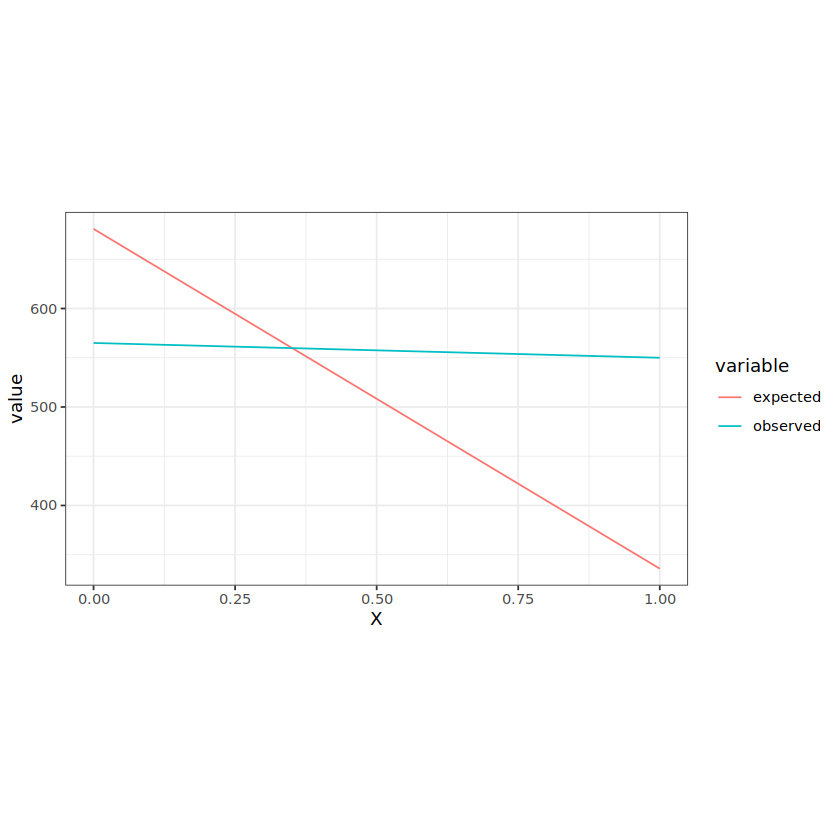

[1] "num_pass_sample 1369"
[1] "lambda:  0.772826880934989"
  X Poisson_probability expected observed
1 0           0.4617060 632.0756      565
2 1           0.3568188 488.4850      550
3 2           0.1378796 188.7572      254
[1] "sum of the prob:  0.95640446104615"
[1] 6.230613e-08


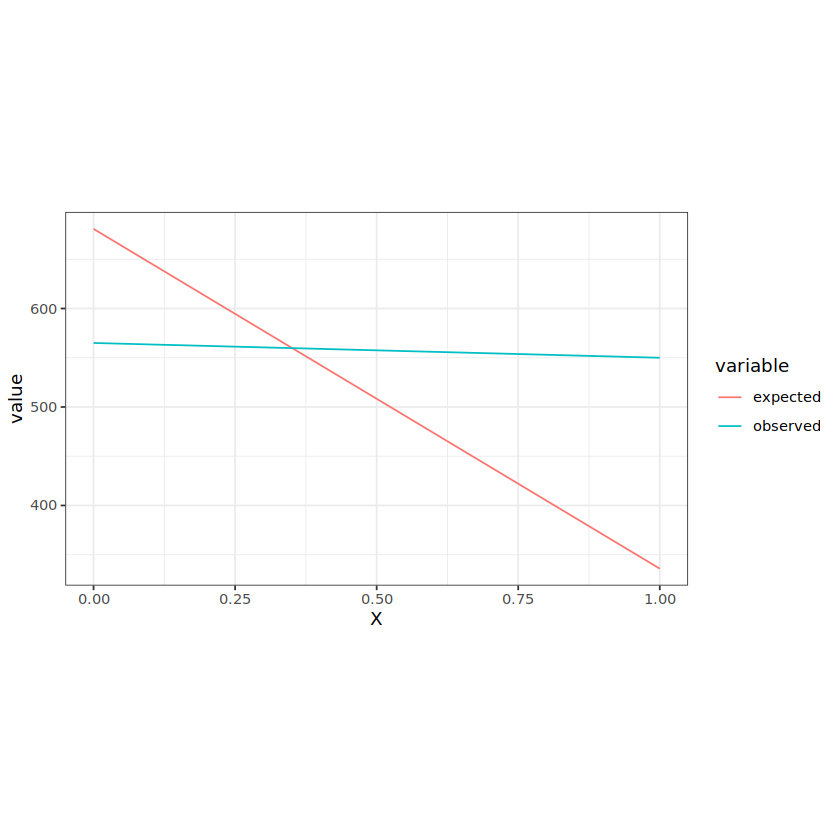

[1] "num_pass_sample 1369"
[1] "lambda:  0.772826880934989"
  X Poisson_probability expected observed
1 0           0.4617060 632.0756      565
2 1           0.3568188 488.4850      550
3 2           0.1378796 188.7572      254
[1] "sum of the prob:  0.95640446104615"
[1] 6.230613e-08


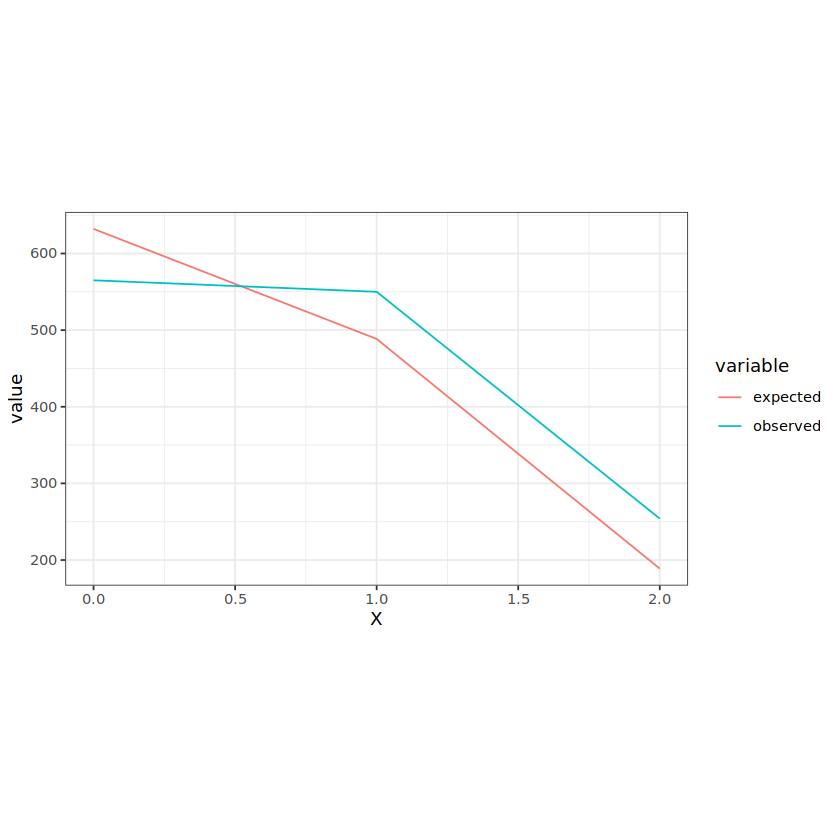

[1] "num_pass_sample 1473"
[1] "lambda:  0.930074677528853"
  X Poisson_probability  expected observed
1 0          0.39452425 581.13422      565
2 1          0.36693701 540.49822      550
3 2          0.17063941 251.35185      254
4 3          0.05290247  77.92533      104
[1] "sum of the prob:  0.985003135905866"
[1] 0.03070643


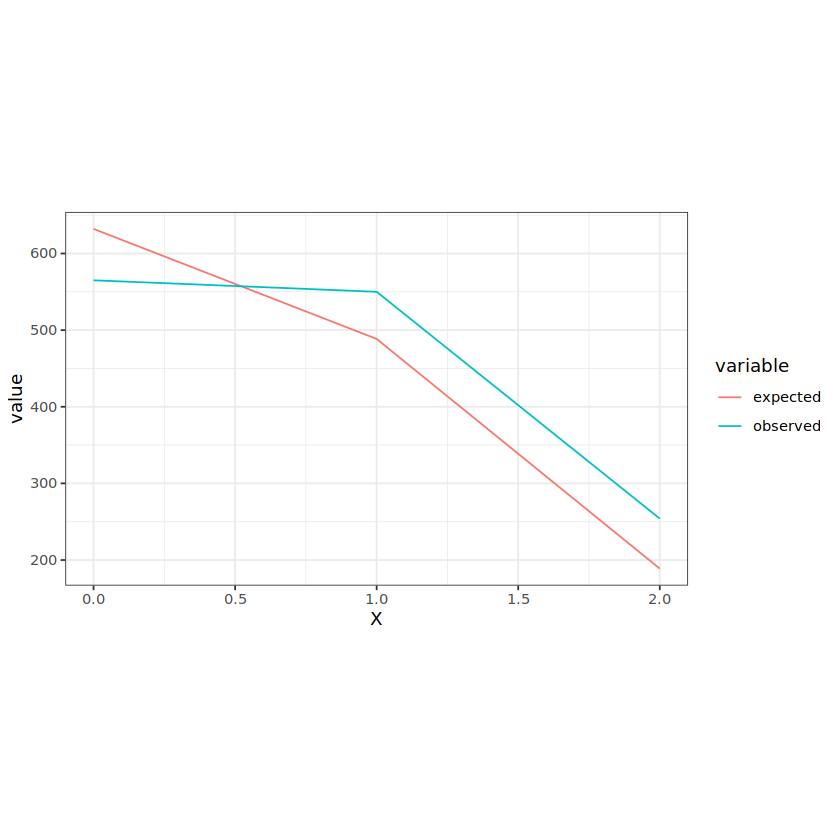

[1] "num_pass_sample 1473"
[1] "lambda:  0.930074677528853"
  X Poisson_probability  expected observed
1 0          0.39452425 581.13422      565
2 1          0.36693701 540.49822      550
3 2          0.17063941 251.35185      254
4 3          0.05290247  77.92533      104
[1] "sum of the prob:  0.985003135905866"
[1] 0.03070643


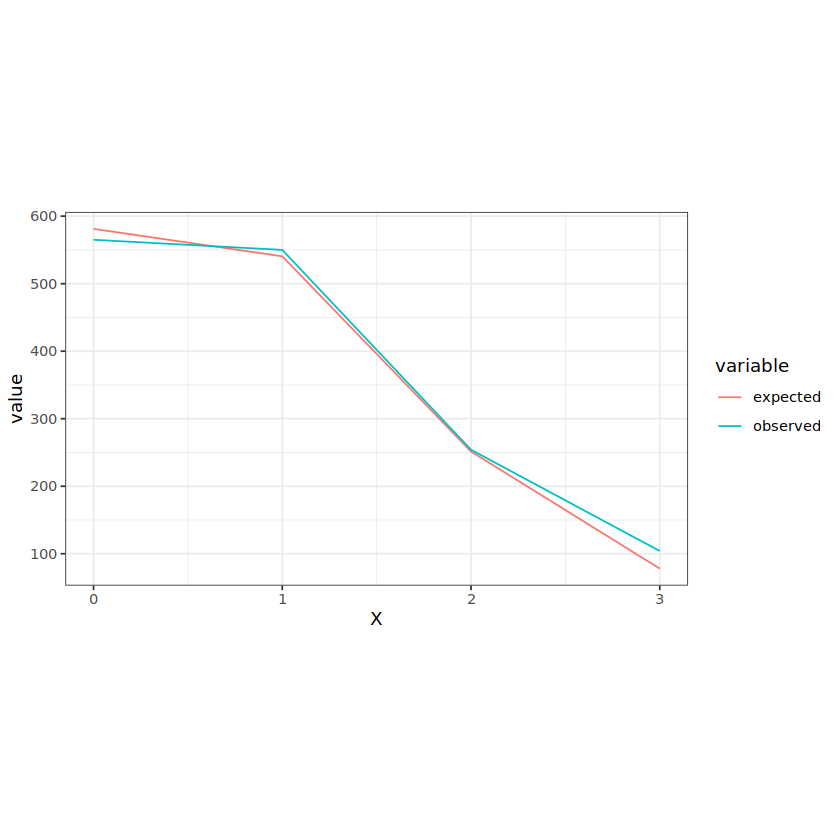

[1] "num_pass_sample 1500"
[1] "lambda:  0.985333333333333"
  X Poisson_probability  expected observed
1 0          0.37331477 559.97215      565
2 1          0.36783948 551.75923      550
3 2          0.18122225 271.83338      254
4 3          0.05952144  89.28216      104
5 4          0.01466212  21.99317       27
[1] "sum of the prob:  0.996560062780454"
[1] 0.3136497


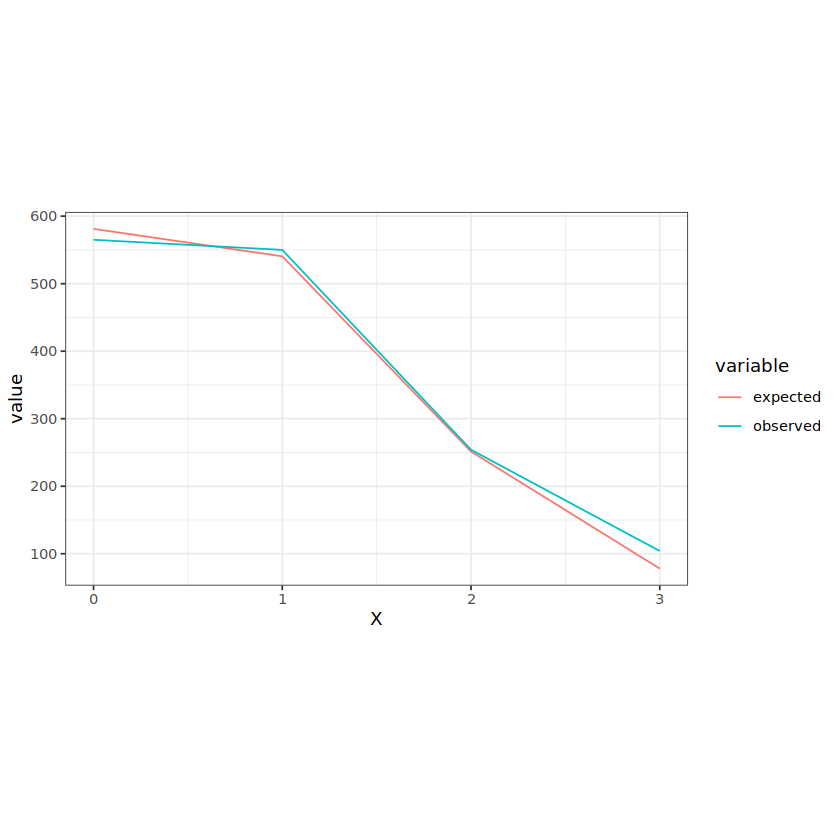

[1] "num_pass_sample 1500"
[1] "lambda:  0.985333333333333"
  X Poisson_probability  expected observed
1 0          0.37331477 559.97215      565
2 1          0.36783948 551.75923      550
3 2          0.18122225 271.83338      254
4 3          0.05952144  89.28216      104
5 4          0.01466212  21.99317       27
[1] "sum of the prob:  0.996560062780454"
[1] 0.3136497
[1] "num_pass_sample 1503"
[1] "lambda:  0.993346640053227"
  X Poisson_probability   expected observed
1 0         0.370335236 556.613860      565
2 1         0.367871262 552.910507      550
3 2         0.182711841 274.615897      254
4 3         0.060498731  90.929593      104
5 4         0.015024053  22.581151       27
6 5         0.002984818   4.486182        3
[1] "sum of the prob:  0.999425942370542"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


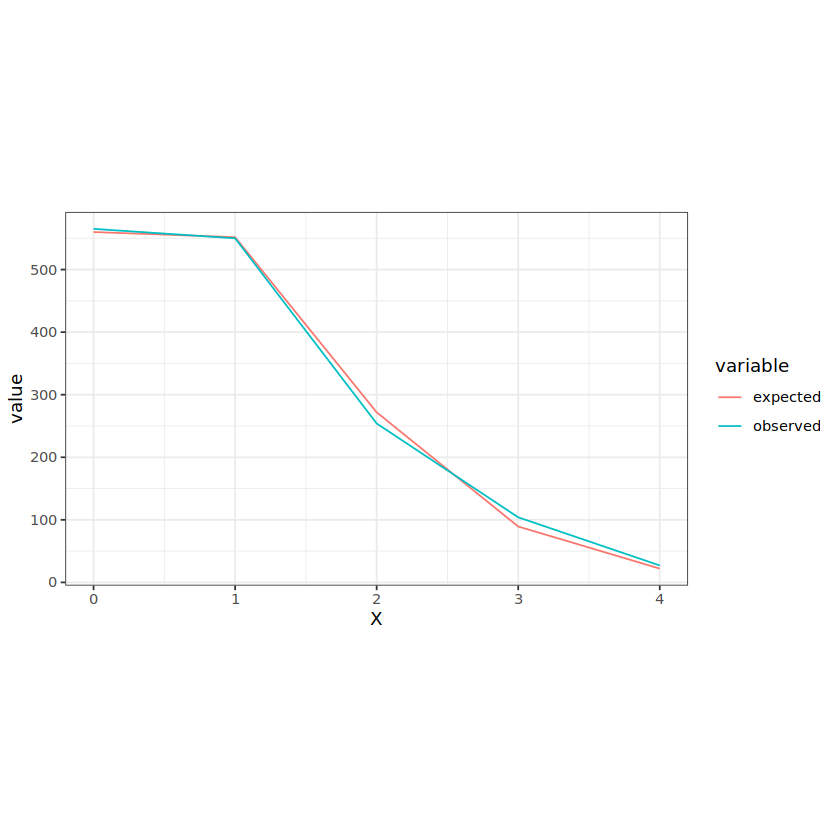

[1] 0.4254931
[1] "num_pass_sample 1503"
[1] "lambda:  0.993346640053227"
  X Poisson_probability   expected observed
1 0         0.370335236 556.613860      565
2 1         0.367871262 552.910507      550
3 2         0.182711841 274.615897      254
4 3         0.060498731  90.929593      104
5 4         0.015024053  22.581151       27
6 5         0.002984818   4.486182        3
[1] "sum of the prob:  0.999425942370542"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


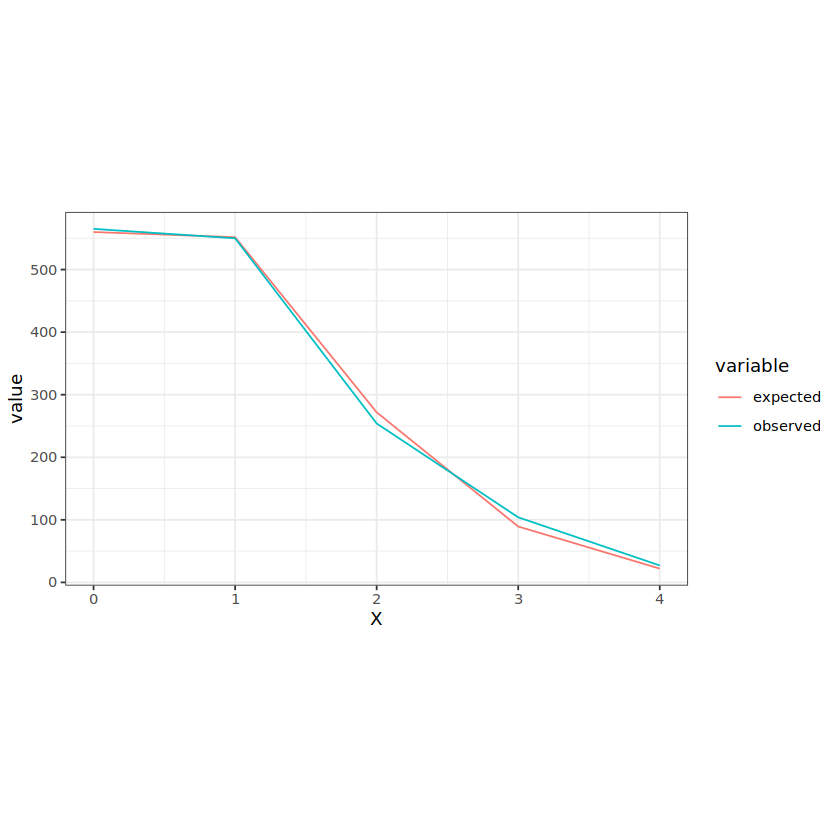

[1] 0.4254931
[1] "num_pass_sample 1506"
[1] "lambda:  1.00332005312085"
  X Poisson_probability    expected observed
1 0        0.3666600872 552.1900913      565
2 1        0.3678774181 554.0233917      550
3 2        0.1845493954 277.9313894      254
4 3        0.0617207030  92.9513788      104
5 4        0.0154814048  23.3149956       27
6 5        0.0031065608   4.6784805        3
7 6        0.0005194791   0.7823356        3
[1] "sum of the prob:  0.999915048351244"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


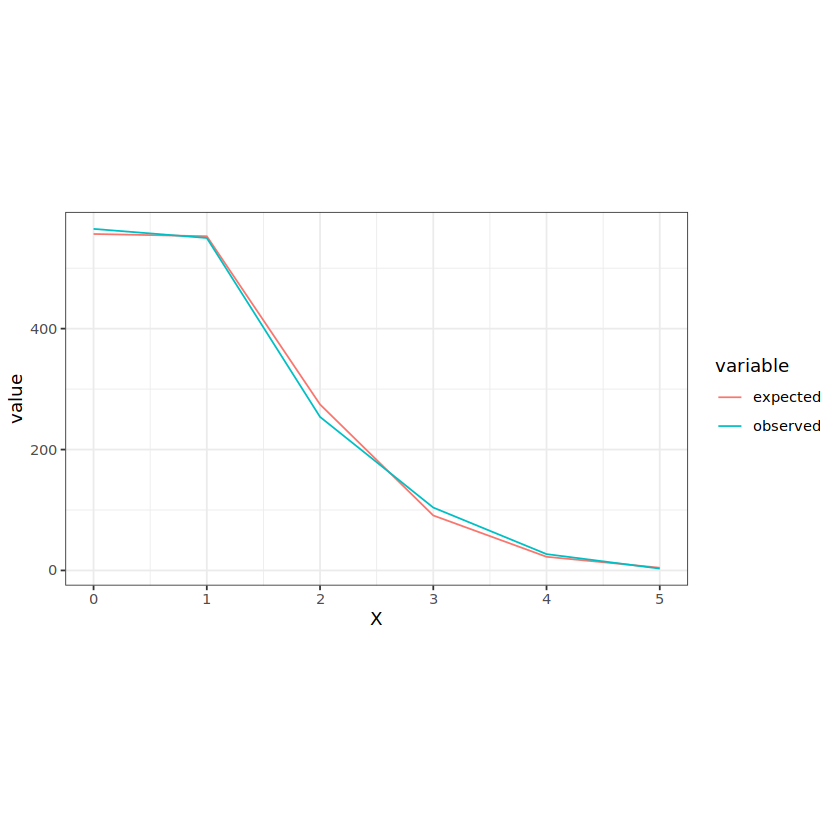

[1] 0.08325366
[1] "num_pass_sample 1506"
[1] "lambda:  1.00332005312085"
  X Poisson_probability    expected observed
1 0        0.3666600872 552.1900913      565
2 1        0.3678774181 554.0233917      550
3 2        0.1845493954 277.9313894      254
4 3        0.0617207030  92.9513788      104
5 4        0.0154814048  23.3149956       27
6 5        0.0031065608   4.6784805        3
7 6        0.0005194791   0.7823356        3
[1] "sum of the prob:  0.999915048351244"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


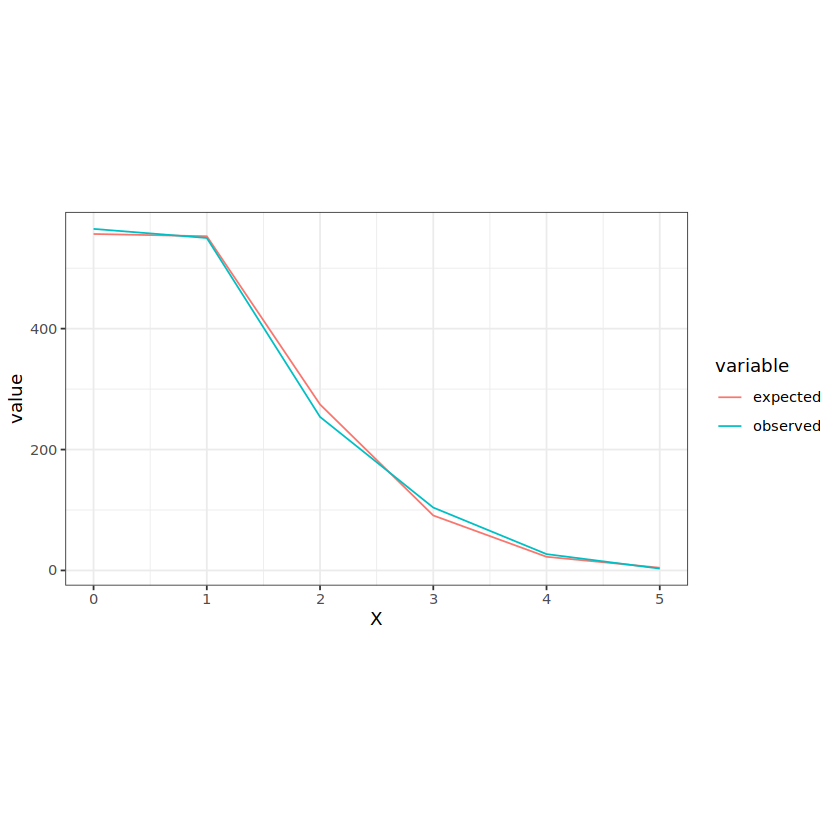

[1] 0.08325366
[1] "num_pass_sample 1508"
[1] "lambda:  1.01127320954907"
  X Poisson_probability    expected observed
1 0        0.3637555476 548.5433657      565
2 1        0.3678562401 554.7272101      550
3 2        0.1860015803 280.4903831      254
4 3        0.0626994717  94.5508033      104
5 4        0.0158515740  23.9041736       27
6 5        0.0032060544   4.8347301        3
7 6        0.0005403662   0.8148722        3
8 7        0.0000780654   0.1177226        2
[1] "sum of the prob:  0.999988899610578"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


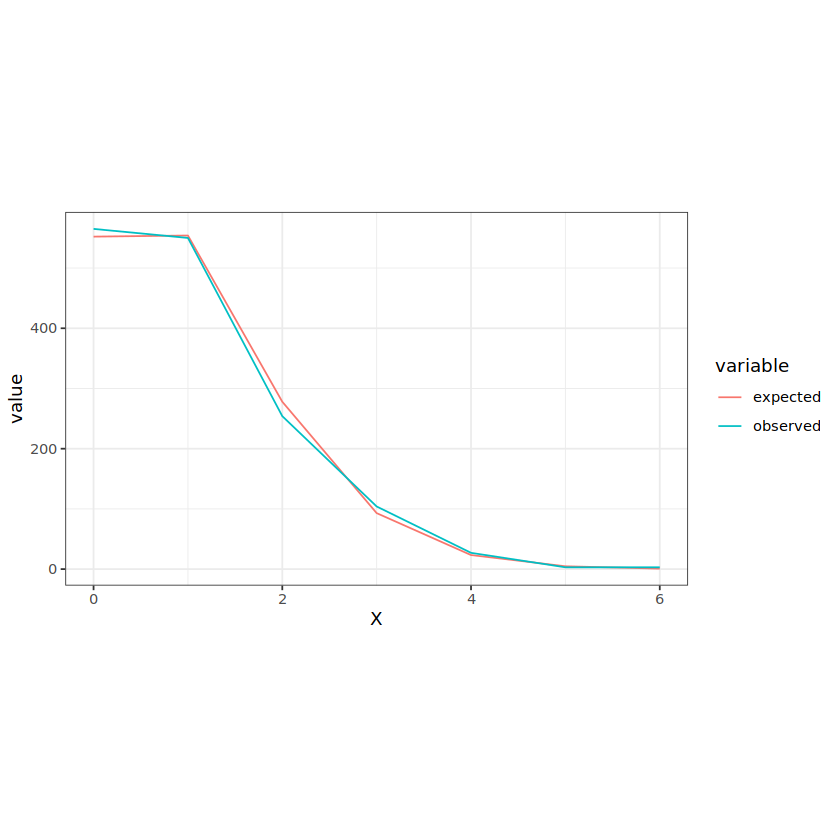

[1] 7.980987e-07
[1] "num_pass_sample 1508"
[1] "lambda:  1.01127320954907"
  X Poisson_probability    expected observed
1 0        0.3637555476 548.5433657      565
2 1        0.3678562401 554.7272101      550
3 2        0.1860015803 280.4903831      254
4 3        0.0626994717  94.5508033      104
5 4        0.0158515740  23.9041736       27
6 5        0.0032060544   4.8347301        3
7 6        0.0005403662   0.8148722        3
8 7        0.0000780654   0.1177226        2
[1] "sum of the prob:  0.999988899610578"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


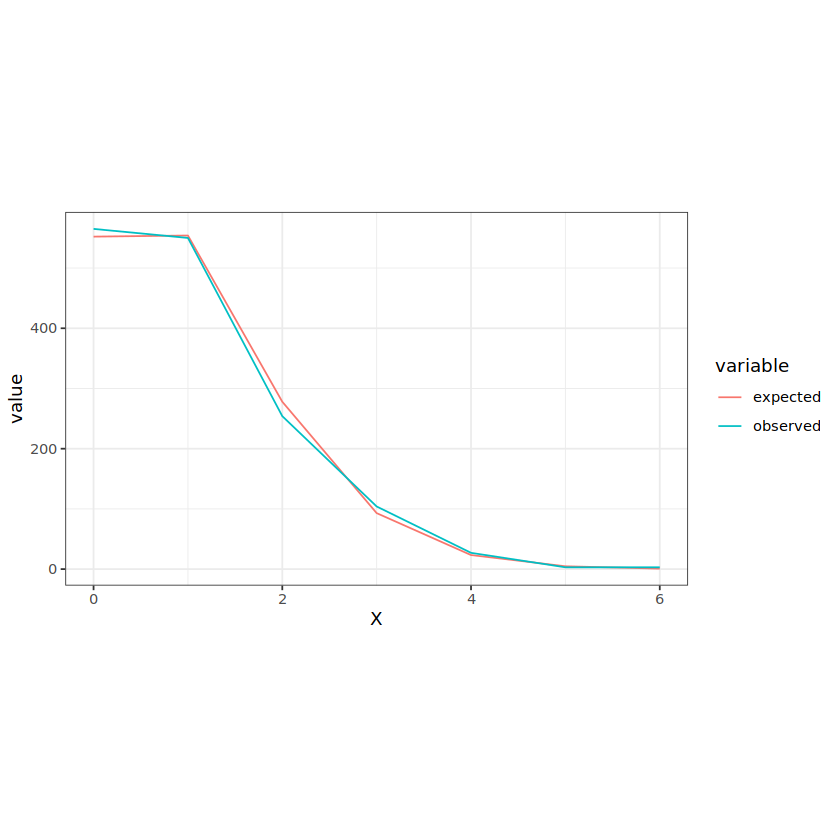

[1] 7.980987e-07
[1] "num_pass_sample 1509"
[1] "lambda:  1.01590457256461"
  X Poisson_probability     expected observed
1 0        3.620748e-01 546.37081097      565
2 1        3.678334e-01 555.06060518      550
3 2        1.868418e-01 281.94430343      254
4 3        6.327115e-02  95.47616902      104
5 4        1.606936e-02  24.24866917       27
6 5        3.264988e-03   4.92686678        3
7 6        5.528194e-04   0.83420441        3
8 7        8.023025e-05   0.12106744        2
9 8        1.018828e-05   0.01537412        1
[1] "sum of the prob:  0.999998721350774"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


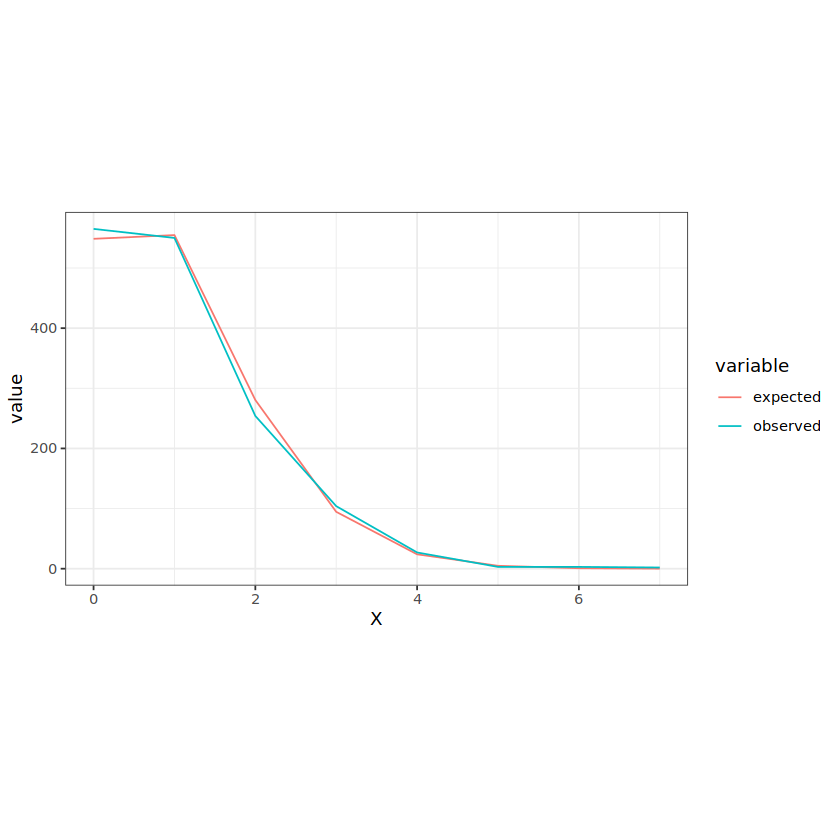

[1] 9.815562e-19
[1] "num_pass_sample 1509"
[1] "lambda:  1.01590457256461"
  X Poisson_probability     expected observed
1 0        3.620748e-01 546.37081097      565
2 1        3.678334e-01 555.06060518      550
3 2        1.868418e-01 281.94430343      254
4 3        6.327115e-02  95.47616902      104
5 4        1.606936e-02  24.24866917       27
6 5        3.264988e-03   4.92686678        3
7 6        5.528194e-04   0.83420441        3
8 7        8.023025e-05   0.12106744        2
9 8        1.018828e-05   0.01537412        1
[1] "sum of the prob:  0.999998721350774"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


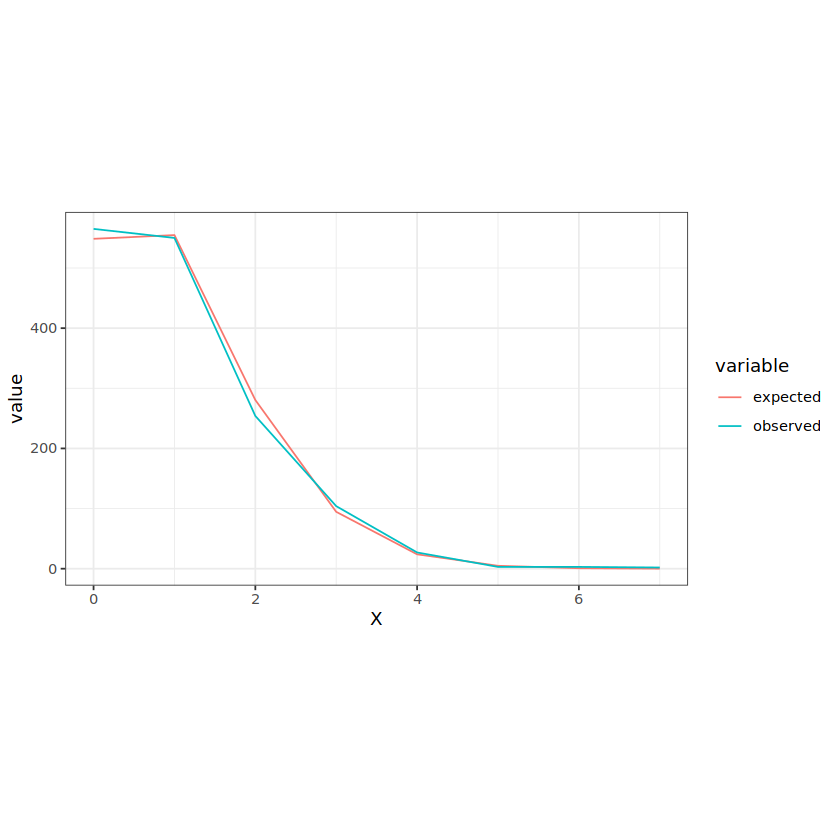

[1] 9.815562e-19
[1] "num_pass_sample 1509"
[1] "lambda:  1.01590457256461"
   X Poisson_probability     expected observed
1  0        3.620748e-01 5.463708e+02      565
2  1        3.678334e-01 5.550606e+02      550
3  2        1.868418e-01 2.819443e+02      254
4  3        6.327115e-02 9.547617e+01      104
5  4        1.606936e-02 2.424867e+01       27
6  5        3.264988e-03 4.926867e+00        3
7  6        5.528194e-04 8.342044e-01        3
8  7        8.023025e-05 1.210674e-01        2
9  8        1.018828e-05 1.537412e-02        1
10 9        1.150036e-06 1.735404e-03        0
[1] "sum of the prob:  0.99999987138682"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


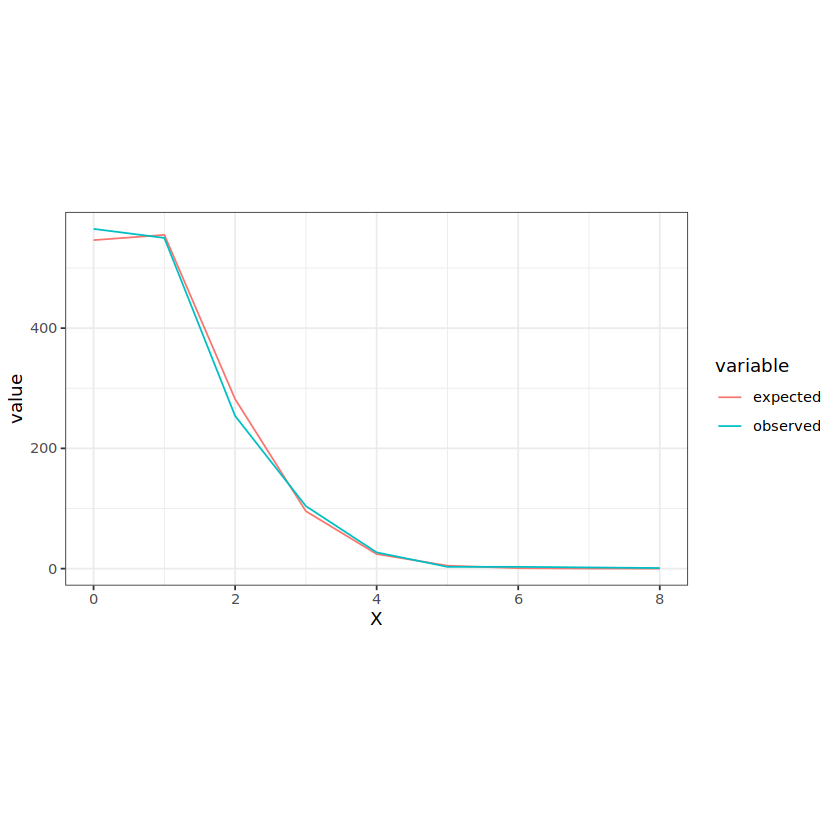

[1] 3.669431e-18
[1] "num_pass_sample 1509"
[1] "lambda:  1.01590457256461"
   X Poisson_probability     expected observed
1  0        3.620748e-01 5.463708e+02      565
2  1        3.678334e-01 5.550606e+02      550
3  2        1.868418e-01 2.819443e+02      254
4  3        6.327115e-02 9.547617e+01      104
5  4        1.606936e-02 2.424867e+01       27
6  5        3.264988e-03 4.926867e+00        3
7  6        5.528194e-04 8.342044e-01        3
8  7        8.023025e-05 1.210674e-01        2
9  8        1.018828e-05 1.537412e-02        1
10 9        1.150036e-06 1.735404e-03        0
[1] "sum of the prob:  0.99999987138682"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


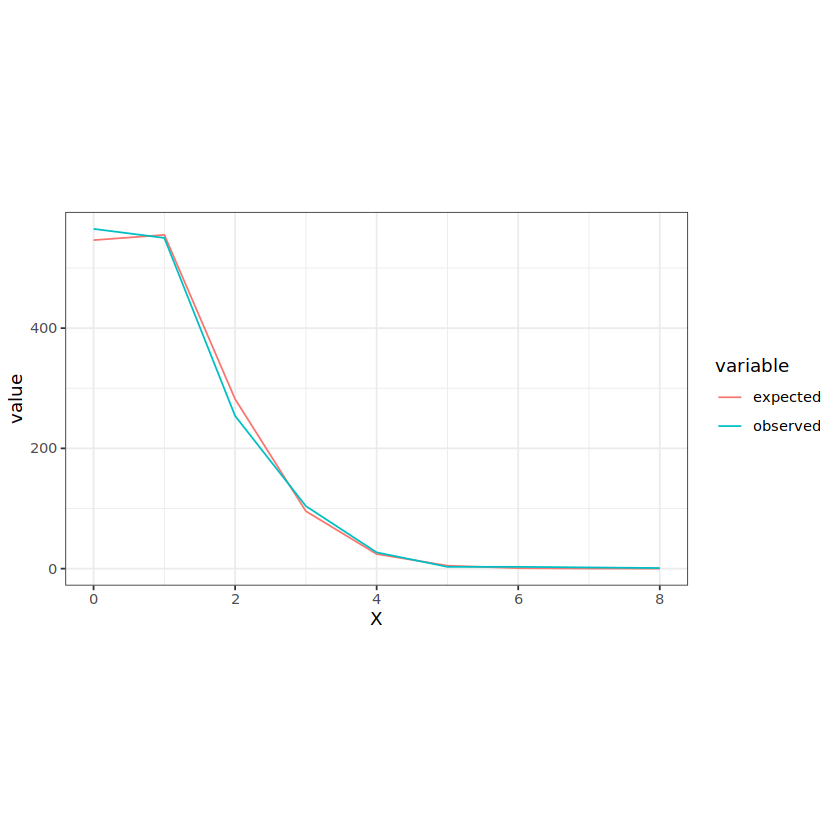

[1] 3.669431e-18
[1] "num_pass_sample 1511"
[1] "lambda:  1.02779616148246"
    X Poisson_probability     expected observed
1   0        3.577946e-01 5.406277e+02      565
2   1        3.677399e-01 5.556550e+02      550
3   2        1.889808e-01 2.855501e+02      254
4   3        6.474460e-02 9.782908e+01      104
5   4        1.663606e-02 2.513709e+01       27
6   5        3.419696e-03 5.167161e+00        3
7   6        5.857917e-04 8.851313e-01        3
8   7        8.601064e-05 1.299621e-01        2
9   8        1.105018e-05 1.669682e-02        1
10  9        1.261925e-06 1.906769e-03        0
11 10        1.297002e-07 1.959770e-04        2
[1] "sum of the prob:  0.999999986754841"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


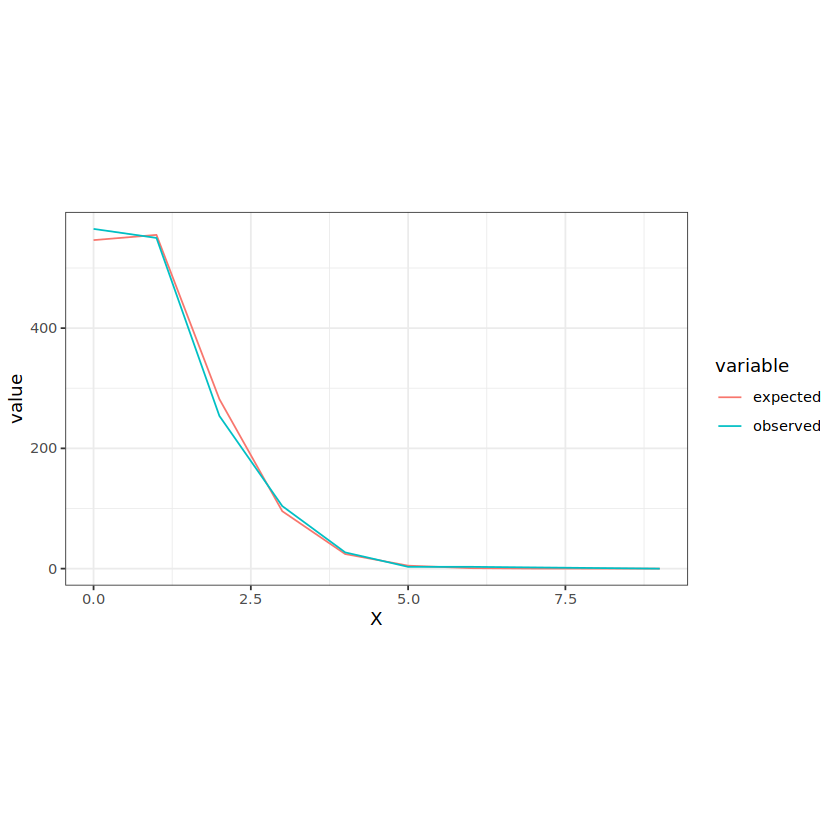

[1] 0
[1] "num_pass_sample 1511"
[1] "lambda:  1.02779616148246"
    X Poisson_probability     expected observed
1   0        3.577946e-01 5.406277e+02      565
2   1        3.677399e-01 5.556550e+02      550
3   2        1.889808e-01 2.855501e+02      254
4   3        6.474460e-02 9.782908e+01      104
5   4        1.663606e-02 2.513709e+01       27
6   5        3.419696e-03 5.167161e+00        3
7   6        5.857917e-04 8.851313e-01        3
8   7        8.601064e-05 1.299621e-01        2
9   8        1.105018e-05 1.669682e-02        1
10  9        1.261925e-06 1.906769e-03        0
11 10        1.297002e-07 1.959770e-04        2
[1] "sum of the prob:  0.999999986754841"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


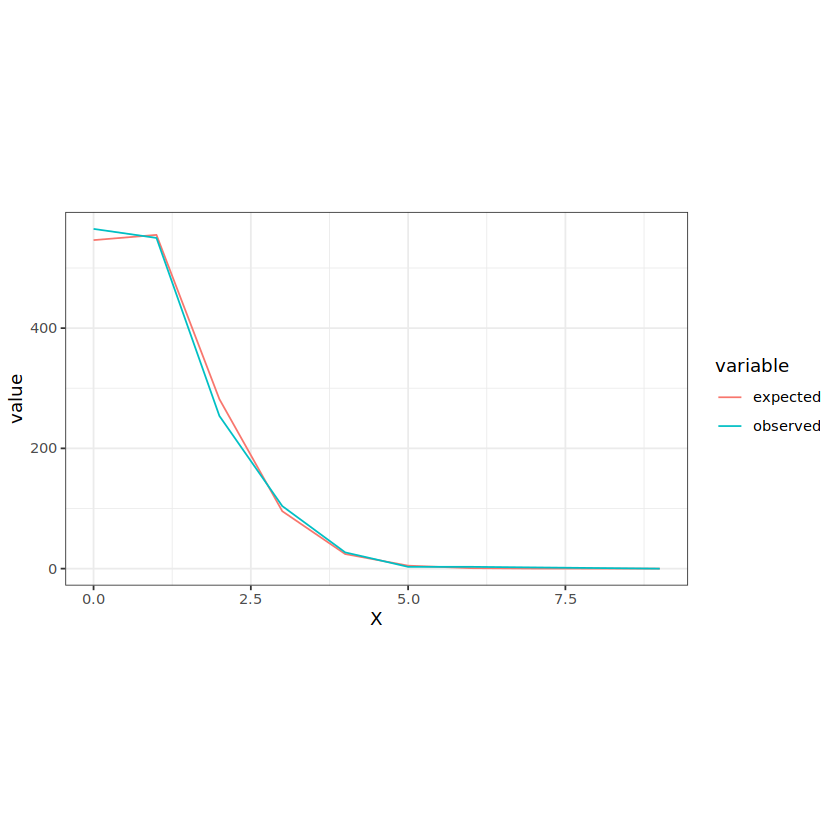

[1] 0
[1] "num_pass_sample 1511"
[1] "lambda:  1.02779616148246"
    X Poisson_probability     expected observed
1   0        3.577946e-01 5.406277e+02      565
2   1        3.677399e-01 5.556550e+02      550
3   2        1.889808e-01 2.855501e+02      254
4   3        6.474460e-02 9.782908e+01      104
5   4        1.663606e-02 2.513709e+01       27
6   5        3.419696e-03 5.167161e+00        3
7   6        5.857917e-04 8.851313e-01        3
8   7        8.601064e-05 1.299621e-01        2
9   8        1.105018e-05 1.669682e-02        1
10  9        1.261925e-06 1.906769e-03        0
11 10        1.297002e-07 1.959770e-04        2
12 11        1.211867e-08 1.831131e-05        0
[1] "sum of the prob:  0.999999998873512"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


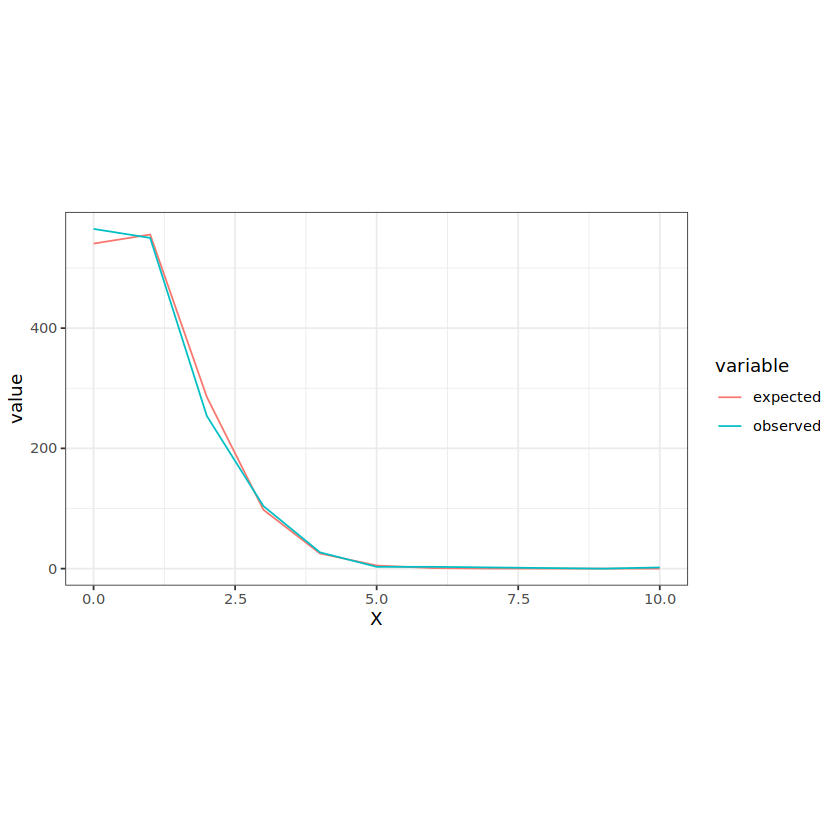

[1] 0
[1] "num_pass_sample 1511"
[1] "lambda:  1.02779616148246"
    X Poisson_probability     expected observed
1   0        3.577946e-01 5.406277e+02      565
2   1        3.677399e-01 5.556550e+02      550
3   2        1.889808e-01 2.855501e+02      254
4   3        6.474460e-02 9.782908e+01      104
5   4        1.663606e-02 2.513709e+01       27
6   5        3.419696e-03 5.167161e+00        3
7   6        5.857917e-04 8.851313e-01        3
8   7        8.601064e-05 1.299621e-01        2
9   8        1.105018e-05 1.669682e-02        1
10  9        1.261925e-06 1.906769e-03        0
11 10        1.297002e-07 1.959770e-04        2
12 11        1.211867e-08 1.831131e-05        0
[1] "sum of the prob:  0.999999998873512"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


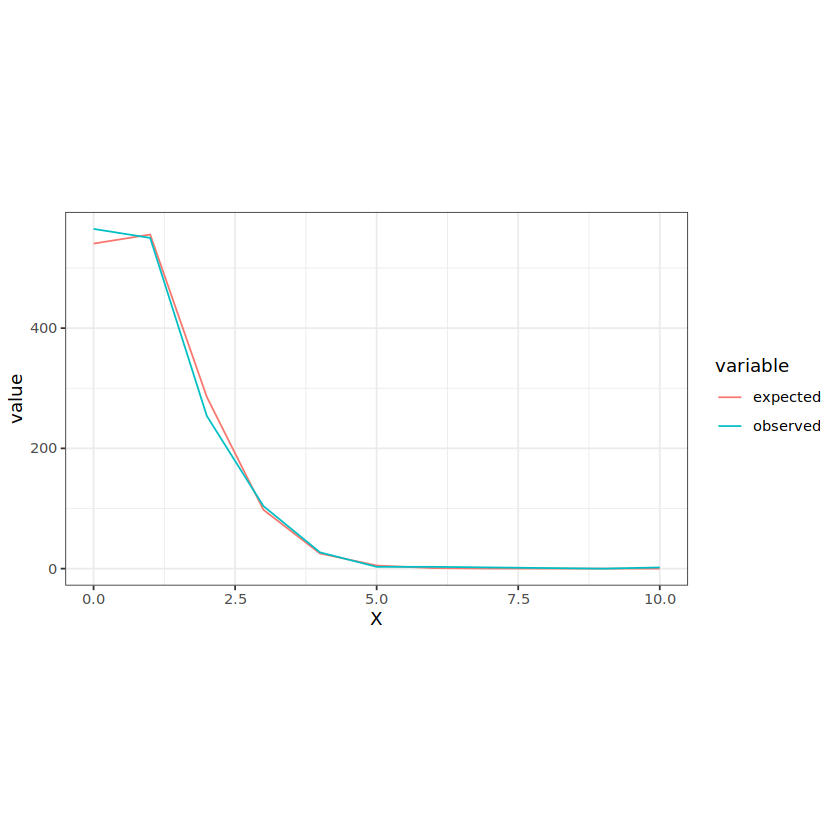

[1] 0
[1] "num_pass_sample 1512"
[1] "lambda:  1.03505291005291"
    X Poisson_probability     expected observed
1   0        3.552076e-01 5.370739e+02      565
2   1        3.676586e-01 5.558999e+02      550
3   2        1.902731e-01 2.876929e+02      254
4   3        6.564757e-02 9.925912e+01      104
5   4        1.698718e-02 2.568461e+01       27
6   5        3.516525e-03 5.316986e+00        3
7   6        6.066316e-04 9.172270e-01        3
8   7        8.969940e-05 1.356255e-01        2
9   8        1.160545e-05 1.754745e-02        1
10  9        1.334695e-06 2.018059e-03        0
11 10        1.381480e-07 2.088798e-04        2
12 11        1.299914e-08 1.965470e-05        0
13 12        1.121233e-09 1.695304e-06        1
[1] "sum of the prob:  0.999999999903641"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


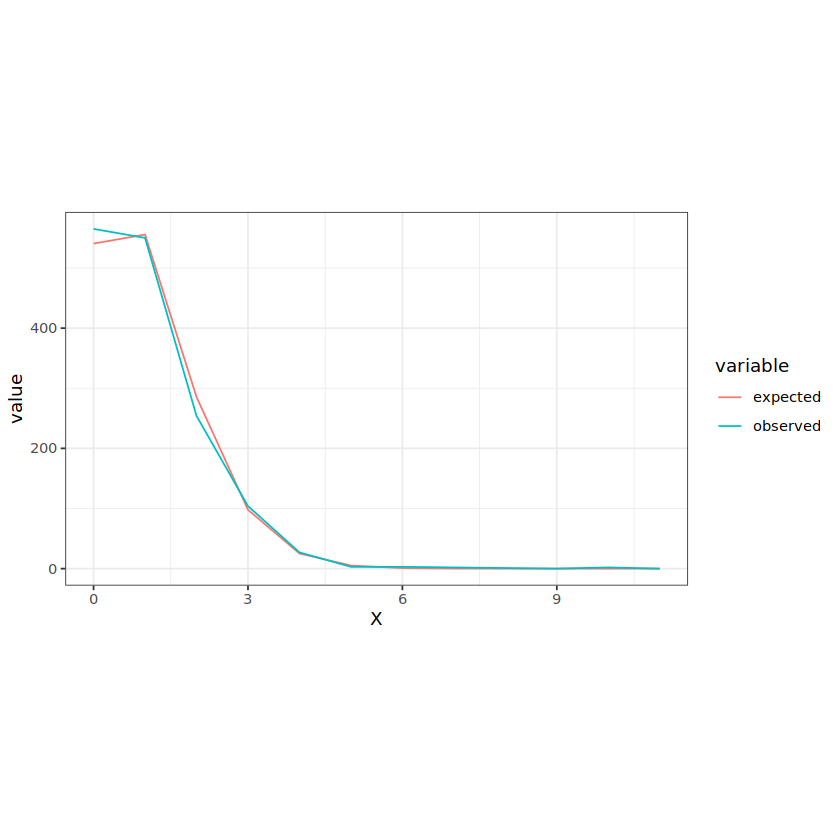

[1] 0
[1] "num_pass_sample 1512"
[1] "lambda:  1.03505291005291"
    X Poisson_probability     expected observed
1   0        3.552076e-01 5.370739e+02      565
2   1        3.676586e-01 5.558999e+02      550
3   2        1.902731e-01 2.876929e+02      254
4   3        6.564757e-02 9.925912e+01      104
5   4        1.698718e-02 2.568461e+01       27
6   5        3.516525e-03 5.316986e+00        3
7   6        6.066316e-04 9.172270e-01        3
8   7        8.969940e-05 1.356255e-01        2
9   8        1.160545e-05 1.754745e-02        1
10  9        1.334695e-06 2.018059e-03        0
11 10        1.381480e-07 2.088798e-04        2
12 11        1.299914e-08 1.965470e-05        0
13 12        1.121233e-09 1.695304e-06        1
[1] "sum of the prob:  0.999999999903641"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


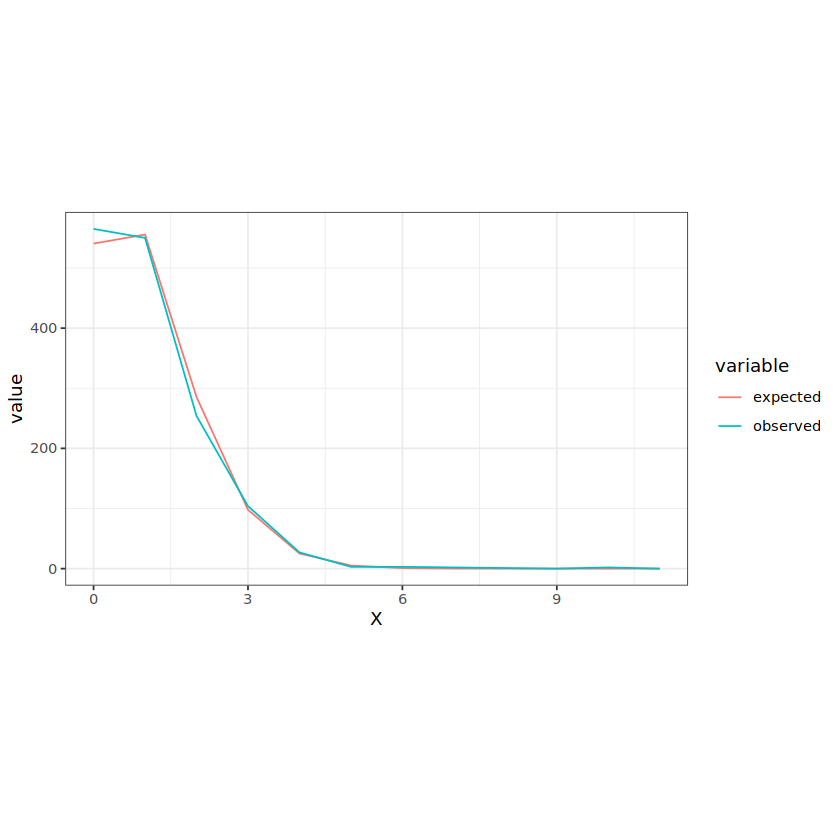

[1] 0
[1] "num_pass_sample 1512"
[1] "lambda:  1.03505291005291"
    X Poisson_probability     expected observed
1   0        3.552076e-01 5.370739e+02      565
2   1        3.676586e-01 5.558999e+02      550
3   2        1.902731e-01 2.876929e+02      254
4   3        6.564757e-02 9.925912e+01      104
5   4        1.698718e-02 2.568461e+01       27
6   5        3.516525e-03 5.316986e+00        3
7   6        6.066316e-04 9.172270e-01        3
8   7        8.969940e-05 1.356255e-01        2
9   8        1.160545e-05 1.754745e-02        1
10  9        1.334695e-06 2.018059e-03        0
11 10        1.381480e-07 2.088798e-04        2
12 11        1.299914e-08 1.965470e-05        0
13 12        1.121233e-09 1.695304e-06        1
14 13        8.927196e-11 1.349792e-07        0
[1] "sum of the prob:  0.999999999992913"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


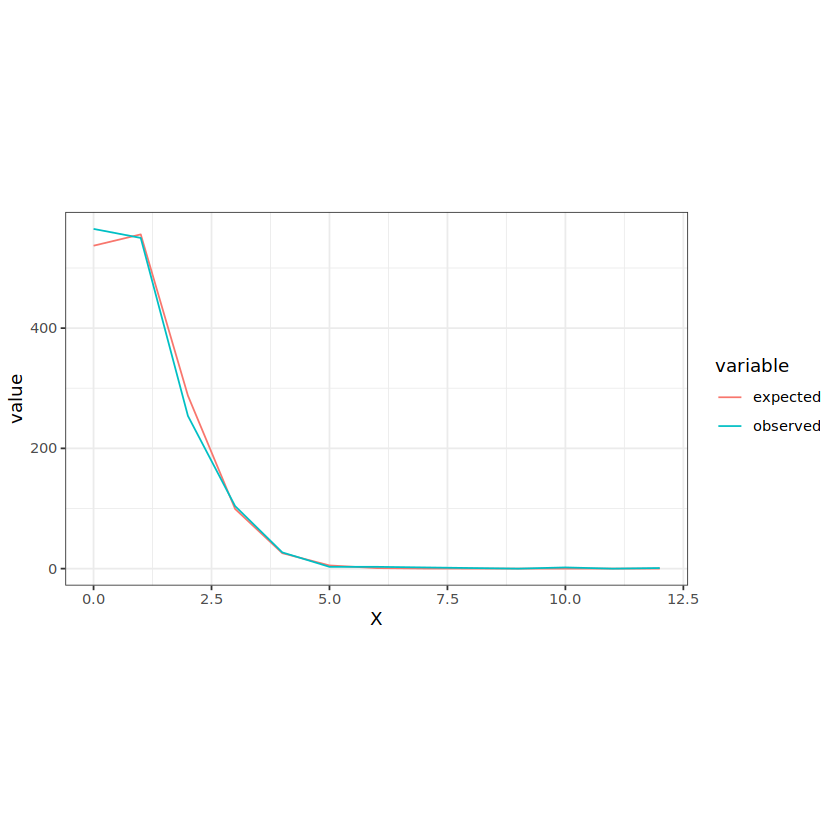

[1] 0
[1] "num_pass_sample 1512"
[1] "lambda:  1.03505291005291"
    X Poisson_probability     expected observed
1   0        3.552076e-01 5.370739e+02      565
2   1        3.676586e-01 5.558999e+02      550
3   2        1.902731e-01 2.876929e+02      254
4   3        6.564757e-02 9.925912e+01      104
5   4        1.698718e-02 2.568461e+01       27
6   5        3.516525e-03 5.316986e+00        3
7   6        6.066316e-04 9.172270e-01        3
8   7        8.969940e-05 1.356255e-01        2
9   8        1.160545e-05 1.754745e-02        1
10  9        1.334695e-06 2.018059e-03        0
11 10        1.381480e-07 2.088798e-04        2
12 11        1.299914e-08 1.965470e-05        0
13 12        1.121233e-09 1.695304e-06        1
14 13        8.927196e-11 1.349792e-07        0
[1] "sum of the prob:  0.999999999992913"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


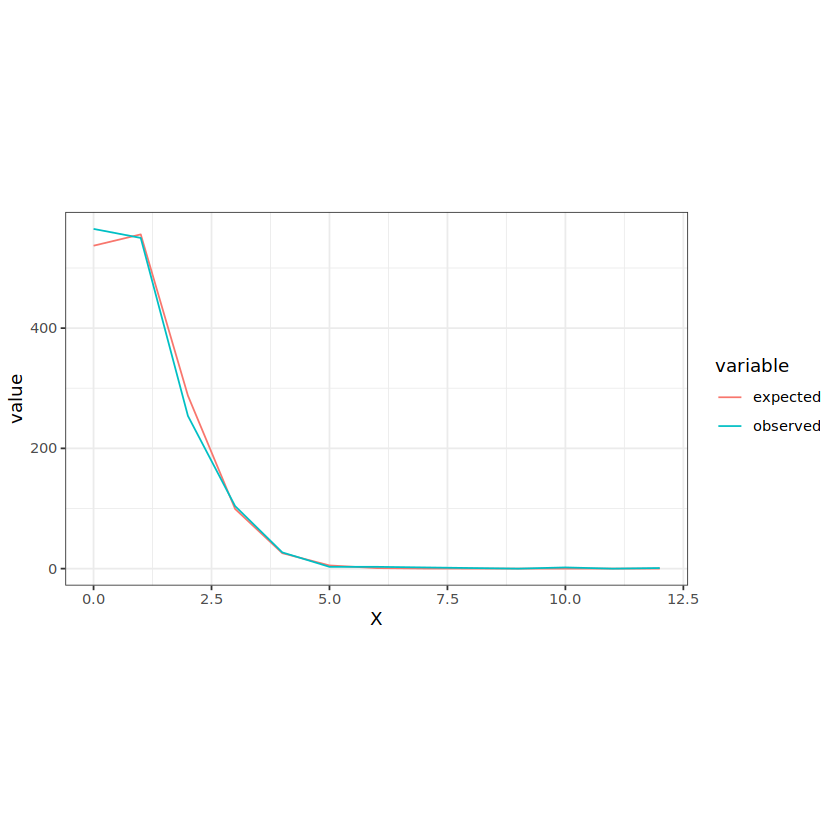

[1] 0
[1] "num_pass_sample 1512"
[1] "lambda:  1.03505291005291"
    X Poisson_probability     expected observed
1   0        3.552076e-01 5.370739e+02      565
2   1        3.676586e-01 5.558999e+02      550
3   2        1.902731e-01 2.876929e+02      254
4   3        6.564757e-02 9.925912e+01      104
5   4        1.698718e-02 2.568461e+01       27
6   5        3.516525e-03 5.316986e+00        3
7   6        6.066316e-04 9.172270e-01        3
8   7        8.969940e-05 1.356255e-01        2
9   8        1.160545e-05 1.754745e-02        1
10  9        1.334695e-06 2.018059e-03        0
11 10        1.381480e-07 2.088798e-04        2
12 11        1.299914e-08 1.965470e-05        0
13 12        1.121233e-09 1.695304e-06        1
14 13        8.927196e-11 1.349792e-07        0
15 14        6.600086e-12 9.979330e-09        0
[1] "sum of the prob:  0.999999999999513"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


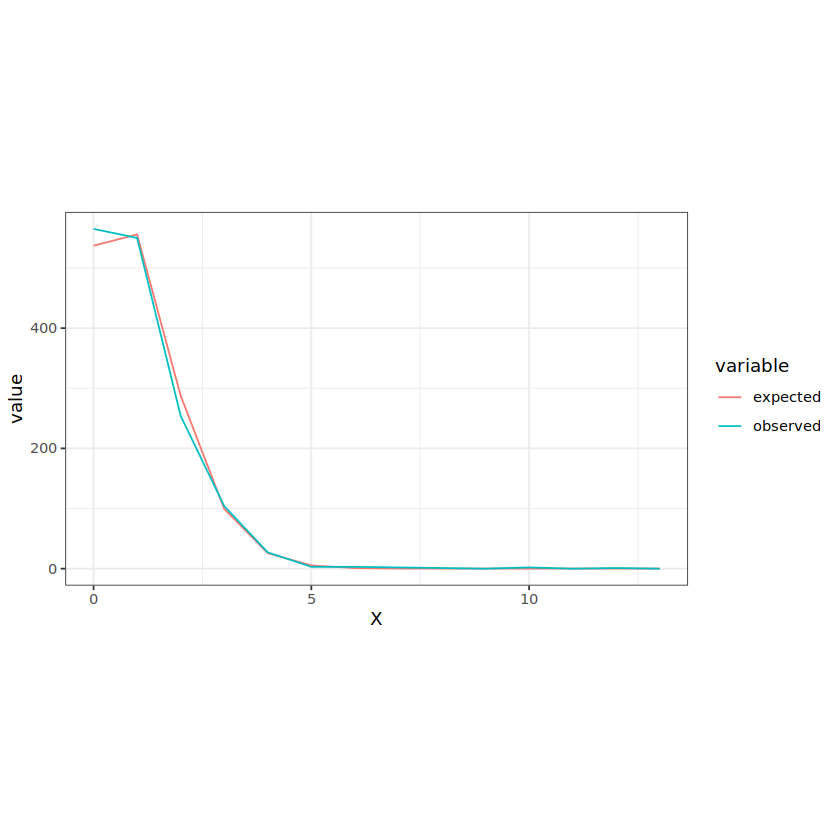

[1] 0
[1] "num_pass_sample 1512"
[1] "lambda:  1.03505291005291"
    X Poisson_probability     expected observed
1   0        3.552076e-01 5.370739e+02      565
2   1        3.676586e-01 5.558999e+02      550
3   2        1.902731e-01 2.876929e+02      254
4   3        6.564757e-02 9.925912e+01      104
5   4        1.698718e-02 2.568461e+01       27
6   5        3.516525e-03 5.316986e+00        3
7   6        6.066316e-04 9.172270e-01        3
8   7        8.969940e-05 1.356255e-01        2
9   8        1.160545e-05 1.754745e-02        1
10  9        1.334695e-06 2.018059e-03        0
11 10        1.381480e-07 2.088798e-04        2
12 11        1.299914e-08 1.965470e-05        0
13 12        1.121233e-09 1.695304e-06        1
14 13        8.927196e-11 1.349792e-07        0
15 14        6.600086e-12 9.979330e-09        0
[1] "sum of the prob:  0.999999999999513"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


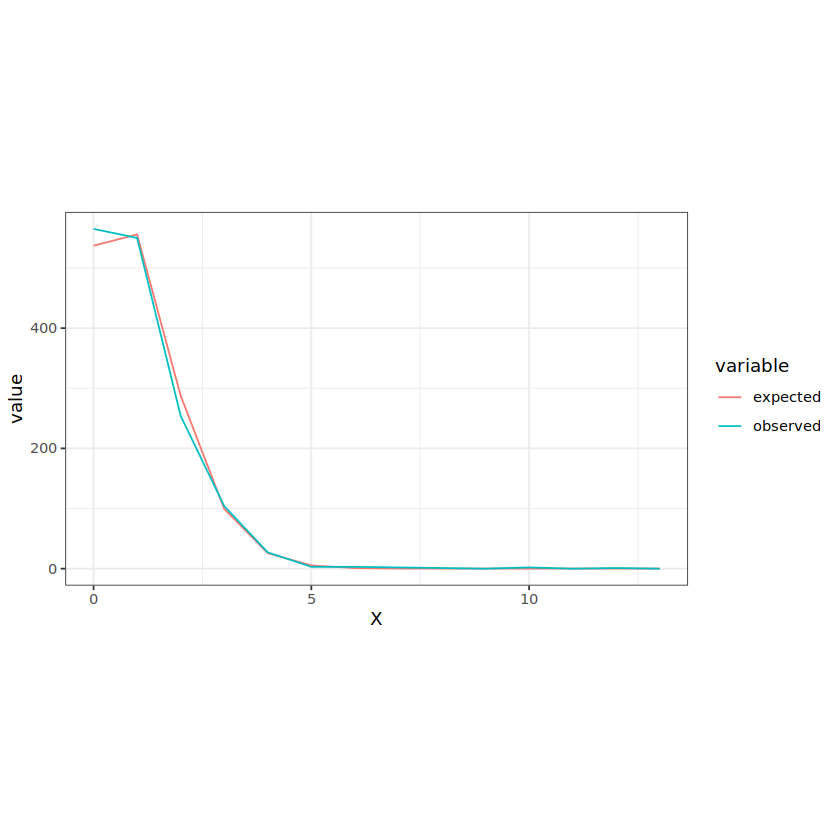

[1] 0
[1] "num_pass_sample 1512"
[1] "lambda:  1.03505291005291"
    X Poisson_probability     expected observed
1   0        3.552076e-01 5.370739e+02      565
2   1        3.676586e-01 5.558999e+02      550
3   2        1.902731e-01 2.876929e+02      254
4   3        6.564757e-02 9.925912e+01      104
5   4        1.698718e-02 2.568461e+01       27
6   5        3.516525e-03 5.316986e+00        3
7   6        6.066316e-04 9.172270e-01        3
8   7        8.969940e-05 1.356255e-01        2
9   8        1.160545e-05 1.754745e-02        1
10  9        1.334695e-06 2.018059e-03        0
11 10        1.381480e-07 2.088798e-04        2
12 11        1.299914e-08 1.965470e-05        0
13 12        1.121233e-09 1.695304e-06        1
14 13        8.927196e-11 1.349792e-07        0
15 14        6.600086e-12 9.979330e-09        0
16 15        4.554292e-13 6.886090e-10        0
[1] "sum of the prob:  0.999999999999969"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


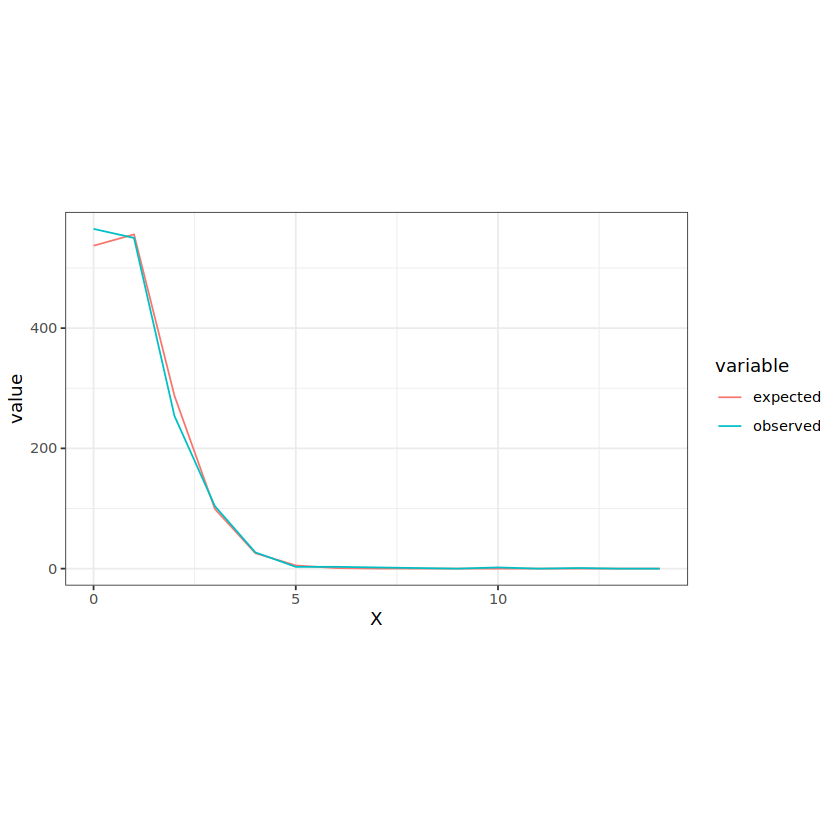

[1] 0
[1] "num_pass_sample 1512"
[1] "lambda:  1.03505291005291"
    X Poisson_probability     expected observed
1   0        3.552076e-01 5.370739e+02      565
2   1        3.676586e-01 5.558999e+02      550
3   2        1.902731e-01 2.876929e+02      254
4   3        6.564757e-02 9.925912e+01      104
5   4        1.698718e-02 2.568461e+01       27
6   5        3.516525e-03 5.316986e+00        3
7   6        6.066316e-04 9.172270e-01        3
8   7        8.969940e-05 1.356255e-01        2
9   8        1.160545e-05 1.754745e-02        1
10  9        1.334695e-06 2.018059e-03        0
11 10        1.381480e-07 2.088798e-04        2
12 11        1.299914e-08 1.965470e-05        0
13 12        1.121233e-09 1.695304e-06        1
14 13        8.927196e-11 1.349792e-07        0
15 14        6.600086e-12 9.979330e-09        0
16 15        4.554292e-13 6.886090e-10        0
[1] "sum of the prob:  0.999999999999969"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


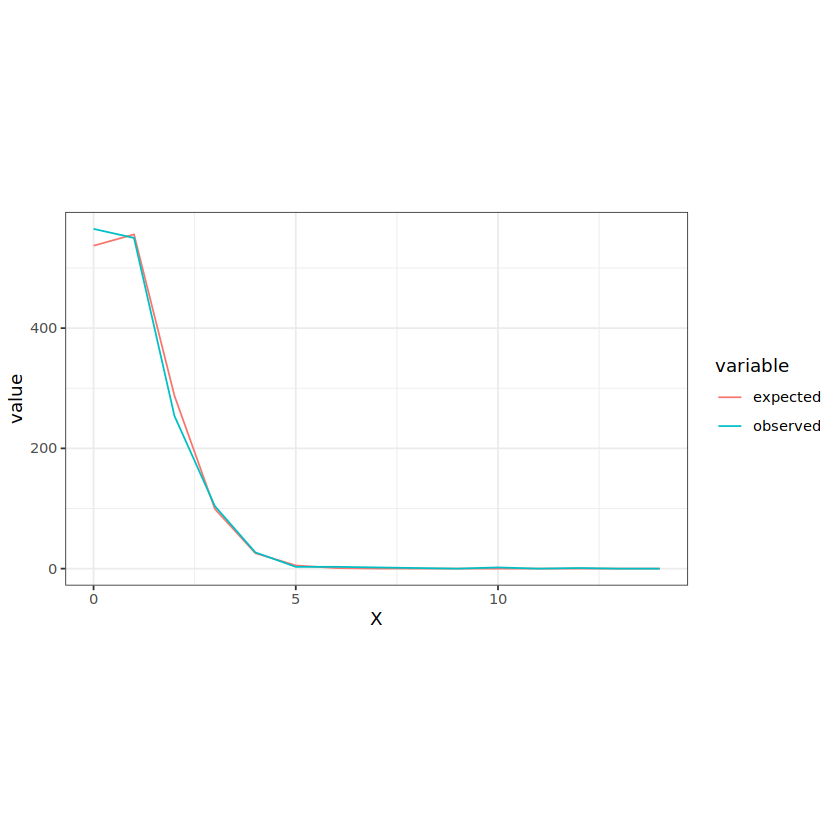

[1] 0
[1] "num_pass_sample 1512"
[1] "lambda:  1.03505291005291"
    X Poisson_probability     expected observed
1   0        3.552076e-01 5.370739e+02      565
2   1        3.676586e-01 5.558999e+02      550
3   2        1.902731e-01 2.876929e+02      254
4   3        6.564757e-02 9.925912e+01      104
5   4        1.698718e-02 2.568461e+01       27
6   5        3.516525e-03 5.316986e+00        3
7   6        6.066316e-04 9.172270e-01        3
8   7        8.969940e-05 1.356255e-01        2
9   8        1.160545e-05 1.754745e-02        1
10  9        1.334695e-06 2.018059e-03        0
11 10        1.381480e-07 2.088798e-04        2
12 11        1.299914e-08 1.965470e-05        0
13 12        1.121233e-09 1.695304e-06        1
14 13        8.927196e-11 1.349792e-07        0
15 14        6.600086e-12 9.979330e-09        0
16 15        4.554292e-13 6.886090e-10        0
17 16        2.946208e-14 4.454667e-11        0
[1] "sum of the prob:  0.999999999999998"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


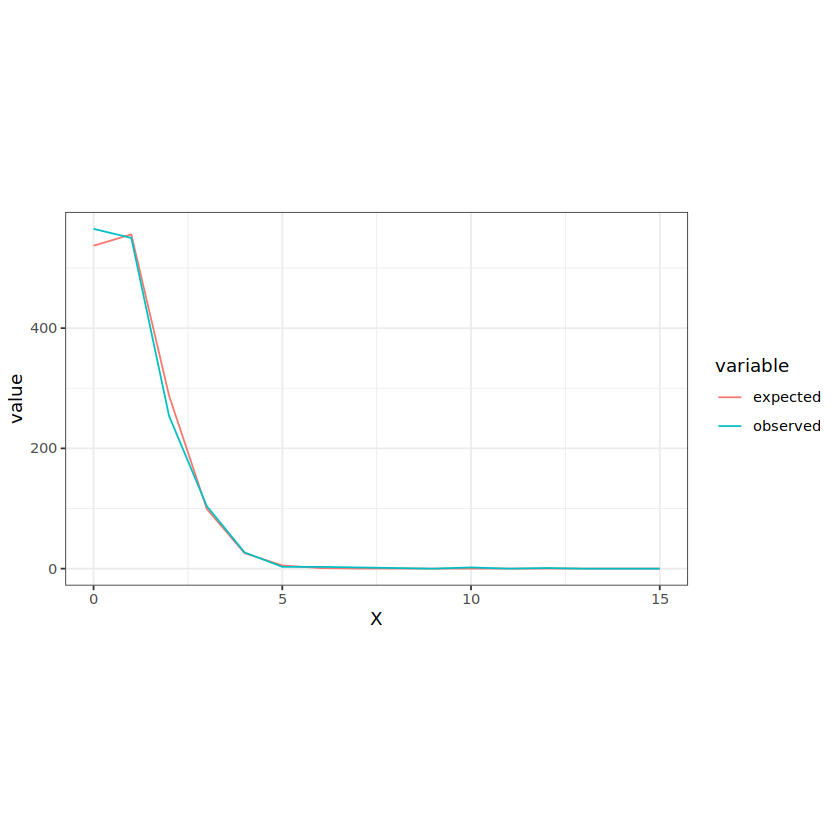

[1] 0
[1] "num_pass_sample 1512"
[1] "lambda:  1.03505291005291"
    X Poisson_probability     expected observed
1   0        3.552076e-01 5.370739e+02      565
2   1        3.676586e-01 5.558999e+02      550
3   2        1.902731e-01 2.876929e+02      254
4   3        6.564757e-02 9.925912e+01      104
5   4        1.698718e-02 2.568461e+01       27
6   5        3.516525e-03 5.316986e+00        3
7   6        6.066316e-04 9.172270e-01        3
8   7        8.969940e-05 1.356255e-01        2
9   8        1.160545e-05 1.754745e-02        1
10  9        1.334695e-06 2.018059e-03        0
11 10        1.381480e-07 2.088798e-04        2
12 11        1.299914e-08 1.965470e-05        0
13 12        1.121233e-09 1.695304e-06        1
14 13        8.927196e-11 1.349792e-07        0
15 14        6.600086e-12 9.979330e-09        0
16 15        4.554292e-13 6.886090e-10        0
17 16        2.946208e-14 4.454667e-11        0
[1] "sum of the prob:  0.999999999999998"


Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


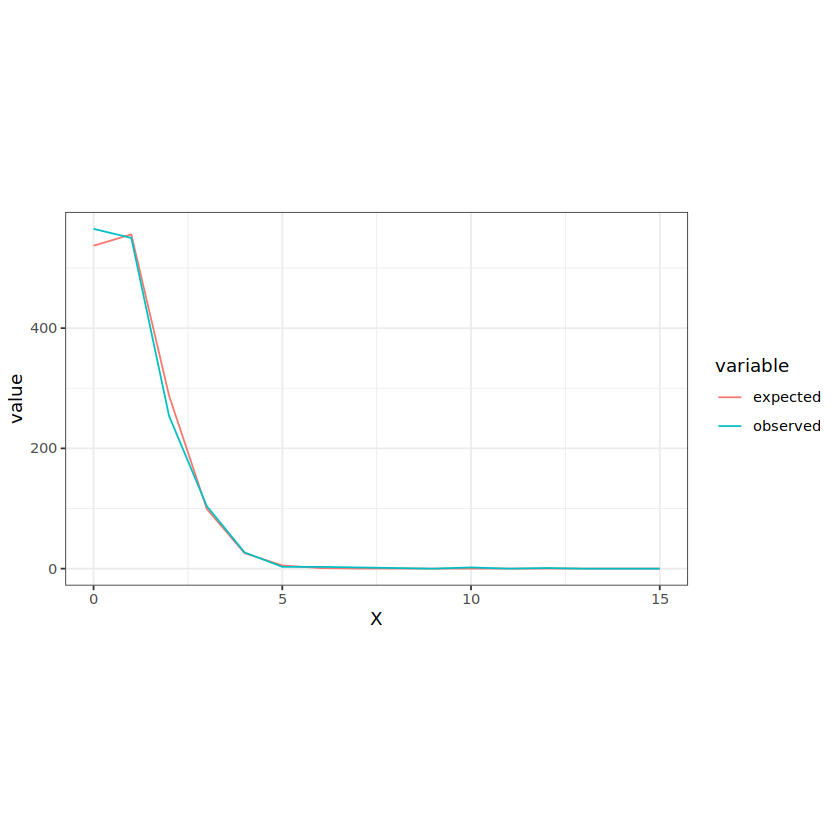

[1] 0
[1] "num_pass_sample 1512"
[1] "lambda:  1.03505291005291"
    X Poisson_probability     expected observed
1   0        3.552076e-01 5.370739e+02      565
2   1        3.676586e-01 5.558999e+02      550
3   2        1.902731e-01 2.876929e+02      254
4   3        6.564757e-02 9.925912e+01      104
5   4        1.698718e-02 2.568461e+01       27
6   5        3.516525e-03 5.316986e+00        3
7   6        6.066316e-04 9.172270e-01        3
8   7        8.969940e-05 1.356255e-01        2
9   8        1.160545e-05 1.754745e-02        1
10  9        1.334695e-06 2.018059e-03        0
11 10        1.381480e-07 2.088798e-04        2
12 11        1.299914e-08 1.965470e-05        0
13 12        1.121233e-09 1.695304e-06        1
14 13        8.927196e-11 1.349792e-07        0
15 14        6.600086e-12 9.979330e-09        0
16 15        4.554292e-13 6.886090e-10        0
17 16        2.946208e-14 4.454667e-11        0
18 17        1.793813e-15 2.712245e-12        0
[1] "sum of the prob:  

Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


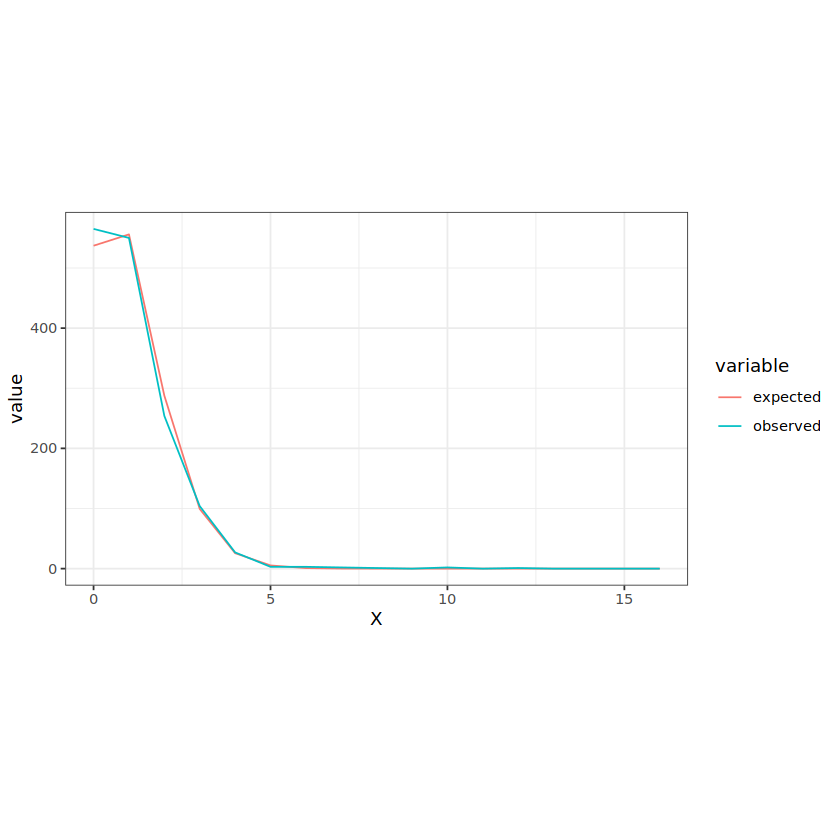

[1] 0
[1] "num_pass_sample 1512"
[1] "lambda:  1.03505291005291"
    X Poisson_probability     expected observed
1   0        3.552076e-01 5.370739e+02      565
2   1        3.676586e-01 5.558999e+02      550
3   2        1.902731e-01 2.876929e+02      254
4   3        6.564757e-02 9.925912e+01      104
5   4        1.698718e-02 2.568461e+01       27
6   5        3.516525e-03 5.316986e+00        3
7   6        6.066316e-04 9.172270e-01        3
8   7        8.969940e-05 1.356255e-01        2
9   8        1.160545e-05 1.754745e-02        1
10  9        1.334695e-06 2.018059e-03        0
11 10        1.381480e-07 2.088798e-04        2
12 11        1.299914e-08 1.965470e-05        0
13 12        1.121233e-09 1.695304e-06        1
14 13        8.927196e-11 1.349792e-07        0
15 14        6.600086e-12 9.979330e-09        0
16 15        4.554292e-13 6.886090e-10        0
17 16        2.946208e-14 4.454667e-11        0
18 17        1.793813e-15 2.712245e-12        0
[1] "sum of the prob:  

Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


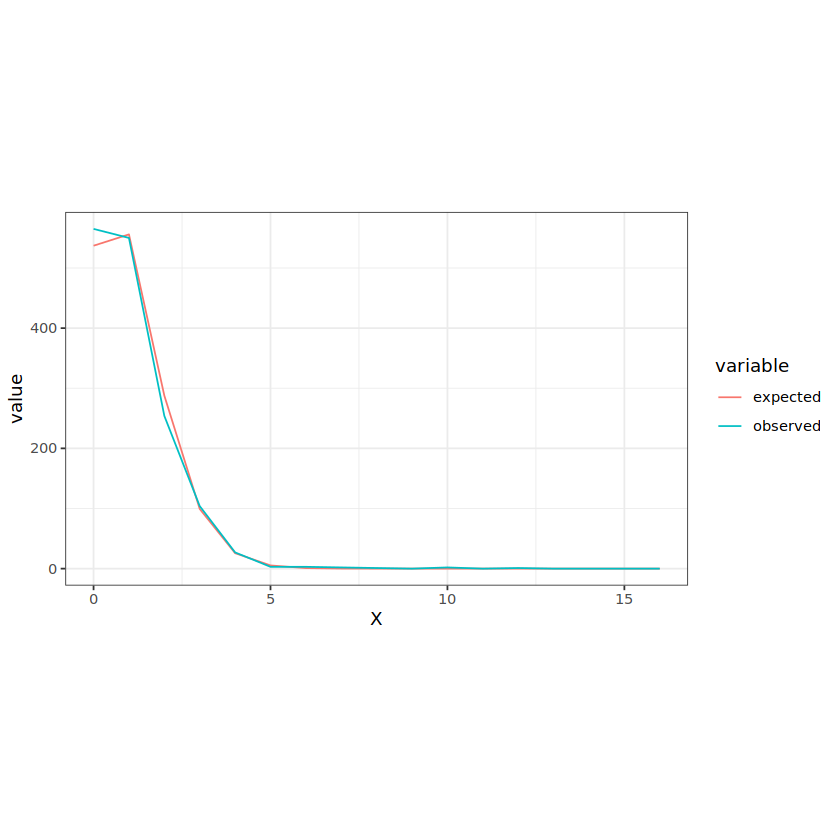

[1] 0
[1] "num_pass_sample 1512"
[1] "lambda:  1.03505291005291"
    X Poisson_probability     expected observed
1   0        3.552076e-01 5.370739e+02      565
2   1        3.676586e-01 5.558999e+02      550
3   2        1.902731e-01 2.876929e+02      254
4   3        6.564757e-02 9.925912e+01      104
5   4        1.698718e-02 2.568461e+01       27
6   5        3.516525e-03 5.316986e+00        3
7   6        6.066316e-04 9.172270e-01        3
8   7        8.969940e-05 1.356255e-01        2
9   8        1.160545e-05 1.754745e-02        1
10  9        1.334695e-06 2.018059e-03        0
11 10        1.381480e-07 2.088798e-04        2
12 11        1.299914e-08 1.965470e-05        0
13 12        1.121233e-09 1.695304e-06        1
14 13        8.927196e-11 1.349792e-07        0
15 14        6.600086e-12 9.979330e-09        0
16 15        4.554292e-13 6.886090e-10        0
17 16        2.946208e-14 4.454667e-11        0
18 17        1.793813e-15 2.712245e-12        0
19 18        1.031495e-

Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


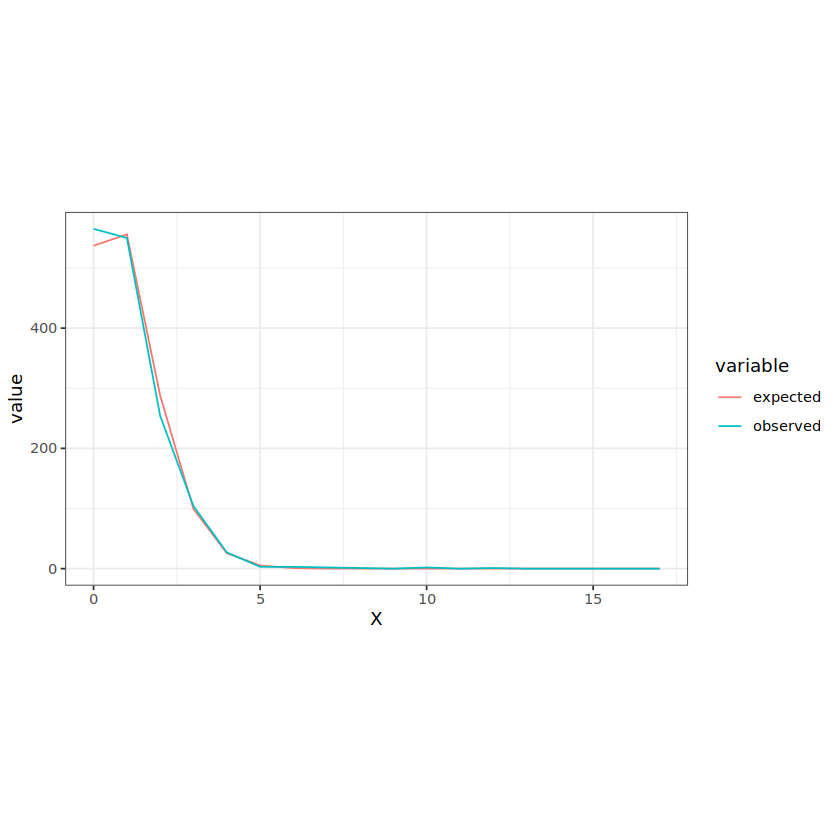

[1] 0
[1] "num_pass_sample 1512"
[1] "lambda:  1.03505291005291"
    X Poisson_probability     expected observed
1   0        3.552076e-01 5.370739e+02      565
2   1        3.676586e-01 5.558999e+02      550
3   2        1.902731e-01 2.876929e+02      254
4   3        6.564757e-02 9.925912e+01      104
5   4        1.698718e-02 2.568461e+01       27
6   5        3.516525e-03 5.316986e+00        3
7   6        6.066316e-04 9.172270e-01        3
8   7        8.969940e-05 1.356255e-01        2
9   8        1.160545e-05 1.754745e-02        1
10  9        1.334695e-06 2.018059e-03        0
11 10        1.381480e-07 2.088798e-04        2
12 11        1.299914e-08 1.965470e-05        0
13 12        1.121233e-09 1.695304e-06        1
14 13        8.927196e-11 1.349792e-07        0
15 14        6.600086e-12 9.979330e-09        0
16 15        4.554292e-13 6.886090e-10        0
17 16        2.946208e-14 4.454667e-11        0
18 17        1.793813e-15 2.712245e-12        0
19 18        1.031495e-

Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


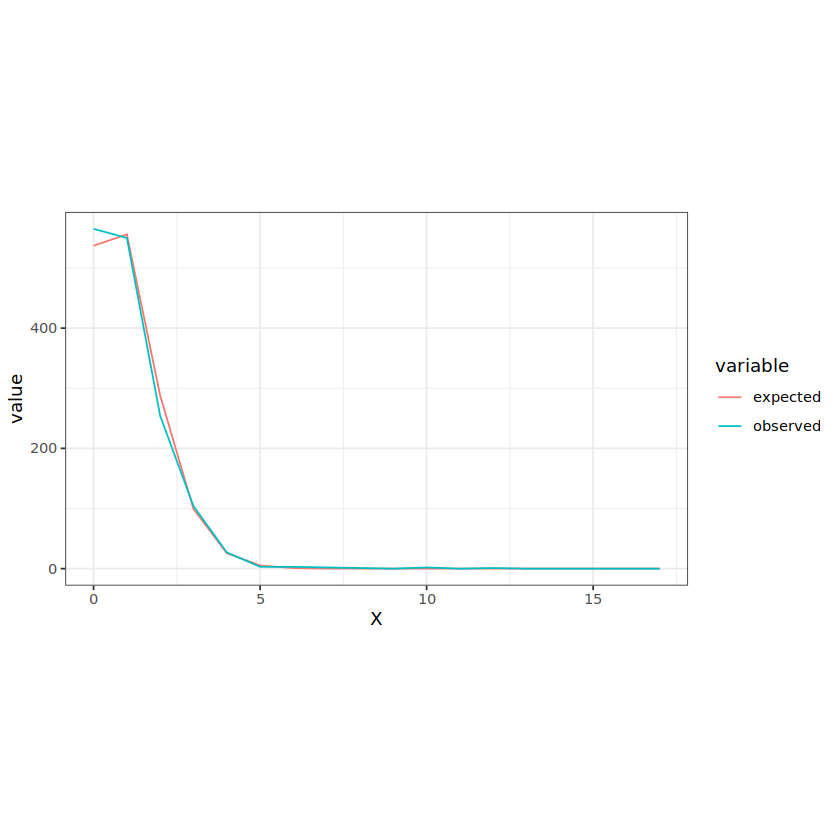

[1] 0
[1] "num_pass_sample 1512"
[1] "lambda:  1.03505291005291"
    X Poisson_probability     expected observed
1   0        3.552076e-01 5.370739e+02      565
2   1        3.676586e-01 5.558999e+02      550
3   2        1.902731e-01 2.876929e+02      254
4   3        6.564757e-02 9.925912e+01      104
5   4        1.698718e-02 2.568461e+01       27
6   5        3.516525e-03 5.316986e+00        3
7   6        6.066316e-04 9.172270e-01        3
8   7        8.969940e-05 1.356255e-01        2
9   8        1.160545e-05 1.754745e-02        1
10  9        1.334695e-06 2.018059e-03        0
11 10        1.381480e-07 2.088798e-04        2
12 11        1.299914e-08 1.965470e-05        0
13 12        1.121233e-09 1.695304e-06        1
14 13        8.927196e-11 1.349792e-07        0
15 14        6.600086e-12 9.979330e-09        0
16 15        4.554292e-13 6.886090e-10        0
17 16        2.946208e-14 4.454667e-11        0
18 17        1.793813e-15 2.712245e-12        0
19 18        1.031495e-

Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


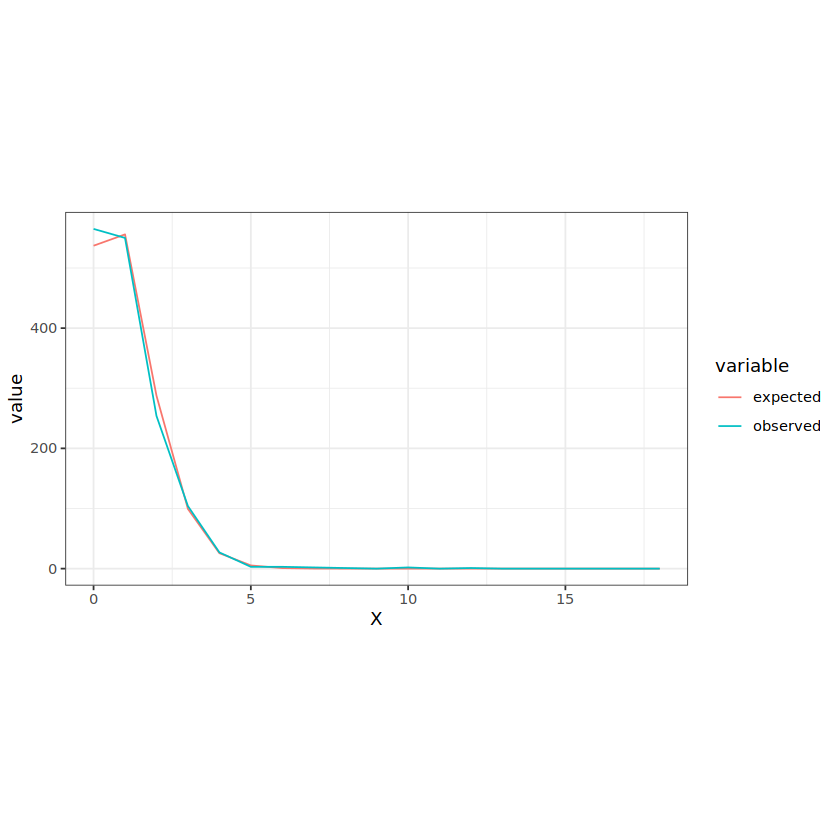

[1] 0
[1] "num_pass_sample 1512"
[1] "lambda:  1.03505291005291"
    X Poisson_probability     expected observed
1   0        3.552076e-01 5.370739e+02      565
2   1        3.676586e-01 5.558999e+02      550
3   2        1.902731e-01 2.876929e+02      254
4   3        6.564757e-02 9.925912e+01      104
5   4        1.698718e-02 2.568461e+01       27
6   5        3.516525e-03 5.316986e+00        3
7   6        6.066316e-04 9.172270e-01        3
8   7        8.969940e-05 1.356255e-01        2
9   8        1.160545e-05 1.754745e-02        1
10  9        1.334695e-06 2.018059e-03        0
11 10        1.381480e-07 2.088798e-04        2
12 11        1.299914e-08 1.965470e-05        0
13 12        1.121233e-09 1.695304e-06        1
14 13        8.927196e-11 1.349792e-07        0
15 14        6.600086e-12 9.979330e-09        0
16 15        4.554292e-13 6.886090e-10        0
17 16        2.946208e-14 4.454667e-11        0
18 17        1.793813e-15 2.712245e-12        0
19 18        1.031495e-

Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


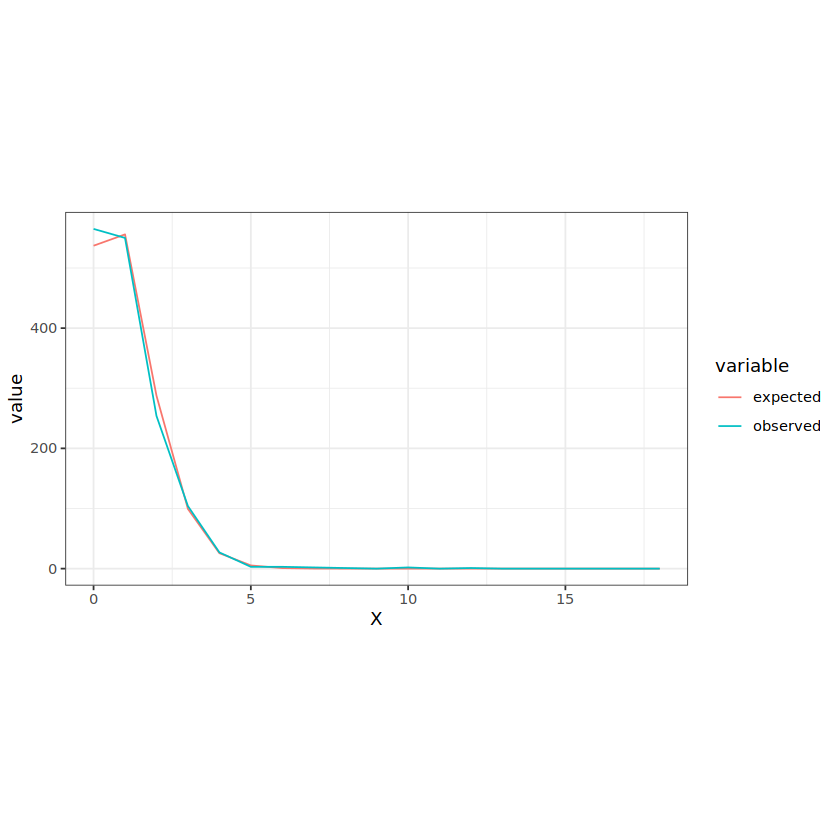

[1] 0
[1] "num_pass_sample 1512"
[1] "lambda:  1.03505291005291"
    X Poisson_probability     expected observed
1   0        3.552076e-01 5.370739e+02      565
2   1        3.676586e-01 5.558999e+02      550
3   2        1.902731e-01 2.876929e+02      254
4   3        6.564757e-02 9.925912e+01      104
5   4        1.698718e-02 2.568461e+01       27
6   5        3.516525e-03 5.316986e+00        3
7   6        6.066316e-04 9.172270e-01        3
8   7        8.969940e-05 1.356255e-01        2
9   8        1.160545e-05 1.754745e-02        1
10  9        1.334695e-06 2.018059e-03        0
11 10        1.381480e-07 2.088798e-04        2
12 11        1.299914e-08 1.965470e-05        0
13 12        1.121233e-09 1.695304e-06        1
14 13        8.927196e-11 1.349792e-07        0
15 14        6.600086e-12 9.979330e-09        0
16 15        4.554292e-13 6.886090e-10        0
17 16        2.946208e-14 4.454667e-11        0
18 17        1.793813e-15 2.712245e-12        0
19 18        1.031495e-

Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


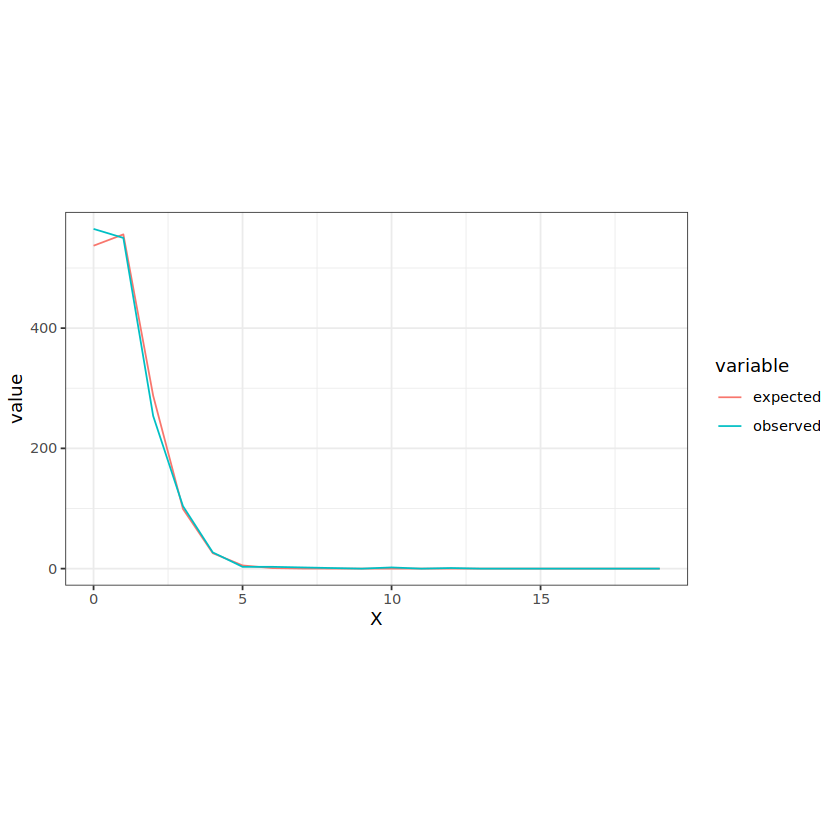

[1] 0
[1] "num_pass_sample 1512"
[1] "lambda:  1.03505291005291"
    X Poisson_probability     expected observed
1   0        3.552076e-01 5.370739e+02      565
2   1        3.676586e-01 5.558999e+02      550
3   2        1.902731e-01 2.876929e+02      254
4   3        6.564757e-02 9.925912e+01      104
5   4        1.698718e-02 2.568461e+01       27
6   5        3.516525e-03 5.316986e+00        3
7   6        6.066316e-04 9.172270e-01        3
8   7        8.969940e-05 1.356255e-01        2
9   8        1.160545e-05 1.754745e-02        1
10  9        1.334695e-06 2.018059e-03        0
11 10        1.381480e-07 2.088798e-04        2
12 11        1.299914e-08 1.965470e-05        0
13 12        1.121233e-09 1.695304e-06        1
14 13        8.927196e-11 1.349792e-07        0
15 14        6.600086e-12 9.979330e-09        0
16 15        4.554292e-13 6.886090e-10        0
17 16        2.946208e-14 4.454667e-11        0
18 17        1.793813e-15 2.712245e-12        0
19 18        1.031495e-

Warning message in chisq.test(df_cutoff$observed, p = df_cutoff$expected, rescale.p = TRUE):
"Chi-squared approximation may be incorrect"


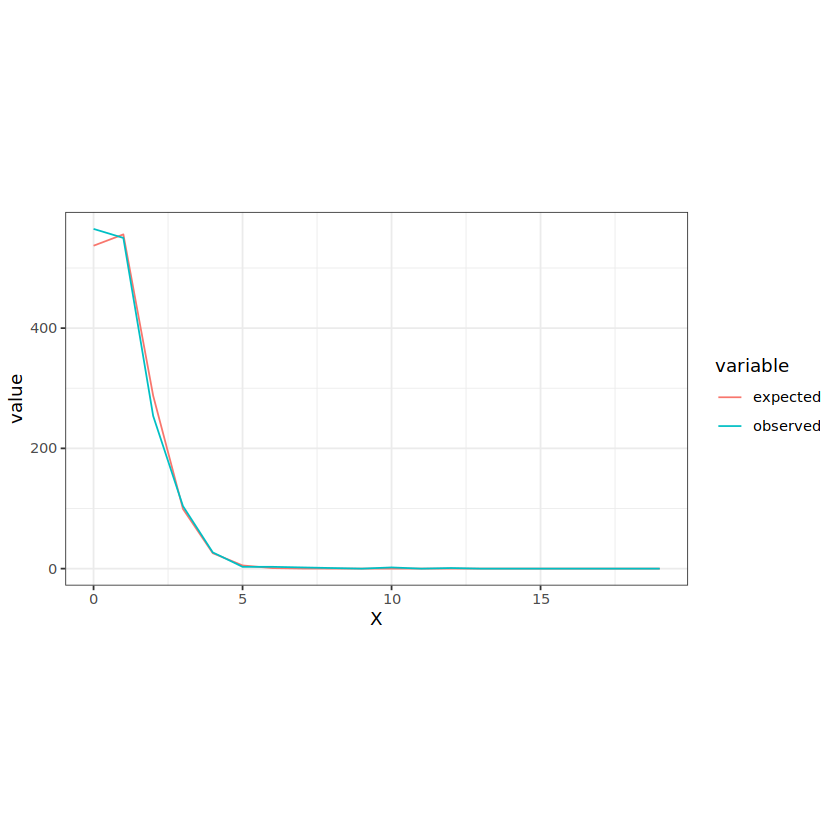

[1] 0


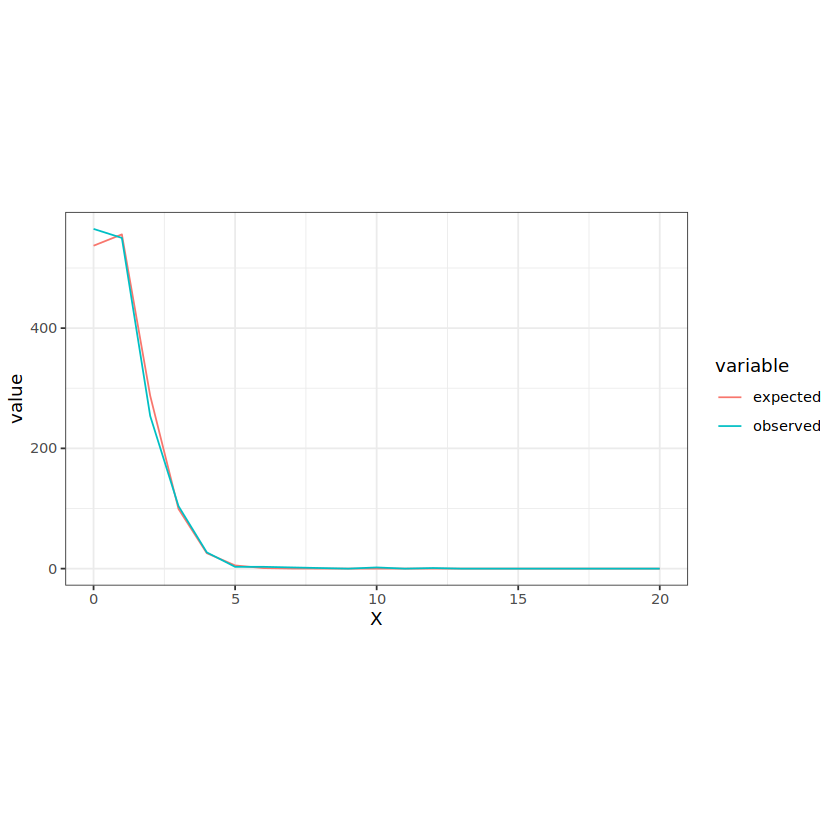

cutoff,p_value,lambda
<int>,<dbl>,<dbl>
1,5.965986e-31,0.4932735
2,6.230613e-08,0.7728269
3,3.070643e-02,0.9300747
4,3.136497e-01,0.9853333
5,4.254931e-01,0.9933466
6,8.325366e-02,1.0033201
7,7.980987e-07,1.0112732
8,9.815562e-19,1.0159046
9,3.669431e-18,1.0159046


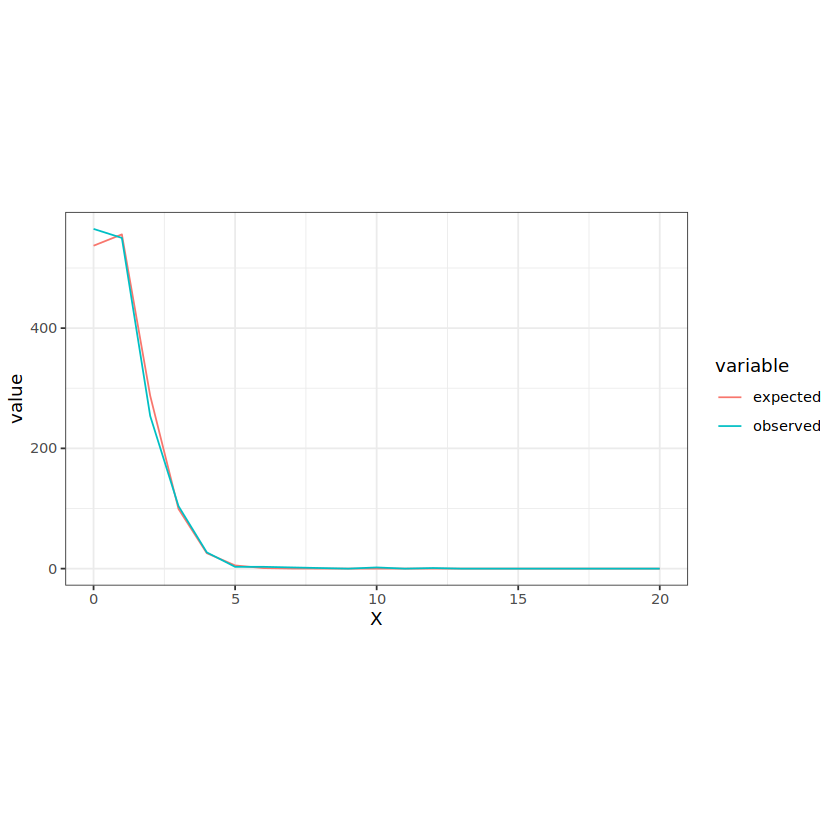

<0 x 0 matrix>

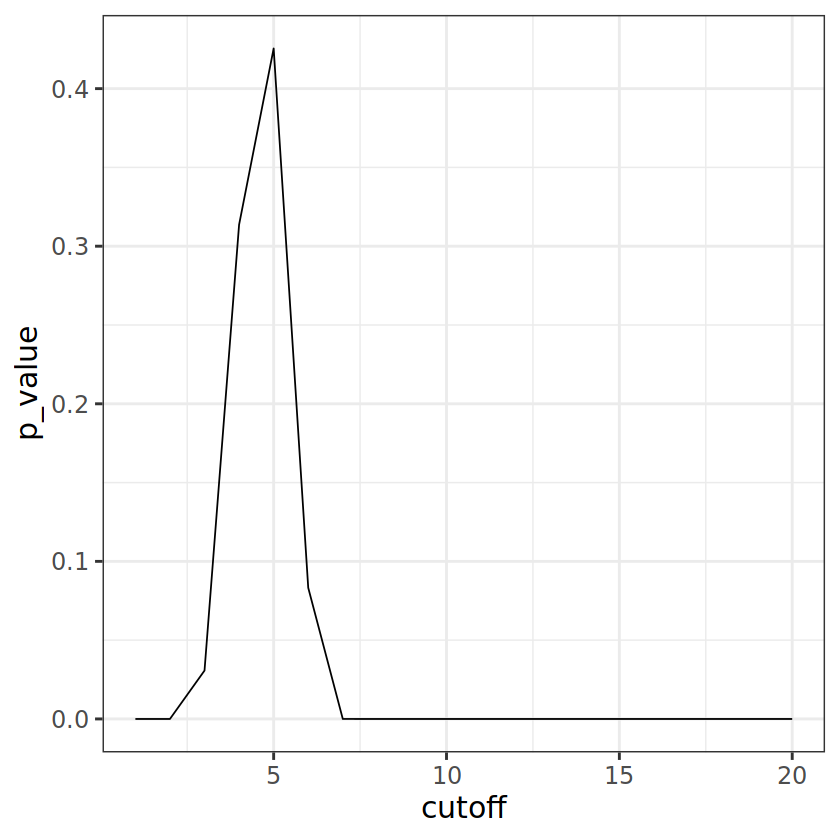

In [12]:
percent='70'


Get_pval_poisson_goodness_of_fit <- function(cutoff){
    data <- read.delim(paste("/projects/ps-gleesonlab8/User/hiyoothere/NTD/15.Final/221020_DNM_v9/NTD_WES_HC_all.VQSR.CGP.DNV.DeNovo.vep.filtered.DP12.RESCUE.PF2.consensus",percent, ".den_input", sep=""), header=TRUE)
   
    data.mm <- data[grepl('s', data$pro),]
    data.ssc <- data[!grepl('s', data$pro),]


    paste("cutoff for dnm: ", cutoff)

    original_sample <- table(data$pro)
    num_total_sample <- 790 + 726
    paste("number of total sample: ", num_total_sample)


    paste("========================")
    paste("sample number that has de novo: ", length(original_sample))
    paste("original dnm in samples: ", dim(data)[1] )
    num_no_dnm_sample <- num_total_sample - length(original_sample)
    paste("original samples that have no dnm: ", num_no_dnm_sample )


    many_sample <-names(table(data$pro)[table(data$pro) > cutoff])
    many <-data.frame(table(data$pro)[table(data$pro) > cutoff])
    head(many)
    sum(many$Freq)
    paste("cutoff exceeding samples", length(many_sample))
    paste("cutoff exceeding dnms", sum(many$Freq))
    data.fil <- data[!(data$pro %in% many_sample),]

    df_cnt <- data.frame(table(data.fil$pro))
    head(df_cnt)


    paste("========================")
    paste("cuffoff pass sample number: ", length(table(data.fil$pro)))
    num_cutoff_dnm <-  sum(df_cnt$Freq)
    paste("cutoff pass dnm in samples: ", num_cutoff_dnm )
    paste("========================")




    num_pass_sample = num_no_dnm_sample + length(table(data.fil$pro))
    
    print (paste("num_pass_sample", num_pass_sample))
    lambda = num_cutoff_dnm / num_pass_sample
    print (paste("lambda: ", lambda))
    df_lambda <- rbind(df_lambda, c(cutoff, lambda))
    
    
    df_cutoff = data.frame()
    for_zero <- c(0, dpois(0, lambda), dpois(0, lambda)*num_pass_sample, num_no_dnm_sample)
    df_cutoff = rbind(df_cutoff, for_zero)
    for (i in 1:cutoff){
        x = i
        dpoi = dpois(i, lambda)
        
        expected = dpoi * num_pass_sample
        observed = sum(df_cnt$Freq == i)
        df_cutoff = rbind(df_cutoff, c(x, dpoi, expected, observed))

    }

    colnames(df_cutoff) = c("X", "Poisson_probability", "expected", "observed")

    print (df_cutoff)
    print (paste("sum of the prob: ", sum(df_cutoff$Poisson_probability)))
    chisq_gof = chisq.test(df_cutoff$observed, 
                           p= df_cutoff$expected, 
                           rescale.p = TRUE)
    #print(chisq_gof)
    #print(chisq_gof$p.value)
    p_chisq = chisq_gof$p.value
    print (p_chisq)
    df_melt <- melt(df_cutoff, id = "X")
#df_melt
    p <- ggplot(subset(df_melt, variable == 'expected' | variable == 'observed')) + 
    geom_line(aes(x=X, y= value, color = variable)) + 
    theme_bw() + 
    theme(aspect.ratio = 0.6)
    
    print (p)
    return (list(p_chisq, lambda))
}


df_pval = data.frame()
df_lambda = data.frame()

for (i in 1:20){
    pval = Get_pval_poisson_goodness_of_fit(i)[1]
    lambda = Get_pval_poisson_goodness_of_fit(i)[2]
    #print (pval)
    df_pval =rbind(df_pval, c(i,pval, lambda))
}
#Get_pval_poisson_goodness_of_fit(5)
colnames(df_pval) = c("cutoff", "p_value", "lambda")
df_pval

ggplot(data = df_pval)+
geom_line(aes(x=cutoff, y=p_value))

df_lambda




`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"span too small.   fewer data values than degrees of freedom."
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at 0.905"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 1.095"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  0"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"There are other near singularities as well. 1.199"
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
"span too small.   fewer data values than degrees of freedom."
Warning message in predLoess(object$y, objec

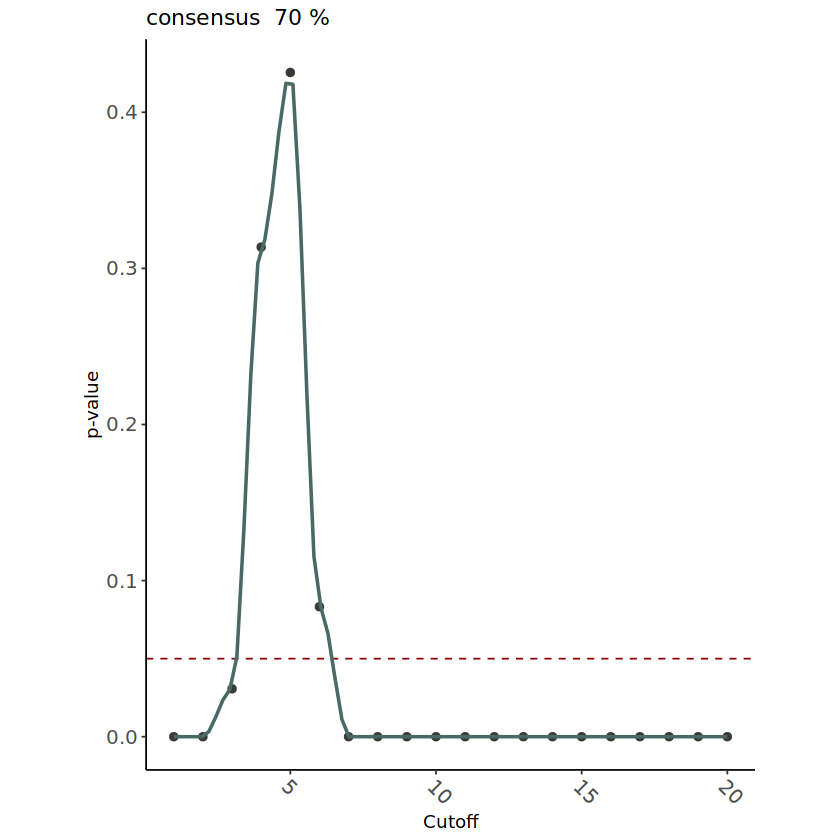

In [13]:
saved <- options(repr.plot.width=30, repr.plot.height=16)
#df_pval
options(repr.plot.width=6, repr.plot.height=4)
p<- ggplot(data = df_pval, aes(x=cutoff, y=p_value))+
geom_hline(yintercept = 0.05, linetype = 'dashed', col = 'darkred')+
geom_point(color='#3B3936', size = 2) + 
geom_smooth( colour = "#486966", span = 0.1)+
ggtitle(paste("consensus ", percent, "%")) + 
theme_classic()+ 
theme(legend.position='bottom', 
          aspect.ratio = 1.2,
          axis.title.y.right = element_text( angle = 90,size = 12),
         axis.text.x = element_text(angle = -45, hjust = 0.01,size = 12),
          axis.text.y = element_text(size = 12)) + 
xlab("Cutoff") + 
ylab("p-value")
options(saved)
p
ggsave("/projects/ps-gleesonlab8/User/hiyoothere/NTD/15.Final/221020_DNM_v9/figure/Poisson_70.pdf", plot= p)

Saving 6.67 x 6.67 in image


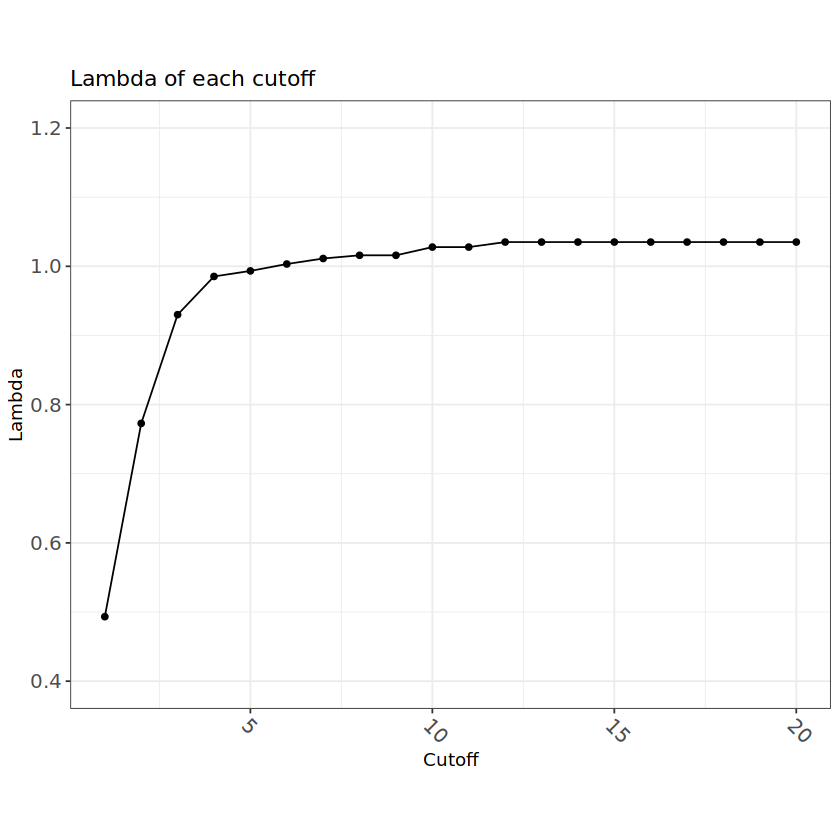

In [14]:
p <- ggplot(data = df_pval)+
geom_line(aes(x=cutoff, y=lambda)) + 
geom_point(aes(x=cutoff, y=lambda)) + 
theme_bw() + 
ylim(c(0.4,1.2)) + 
#theme_classic()+ 
theme(legend.position='bottom', 
          aspect.ratio = 0.8,
          axis.title.y.right = element_text( angle = 90,size = 12),
         axis.text.x = element_text(angle = -45, hjust = 0.01,size = 12),
          axis.text.y = element_text(size = 12)) + 
xlab("Cutoff") + 
ylab("Lambda")+
ggtitle(label = "Lambda of each cutoff")
p
ggsave("/projects/ps-gleesonlab8/User/hiyoothere/NTD/15.Final/221020_DNM_v9/figure/Poisson_70_lambda.pdf", plot= p)

## Filter out "SAMPLES" based on # of DNM "IN" consensus

In [37]:
cutoff = 6
Tier = 'Tier1'

In [38]:
percent= '90'
data_poi = read.delim(paste("/projects/ps-gleesonlab8/User/hiyoothere/NTD/15.Final/221020_DNM_v9/NTD_WES_HC_all.VQSR.CGP.DNV.DeNovo.vep.filtered.DP12.RESCUE.PF2.consensus",percent, ".den_input", sep=""), header=T)
head(data_poi)
dim(data_poi)

many_sample_poisson <-names(table(data_poi$pro)[table(data_poi$pro) > cutoff])
many_poisson <-data.frame(table(data_poi$pro)[table(data_poi$pro) > cutoff])
"These samples had too many dnms"

length(many_poisson$Var1)

"Too many dnms in NTD"
many_poisson.mm <- many_poisson[!grepl('s', many_poisson$Var1),]
length(many_poisson.mm$Var1)

"Too many dnms in Control"
many_poisson.ssc <- many_poisson[grepl('s', many_poisson$Var1),]
length(many_poisson.ssc$Var1)
#2590100197
many_poisson
many_sample_poisson



,locus,ref,alt,family,pro,dad,mom,pro_s,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,var_class,term,on,gene,gene_id,protein,HGVS_c,HGVS_p,impact,polyphen,polyphen_score,sift,metasvm,metasvm_score,cadd,gnomad_an,gnomad_ac,gnomad_af,MQ,QD,filters,other_gene,occurence,samples,batch,Gene_interest,gene_alias,gene_hgnc,Approved.name,ppi,ppi_prediction,Inspection,oe_mis_pphen,pLI,pNull,pRec,oe_lof,oe_lof_lower,oe_lof_upper,DP_filter12,pval
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>
1,chr1:1486163,G,C,7004,4926035813,2917406449,3160220249,1,64,30,34,0/1,99,54,54,0,0/0,97,59,59,0,0/0,97,.,hiConfDeNovo,SNV,missense_variant,10/16,ATAD3B,ENSG00000160072,ENSP00000500094,ENST00000673477.1:c.1017G>C,ENSP00000500094.1:p.Lys339Asn,MODERATE,possibly_damaging(0.824),0.955,deleterious(0),D,0.94306,23.7,NA,NA,NA,59.68,16.27,PASS,NA,1,4926035813,UCI,NA,"TOB3, KIAA1273",ATAD3B,ATPase family AAA domain containing 3B,NA,NA,NA,1.34320,1.0032e-22,9.9972e-01,2.7792e-04,1.099500,0.829,1.477,TRUE,0.70798075
2,chr1:3727156,T,C,5342,2590100197,3631567270,3613534112,1,23,17,6,0/1,97,20,20,0,0/0,49,16,16,0,0/0,28,.,hiConfDeNovo,SNV,upstream_gene_variant,,TP73,ENSG00000078900,,,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,58.79,5.40,PASS,NA,1,2590100197,Murat,NA,P73,TP73,tumor protein p73,NA,NA,NA,0.55633,9.9696e-01,1.1729e-09,3.0391e-03,0.099113,0.044,0.256,TRUE,0.03468966
3,chr1:3727171,A,T,5342,2590100197,3631567270,3613534112,1,21,16,5,0/1,75,21,21,0,0/0,47,17,17,0,0/0,31,.,hiConfDeNovo,SNV,upstream_gene_variant,,TP73,ENSG00000078900,,,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,60.00,5.01,PASS,NA,1,2590100197,Murat,NA,P73,TP73,tumor protein p73,TP73_AMPH;AURKA;B4E1C1;BIN1;CCNA2;CCNE1;CDK2;CHD3;CREBBP;CSNK2A1;DAXX;DDB1;DENND4A;E9KL35;EP300;FBXO45;HIPK2;HIPK3;HRAS;HSPA9;IKBKB;ITCH;KAT2B;MAD2L1;MUL1;MYC;NEDD4;PFDN5;PIN1;PPP1R13B;PPP1R13L;Q53GA5;Q59FK4;Q86T74;RACK1;RCHY1;RUNX2;SIRT1;STAT1;SUMO1;TDG;TP53BP2;UBE2I;WWP2;YAP1,Predicted Interface,NA,0.55633,9.9696e-01,1.1729e-09,3.0391e-03,0.099113,0.044,0.256,TRUE,0.02660370
4,chr1:6128115,T,G,5342,2590100197,3631567270,3613534112,1,21,14,7,0/1,99,25,25,0,0/0,49,29,29,0,0/0,58,.,hiConfDeNovo,SNV,intron_variant&NMD_transcript_variant,,CHD5,ENSG00000116254,ENSP00000433676,ENST00000496404.1:c.3417+925A>C,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,60.00,9.15,PASS,NA,1,2590100197,Murat,NA,,CHD5,chromodomain helicase DNA binding protein 5,NA,NA,NA,0.31556,1.0000e+00,5.0761e-31,2.6434e-10,0.089818,0.053,0.157,TRUE,0.18924713
5,chr1:6701720,T,A,5342,2590100197,3631567270,3613534112,1,20,14,6,0/1,70,20,20,0,0/0,48,18,18,0,0/0,26,.,hiConfDeNovo,SNV,intron_variant&non_coding_transcript_variant,,DNAJC11,ENSG00000007923,,ENST00000693337.1:n.94+9A>T,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,60.00,4.75,PASS,NA,1,2590100197,Murat,NA,FLJ10737,DNAJC11,DnaJ heat shock protein family (Hsp40) member C11,NA,NA,NA,0.43668,9.9893e-01,1.8811e-11,1.0747e-03,0.106770,0.052,0.244,TRUE,0.11531830
6,chr1:9356429,G,A,6144,7350647467,2898643437,4401829860,1,154,76,78,0/1,99,33,33,0,0/0,76,33,33,0,0/0,76,.,hiConfDeNovo,SNV,missense_variant,2/2,SPSB1,ENSG00000171621,ENSP00000409235,ENST00000450402.1:c.538G>A,ENSP00000409235.1:p.Ala180Thr,MODERATE,benign(0.031),0.027,deleterious(0),T,0.56603,24.4,NA,NA,NA,60.00,9.72,PASS,NA,1,7350647467,Macrogen,NA,SSB-1,SPSB1,splA/ryanodine receptor domain and SOCS box containing 1,NA,NA,NA,0.30535,5.1982e-01,3.2925e-03,4.7688e-01,0.188680,0.076,0.594,TRUE,0.93580892


[1] 1935   66

[1] "These samples had too many dnms"

[1] 8

[1] "Too many dnms in NTD"

[1] 7

[1] "Too many dnms in Control"

[1] 1

Var1,Freq
<fct>,<int>
12120.s1,38
2590100197,674
3644259853,49
5403562224,7
5593407741,9
6672029182,19
8249130719,7
S12830,10


[1] "12120.s1"   "2590100197" "3644259853" "5403562224" "5593407741"
[6] "6672029182" "8249130719" "S12830"

In [39]:
data <- read.delim("/projects/ps-gleesonlab8/User/hiyoothere/NTD/15.Final/221020_DNM_v9/NTD_WES_HC_all.VQSR.CGP.DNV.DeNovo.vep.filtered.DP12.RESCUE.PF2.consensus90.den_input", header = T)
dim(data)
dim(data)
many_sample_poisson
"NUMBER of poisson failed samples"
length(many_sample_poisson)
sibcontam <- c('6672029182')
many_sample_poisson <- many_sample_poisson[!(many_sample_poisson %in% sibcontam)]
"Including sibling contam"
length(many_sample_poisson)


data <- data[!(data$pro %in% many_sample_poisson),]
dim(data)


write.table(data, "/projects/ps-gleesonlab8/User/hiyoothere/NTD/15.Final/221020_DNM_v9/NTD_WES_HC_all.VQSR.CGP.DNV.DeNovo.vep.filtered.DP12.RESCUE.PF2.consensus90.PoiFil.den_input", sep='\t', quote=F, row.names=F)

# FOr gene analysis
data <- read.delim("/projects/ps-gleesonlab8/User/hiyoothere/NTD/15.Final/221020_DNM_v9/NTD_WES_HC_all.VQSR.CGP.DNV.DeNovo.vep.filtered.DP12.RESCUE.PF2.den_input", header = T)
dim(data)
dim(data)
many_sample_poisson
"NUMBER of poisson failed samples"
length(many_sample_poisson)

data <- data[!(data$pro %in% many_sample_poisson),]
dim(data)


write.table(data, "/projects/ps-gleesonlab8/User/hiyoothere/NTD/15.Final/221020_DNM_v9/NTD_WES_HC_all.VQSR.CGP.DNV.DeNovo.vep.filtered.DP12.RESCUE.PF2.PoiFil.den_input", sep='\t', quote=F, row.names=F)

#6672029182

[1] 1935   66

[1] 1935   66

[1] "12120.s1"   "2590100197" "3644259853" "5403562224" "5593407741"
[6] "6672029182" "8249130719" "S12830"

[1] "NUMBER of poisson failed samples"

[1] 8

[1] "Including sibling contam"

[1] 7

[1] 1141   66

[1] 4534   66

[1] 4534   66

[1] "12120.s1"   "2590100197" "3644259853" "5403562224" "5593407741"
[6] "8249130719" "S12830"

[1] "NUMBER of poisson failed samples"

[1] 7

[1] 2705   66

# DONE
# ------------------------------

## Making outputs for five Tiers

In [298]:
d_cutoff_Tier <- c('Tier1'=6, 'Tier2'=7, 'Tier3'= 9, 'Tier4'= 11, 'Tier5'= 100)

for (x in 1:5){
    cutoff = as.numeric(d_cutoff_Tier[paste("Tier",x,sep="")])
    print ((paste("Tier",x, "cutoff is", cutoff)))
    
    percent= '90'
    data_poi = read.delim(paste("/projects/ps-gleesonlab8/User/hiyoothere/NTD/10.Poisson/NTD_WES_HC_all.VQSR.CGP.DNV.DeNovo.vep.filtered.DP12.consensus",percent, ".den_input", sep=""), header=T)
    #head(data_poi)
    dim(data_poi)

    many_sample_poisson <-names(table(data_poi$pro)[table(data_poi$pro) > cutoff])
    many_sample_poisson
    #many_poisson <-data.frame(table(data_poi$pro)[table(data_poi$pro) > cutoff])
    "These samples had too many dnms"

    

    "Too many dnms in NTD"
    #many_poisson.mm <- many_poisson[!grepl('s', many_poisson$Var1),]
    #length(many_poisson.mm$Var1)

    "Too many dnms in Control"
    #many_poisson.ssc <- many_poisson[grepl('s', many_poisson$Var1),]
    #length(many_poisson.ssc$Var1)
    #2590100197
    #many_poisson
    
    
    data <- read.delim("/projects/ps-gleesonlab8/User/hiyoothere/NTD/4.Annotated/NTD_WES_HC_all.VQSR.CGP.DNV.DeNovo.vep.filtered.DP12.den_input", header = T)
    print (dim(data)[1])

    print (many_sample_poisson)
    "NUMBER of poisson failed samples"
    length(many_sample_poisson)

    data <- data[!(data$pro %in% many_sample_poisson),]
    print (dim(data)[1])


    write.table(data, paste("/projects/ps-gleesonlab8/User/hiyoothere/NTD/15.Final/221005_DNM_v7/NTD_WES_HC_all.VQSR.CGP.DNV.DeNovo.vep.filtered.DP12.Tier",x, ".den_output.txt", sep=""), sep='\t', quote=F, row.names=F)





    
    
    
}
#cutoff = as.numeric(d_cutoff_Tier['Tier1'])

[1] "Tier 1 cutoff is 6"


Warning message in if (!header) rlabp <- FALSE:
"the condition has length > 1 and only the first element will be used"
Warning message in if (header) {:
"the condition has length > 1 and only the first element will be used"
Warning message in if (!header) rlabp <- FALSE:
"the condition has length > 1 and only the first element will be used"
Warning message in if (header) {:
"the condition has length > 1 and only the first element will be used"


[1] 7228
[1] "12120.s1"   "2590100197" "3644259853" "5403562224" "5593407741"
[6] "6672029182" "8249130719" "S12830"    
[1] 3167
[1] "Tier 2 cutoff is 7"


Warning message in if (!header) rlabp <- FALSE:
"the condition has length > 1 and only the first element will be used"
Warning message in if (header) {:
"the condition has length > 1 and only the first element will be used"
Warning message in if (!header) rlabp <- FALSE:
"the condition has length > 1 and only the first element will be used"
Warning message in if (header) {:
"the condition has length > 1 and only the first element will be used"


[1] 7228
[1] "12120.s1"   "2590100197" "3644259853" "5403562224" "5593407741"
[6] "6672029182" "S12830"    
[1] 3176
[1] "Tier 3 cutoff is 9"


Warning message in if (!header) rlabp <- FALSE:
"the condition has length > 1 and only the first element will be used"
Warning message in if (header) {:
"the condition has length > 1 and only the first element will be used"
Warning message in if (!header) rlabp <- FALSE:
"the condition has length > 1 and only the first element will be used"
Warning message in if (header) {:
"the condition has length > 1 and only the first element will be used"


[1] 7228
[1] "12120.s1"   "2590100197" "3644259853" "5403562224" "6672029182"
[6] "S12830"    
[1] 3190
[1] "Tier 4 cutoff is 11"


Warning message in if (!header) rlabp <- FALSE:
"the condition has length > 1 and only the first element will be used"
Warning message in if (header) {:
"the condition has length > 1 and only the first element will be used"
Warning message in if (!header) rlabp <- FALSE:
"the condition has length > 1 and only the first element will be used"
Warning message in if (header) {:
"the condition has length > 1 and only the first element will be used"


[1] 7228
[1] "12120.s1"   "2590100197" "3644259853" "5403562224" "6672029182"
[1] 3206
[1] "Tier 5 cutoff is 100"


Warning message in if (!header) rlabp <- FALSE:
"the condition has length > 1 and only the first element will be used"
Warning message in if (header) {:
"the condition has length > 1 and only the first element will be used"
Warning message in if (!header) rlabp <- FALSE:
"the condition has length > 1 and only the first element will be used"
Warning message in if (header) {:
"the condition has length > 1 and only the first element will be used"


[1] 7228
[1] "2590100197"
[1] 3464


# Rescue recurrent dnms that are in final set

In [299]:
## Rescue recurrent dnms that are in final set

d_cutoff_Tier <- c('Tier1'=6, 'Tier2'=7, 'Tier3'= 9, 'Tier4'= 11, 'Tier5'= 100)

for (x in 1:5){
    cutoff = as.numeric(d_cutoff_Tier[paste("Tier",x,sep="")])
    print ((paste("Tier",x, "cutoff is", cutoff)))

    data <- read.delim(paste("/projects/ps-gleesonlab8/User/hiyoothere/NTD/15.Final/221005_DNM_v7/NTD_WES_HC_all.VQSR.CGP.DNV.DeNovo.vep.filtered.DP12.Tier",x, ".den_output.txt",sep=""), header = T)
    dim(data)
    data <- subset(data, data$gene != "")
    dim(data)
    d_rescue <- read.delim("/projects/ps-gleesonlab8/User/hiyoothere/NTD/15.Final/221005_DNM_v7/NTD_WES_HC_all.VQSR.CGP.DNV.DeNovo.vep.filtered.DP12.RESCUE.locus", header = F)
    colnames(d_rescue)[1] = 'locus'
    colnames(d_rescue)[2] = 'pro'
    "calls to be rescued: "
    dim(d_rescue)
    head(d_rescue)

    raw_data_rescue <- left_join( d_rescue, raw_data, by= "locus")
    raw_data_rescue <- subset(raw_data_rescue, raw_data_rescue$pro.x == raw_data_rescue$pro.y)
    raw_data_rescue <- raw_data_rescue[!names(raw_data_rescue) %in% c("pro.x")]

    colnames(raw_data_rescue)[5] == "pro"
    head(raw_data_rescue)
    dim(raw_data_rescue)

    rescue_all <- raw_data_rescue
    colnames(rescue_all)[5] = "pro"
    rescue_all$DP_filter12 = apply(rescue_all[c('pro_DP', 'dad_DP', 'mom_DP')], 1, function (x) {all(x >= 12)})
    #rescue_all = rescue_all[rescue_all$DP_filter12, ]

    #Binomial

    function_binom <- function(alt, DP)
    {
        binom.test(x= alt,
                  n = DP,
                  p = 0.5,
                  alternative = 'two.sided', 
                  conf.level = 0.95)$p.value
    }

    rescue_all$pval <- mapply(function_binom, rescue_all$pro_alt, rescue_all$pro_DP)

    #rescue_all <- filter(rescue_all, rescue_all$pval > 0.01) #8392 vs. heuristic: 8503
    'Rescued'
    dim(rescue_all)
    head(rescue_all)

    'data before'
    dim(data)
    data<- rbind(data, rescue_all)
    'data after rescue'
    dim(data)
    write.table(data, paste("/projects/ps-gleesonlab8/User/hiyoothere/NTD/15.Final/221005_DNM_v7/NTD_WES_HC_all.VQSR.CGP.DNV.DeNovo.vep.filtered.DP12.Tier",x, ".den_output.rescued.txt", sep=""), sep='\t', quote=F, row.names=F)
    }

[1] "Tier 1 cutoff is 6"


Warning message in if (!header) rlabp <- FALSE:
"the condition has length > 1 and only the first element will be used"
Warning message in if (header) {:
"the condition has length > 1 and only the first element will be used"


[1] "Tier 2 cutoff is 7"


Warning message in if (!header) rlabp <- FALSE:
"the condition has length > 1 and only the first element will be used"
Warning message in if (header) {:
"the condition has length > 1 and only the first element will be used"


[1] "Tier 3 cutoff is 9"


Warning message in if (!header) rlabp <- FALSE:
"the condition has length > 1 and only the first element will be used"
Warning message in if (header) {:
"the condition has length > 1 and only the first element will be used"


[1] "Tier 4 cutoff is 11"


Warning message in if (!header) rlabp <- FALSE:
"the condition has length > 1 and only the first element will be used"
Warning message in if (header) {:
"the condition has length > 1 and only the first element will be used"


[1] "Tier 5 cutoff is 100"


Warning message in if (!header) rlabp <- FALSE:
"the condition has length > 1 and only the first element will be used"
Warning message in if (header) {:
"the condition has length > 1 and only the first element will be used"


## Otheres

## Quartets

In [40]:
l_quartet = c('103', '224','270', '6137', '7106', '7196', '7267')
quartet <- data[(data$family %in% l_quartet),]
quartet

,locus,ref,alt,family,pro,dad,mom,pro_sex,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,MQ,QD,filter,Allele,Consequence,IMPACT,SYMBOL,Gene,Feature_type,Feature,BIOTYPE,EXON,INTRON,HGVSc,HGVSp,cDNA_position,CDS_position,Protein_position,Amino_acids,Codons,Existing_variation,DISTANCE,STRAND,FLAGS,VARIANT_CLASS,SYMBOL_SOURCE,HGNC_ID,CANONICAL,MANE_SELECT,MANE_PLUS_CLINICAL,TSL,APPRIS,CCDS,ENSP,SWISSPROT,TREMBL,UNIPARC,UNIPROT_ISOFORM,GENE_PHENO,SIFT,PolyPhen,DOMAINS,miRNA,HGVS_OFFSET,AF,AFR_AF,AMR_AF,EAS_AF,EUR_AF,SAS_AF,AA_AF,EA_AF,gnomAD_AF,gnomAD_AFR_AF,gnomAD_AMR_AF,gnomAD_ASJ_AF,gnomAD_EAS_AF,gnomAD_FIN_AF,gnomAD_NFE_AF,gnomAD_OTH_AF,gnomAD_SAS_AF,MAX_AF,MAX_AF_POPS,CLIN_SIG,SOMATIC,PHENO,PUBMED,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,TRANSCRIPTION_FACTORS,CADD_phred,DisGeNET,MPC,MTR,Mastermind,MetaSVM_pred,MetaSVM_rankscore,Phenotypes,Polyphen2_HDIV_score,SIFT_pred,SplicAI,SpliceRegion,gnomAD_exomes_AC,gnomAD_exomes_AF,gnomAD_exomes_AN,pLI,pLI_values,occurence,probands,DP_filter12,pval,Inspection
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<lgl>,<dbl>,<int>
31,chr1:10418892,C,T,6137,1065817357,9484178706,6071727996,1,21,11,10,0/1,99,34,34,0,0/0,99,35,35,0,0/0,99,.,hiConfDeNovo,60.00,9.32,PASS,T,non_coding_transcript_exon_variant,MODIFIER,PGD,ENSG00000142657,Transcript,ENST00000498356,processed_transcript,4/6,,ENST00000498356.1:n.433C>T,,433,,,,,rs766247086,NA,1,,SNV,HGNC,HGNC:8891,,,,3,,,,,,,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,3.182e-05,1.846e-04,2.892e-05,0.0000000,5.437e-05,0,2.637e-05,0.0000000,0.000e+00,1.846e-04,gnomAD_AFR,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,2,1065817357/6578846017,TRUE,1.00000000,NA
32,chr1:10418892,C,T,6137,6578846017,9484178706,6071727996,1,137,71,66,0/1,99,34,34,0,0/0,99,35,35,0,0/0,99,.,hiConfDeNovo,60.00,9.32,PASS,T,non_coding_transcript_exon_variant,MODIFIER,PGD,ENSG00000142657,Transcript,ENST00000498356,processed_transcript,4/6,,ENST00000498356.1:n.433C>T,,433,,,,,rs766247086,NA,1,,SNV,HGNC,HGNC:8891,,,,3,,,,,,,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,3.182e-05,1.846e-04,2.892e-05,0.0000000,5.437e-05,0,2.637e-05,0.0000000,0.000e+00,1.846e-04,gnomAD_AFR,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,2,1065817357/6578846017,TRUE,0.73268409,NA
253,chr1:93876208,G,A,270,S13782,S13786,S13785,1,13,11,2,0/1,20,17,17,0,0/0,79,13,13,0,0/0,70,.,hiConfDeNovo,60.00,14.09,PASS,A,downstream_gene_variant,MODIFIER,DNTTIP2,ENSG00000067334,Transcript,ENST00000528680,protein_coding,,,,,,,,,,rs766174177,1265,-1,cds_end_NF,SNV,HGNC,HGNC:24013,,,,3,,,ENSP00000434261,,E9PRB3.61,UPI000040E463,,NA,,,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,1,S13782,TRUE,0.02246094,NA
375,chr1:157802181,C,T,7106,6570613895,8632227409,2642531919,2,79,39,40,0/1,99,78,78,0,0/0,99,79,79,0,0/0,99,.,hiConfDeNovo,60.00,13.19,PASS,T,upstream_gene_variant,MODIFIER,FCRL1,ENSG00000163534,Transcript,ENST00000495126,processed_transcript,,,,,,,,,,rs139624544,4361,-1,,SNV,HGNC,HGNC:18509,,,,3,,,,,,,,NA,,,,,NA,2e-04,0.0000,0.0000,0.001,0.000,0,0,0.0002326,4.848e-05,0.000e+00,5.799e-05,0.0000000,2.178e-04,0,1.803e-05,0.0001656,9.861e-05,1.000e-03,EAS,,,,,NA,NA,NA,NA,NA,NA,,,,,,NA,,,,,,NA,NA,NA,,,2,6570613895/6872990374,TRUE,1.00000000,NA
376,chr1:1578

# 3. Integrate sources into vcf

In [6]:
paste("Before integration")
dim(data)


#colnames(G_list)[1] = "gene_id"
#data <- left_join(data, G_list, by = "gene_id")



##Add batch info
data <- left_join(data, batch, by = "pro")
#data <- merge(data, unique(batch[,c("pro", "batch")]), by = "pro", all = TRUE, sort =FALSE)
dim(data)
##Add Gene interest
data <- left_join(data, Gene, by = "gene")
#data <- merge(data, unique(Gene[,c("gene", "Gene_interest")]), by="gene", all = TRUE, sort = FALSE)
dim(data)
#Add Gene alias
data <- left_join(data, hgnc_unique, by = "gene")
#data <- merge(data, unique(hgnc[,c("gene", "gene_alias")]), by = "gene", all = TRUE, sort = FALSE)
dim(data)
#HopeKit

#Add Ensembl id -> symbol
data <- left_join(data, ensembl_unique, by = "gene_id")
dim(data)

##Add ppi
data <- left_join(data, ppi_unique, by= "locus")
dim(data)
##Add Inspection
data <- left_join(data, false_indel_unique, by = 'locus')

dim(data)
#colnames(data) <- gsub(".x", "", colnames(data))


#Saving raw data
data <- subset(data, data$gene != "")
dim(data)
raw_data <- data
write.table(raw_data, "/projects/ps-gleesonlab8/User/hiyoothere/NTD/4.Annotated/NTD_WES_HC_all.VQSR.CGP.DNV.DeNovo.vep.annotated.raw.den_input", sep='\t', quote=F, row.names=F)

[1] "Before integration"

[1] 67481   113

[1] 67481   114

ERROR: [1m[33mError[39m in `left_join()`:[22m
[1m[22m[33m![39m Join columns must be present in data.
[31mx[39m Problem with `gene`.


[1] 18 64

,locus,ref,alt,family,pro,dad,mom,pro_s,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,var_class,term,on,gene,gene_id,protein,HGVS_c,HGVS_p,impact,polyphen,polyphen_score,sift,metasvm,metasvm_score,cadd,gnomad_an,gnomad_ac,gnomad_af,MQ,QD,filters,other_gene,occurence,samples,batch,Gene_interest,gene_alias,gene_hgnc,Approved.name,ppi,ppi_prediction,Inspection,oe_mis_pphen,pLI,pNull,pRec,oe_lof,oe_lof_lower,oe_lof_upper
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
16922,chr10:110510113,C,CCTACCCACT,7217,3813871777,2053810746,6754757192,1,62,45,17,0/1,99,67,67,0,0/0,97,48,48,0,0/0,96,.,hiConfDeNovo,insertion,non_coding_transcript_exon_variant,4/4,DUSP5,ENSG00000138166,,ENST00000468749.1:n.496_497insTACCCACTC,,MODIFIER,,0,,,NA,NA,NA,NA,NA,60.00,8.11,VQSRTrancheINDEL99.50to99.90,NA,1,3813871777,UCI,NA,HVH3,DUSP5,dual specificity phosphatase 5,DUSP5_DUSP5,CoCrystal Structure,NA,0.61612,3.3227e-03,4.2320e-02,9.5436e-01,0.466110,0.254,0.920
16923,chr10:110510116,A,ACAGTCTCAGAGCTCAGCAGAAGCCCTGTG,7217,3813871777,2053810746,6754757192,1,58,45,13,0/1,99,79,79,0,0/0,97,48,48,0,0/0,96,.,hiConfDeNovo,insertion,frameshift_variant,4/4,DUSP5,ENSG00000138166,ENSP00000358596,ENST00000369583.4:c.845_846insCAGTCTCAGAGCTCAGCAGAAGCCCTGTG,ENSP00000358596.3:p.Lys282AsnfsTer15,HIGH,,0,,,NA,NA,NA,NA,NA,60.00,5.91,PASS,NA,1,3813871777,UCI,NA,HVH3,DUSP5,dual specificity phosphatase 5,NA,NA,NA,0.61612,3.3227e-03,4.2320e-02,9.5436e-01,0.466110,0.254,0.920
18162,chr11:821779,C,T,7217,3813871777,2053810746,6754757192,1,58,49,9,0/1,43,85,85,0,0/0,97,73,73,0,0/0,97,.,hiConfDeNovo,SNV,non_coding_transcript_exon_variant,1/2,PNPLA2,ENSG00000177666,,ENST00000534561.1:n.6C>T,,MODIFIER,,0,,,NA,NA,NA,NA,NA,60.00,1.43,PASS,PNPLA2_synonymous_variant;CRACR2B_upstream_gene_variant,1,3813871777,UCI,NA,"desnutrin, TTS-2.2, ATGL, FP17548, iPLA2zeta",PNPLA2,patatin like phospholipase domain containing 2,NA,NA,NA,0.88873,4.1069e-03,6.8900e-03,9.8900e-01,0.394300,0.223,0.741
18325,chr11:1456956,A,AC,7217,3813871777,2053810746,6754757192,1,25,13,12,0/1,99,76,76,0,0/0,91,56,56,0,0/0,91,.,hiConfDeNovo,insertion,frameshift_variant&splice_region_variant,20/20,BRSK2,ENSG00000174672,ENSP00000433370,ENST00000526678.5:c.2015dup,ENSP00000433370.1:p.Pro673ThrfsTer12,HIGH,,0,,,NA,NA,NA,NA,NA,60.01,1.34,PASS,NA,2,6672029182/3813871777,UCI,NA,"PEN11B, SAD-A,C11orf7, STK29",BRSK2,BR serine/threonine kinase 2,NA,NA,0,0.43097,9.5141e-01,8.8900e-09,4.8587e-02,0.166850,0.090,0.329
25308,chr12:2597257,A,ATGAAATATAATAAGTATGCAGTCCTGGAGCCGGTCCTCAG,7217,3813871777,2053810746,6754757192,1,90,80,10,0/1,77,102,102,0,0/0,97,65,65,0,0/0,97,.,hiConfDeNovo,insertion,frameshift_variant,22/48,CACNA1C,ENSG00000151067,ENSP00000336982,ENST00000335762.10:c.2896_2897insTGAAATATAATAAGTATGCAGTCCTGGAGCCGGTCCTCAG,ENSP00000336982.5:p.Thr966MetfsTer20,HIGH,,0,,,NA,NA,NA,NA,NA,60.00,1.20,VQSRTrancheINDEL99.50to99.90,NA,1,3813871777,UCI,NA,"Cav1.2, CACH2, CACN2, TS, LQT8,CCHL1A1, CACNL1A1",CACNA1C,calcium voltage-gated channel subunit alpha1 C,NA,NA,NA,0.21123,1.0000e+00,3.1876e-36,1.4028e-13,0.048672,0.024,0.102
41407,chr15:91226361,G,GCAGATTGCAGGGCCCTGCCCTATCCTGCAGATTCAGTGTCTT,7217,3813871777,2053810746,6754757192,1,66,55,11,0/1,99,69,69,0,0/0,97,49,49,0,0/0,93,.,hiConfDeNovo,insertion,inframe_insertion&NMD_transcript_variant,3/15,SV2B,ENSG00000185518,ENSP00000450992,ENST00000557410.5:c.98_99insCAGATTGCAGGGCCCTGCCCTATCCTGCAGATTCAGTGTCTT,ENSP00000450992.1:p.Ser33_Asp34insArgLeuGlnGlyProAlaLeuSerCysArgPheSerValPhe,MODERATE,,0,,,NA,NA,NA,NA,NA,60.00,3.42,VQSRTrancheINDEL99.50to99.90,NA,1,3813871777,UCI,NA,"KI

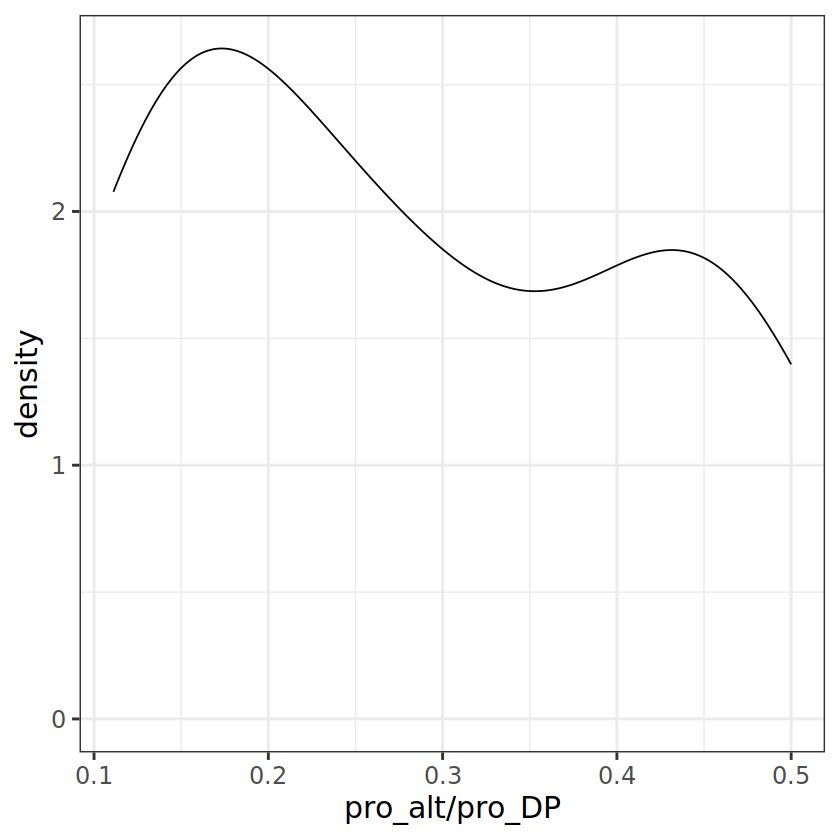

In [6]:
hyper <- subset(data, data$pro == '3813871777') 
hyper <- subset(hyper, hyper$pro_GT == '0/1')
dim(hyper)
head(hyper)

ggplot(hyper, aes(x=pro_alt/pro_DP)) + 
geom_density()

In [7]:
CELSR1 <- subset(data, data$pro == '4975914225') 
CELSR1
CELSR1_variant <- subset(CELSR1, CELSR1$locus =='chr22:46366432')
CELSR1_variant

,locus,ref,alt,family,pro,dad,mom,pro_s,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,var_class,term,on,gene,gene_id,protein,HGVS_c,HGVS_p,impact,polyphen,polyphen_score,sift,metasvm,metasvm_score,cadd,gnomad_an,gnomad_ac,gnomad_af,MQ,QD,filters,other_gene,occurence,samples,batch,Gene_interest,gene_alias,gene_hgnc,Approved.name,ppi,ppi_prediction,Inspection,oe_mis_pphen,pLI,pNull,pRec,oe_lof,oe_lof_lower,oe_lof_upper
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1209,chr1:11764274,G,T,6707,4975914225,7366867422,5140286117,2,4,3,1,0/1,17,6,6,0,0/0,28,8,8,0,0/0,40,.,loConfDeNovo,SNV,intron_variant,,C1orf167,ENSG00000215910,ENSP00000510540,ENST00000688073.1:c.-70-57G>T,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,46.48,4.57,PASS,NA,1,4975914225,Murat,NA,"DKFZp434E1410, RP11-56N19.2",C1orf167,chromosome 1 open reading frame 167,NA,NA,NA,0.88125,9.1452e-34,9.9886e-01,0.00114260,0.843340,0.681,1.052
10429,chr1:200988556,C,G,6707,4975914225,7366867422,5140286117,2,24,20,4,0/1,50,36,36,0,0/0,27,23,23,0,0/0,27,.,hiConfDeNovo,SNV,splice_polypyrimidine_tract_variant&intron_variant,,KIF21B,ENSG00000116852,ENSP00000433808,ENST00000461742.7:c.3299-12G>C,,LOW,,0.000,,,NA,NA,NA,NA,NA,15.11,5.48,VQSRTrancheSNP99.90to99.95,NA,1,4975914225,Murat,NA,"DKFZP434J212, KIAA0449",KIF21B,kinesin family member 21B,NA,NA,NA,0.67705,1.7695e-06,1.2893e-12,1.00000000,0.312510,0.231,0.428
10430,chr1:200988560,A,G,6707,4975914225,7366867422,5140286117,2,21,16,5,0/1,59,39,39,0,0/0,27,26,26,0,0/0,27,.,hiConfDeNovo,SNV,splice_polypyrimidine_tract_variant&intron_variant,,KIF21B,ENSG00000116852,ENSP00000433808,ENST00000461742.7:c.3299-16T>C,,LOW,,0.000,,,NA,NA,NA,NA,NA,28.37,3.12,VQSRTrancheSNP99.90to99.95,NA,1,4975914225,Murat,NA,"DKFZP434J212, KIAA0449",KIF21B,kinesin family member 21B,NA,NA,NA,0.67705,1.7695e-06,1.2893e-12,1.00000000,0.312510,0.231,0.428
20237,chr11:47165613,C,T,6707,4975914225,7366867422,5140286117,2,3,1,2,0/1,27,6,6,0,0/0,12,8,8,0,0/0,57,.,loConfDeNovo,SNV,intron_variant,,ARFGAP2,ENSG00000149182,ENSP00000486339,ENST00000627920.2:c.1138-111G>A,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,13.42,3.70,PASS,C11orf49_downstream_gene_variant;ARFGAP2_intron_variant&non_coding_transcript_variant,1,4975914225,Murat,NA,"IRZ, Zfp289, FLJ14576,ZNF289",ARFGAP2,ADP ribosylation factor GTPase activating protein 2,NA,NA,NA,0.69947,4.8866e-03,4.5141e-05,0.99507000,0.318170,0.195,0.540
23321,chr11:86257733,C,A,6707,4975914225,7366867422,5140286117,2,4,2,2,0/1,30,5,5,0,0/0,31,8,8,0,0/0,34,.,hiConfDeNovo,SNV,intron_variant,,EED,ENSG00000074266,ENSP00000500914,ENST00000673233.2:c.814+137C>A,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,18.33,8.32,PASS,NA,2,1728274607/4975914225,Murat,NA,"WAIT-1, HEED",EED,embryonic ectoderm development,NA,NA,NA,0.11267,9.9929e-01,8.2100e-10,0.00070793,0.039445,0.013,0.187
23323,chr11:86257734,T,A,6707,4975914225,7366867422,5140286117,2,4,2,2,0/1,29,5,5,0,0/0,24,7,7,0,0/0,41,.,hiConfDeNovo,SNV,intron_variant,,EED,ENSG00000074266,ENSP00000500914,ENST00000673233.2:c.814+138T>A,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,16.20,8.33,PASS,NA,2,1728274607/4975914225,Murat,NA,"WAIT-1, HEED",EED,embryonic ectoderm development,NA,NA,NA,0.11267,9.9929e-01,8.2100e-10,0.00070793,0.039445,0.013,0.187
23325,chr11:86257735,C,A,6707,4975914225,7366867422,5140286117,2,4,2,2,0/1,32,5,5,0,0/0,24,7,7,0,0/0,41,.,hiConfDeNovo,SNV,intron_variant,,EED,ENSG00000074266,ENSP00000500914,ENST00000673233.2:c.814+139C>A,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,10.16,8.40,PASS,NA,2,1728274607/4975914225,Murat,NA,"WAIT-1, HEED",EED,embryonic ectoderm development,NA,NA,NA,0.11267,9.9929e-01,8.2100e-1

locus,ref,alt,family,pro,dad,mom,pro_s,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,var_class,term,on,gene,gene_id,protein,HGVS_c,HGVS_p,impact,polyphen,polyphen_score,sift,metasvm,metasvm_score,cadd,gnomad_an,gnomad_ac,gnomad_af,MQ,QD,filters,other_gene,occurence,samples,batch,Gene_interest,gene_alias,gene_hgnc,Approved.name,ppi,ppi_prediction,Inspection,oe_mis_pphen,pLI,pNull,pRec,oe_lof,oe_lof_lower,oe_lof_upper
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>


In [8]:
double <- subset(data, data$family == '6707')
dim(double)
double

[1] 49 64

,locus,ref,alt,family,pro,dad,mom,pro_s,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,var_class,term,on,gene,gene_id,protein,HGVS_c,HGVS_p,impact,polyphen,polyphen_score,sift,metasvm,metasvm_score,cadd,gnomad_an,gnomad_ac,gnomad_af,MQ,QD,filters,other_gene,occurence,samples,batch,Gene_interest,gene_alias,gene_hgnc,Approved.name,ppi,ppi_prediction,Inspection,oe_mis_pphen,pLI,pNull,pRec,oe_lof,oe_lof_lower,oe_lof_upper
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1209,chr1:11764274,G,T,6707,4975914225,7366867422,5140286117,2,4,3,1,0/1,17,6,6,0,0/0,28,8,8,0,0/0,40,.,loConfDeNovo,SNV,intron_variant,,C1orf167,ENSG00000215910,ENSP00000510540,ENST00000688073.1:c.-70-57G>T,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,46.48,4.57,PASS,NA,1,4975914225,Murat,NA,"DKFZp434E1410, RP11-56N19.2",C1orf167,chromosome 1 open reading frame 167,NA,NA,NA,0.88125,9.1452e-34,9.9886e-01,0.00114260,0.843340,0.681,1.052
10429,chr1:200988556,C,G,6707,4975914225,7366867422,5140286117,2,24,20,4,0/1,50,36,36,0,0/0,27,23,23,0,0/0,27,.,hiConfDeNovo,SNV,splice_polypyrimidine_tract_variant&intron_variant,,KIF21B,ENSG00000116852,ENSP00000433808,ENST00000461742.7:c.3299-12G>C,,LOW,,0.000,,,NA,NA,NA,NA,NA,15.11,5.48,VQSRTrancheSNP99.90to99.95,NA,1,4975914225,Murat,NA,"DKFZP434J212, KIAA0449",KIF21B,kinesin family member 21B,NA,NA,NA,0.67705,1.7695e-06,1.2893e-12,1.00000000,0.312510,0.231,0.428
10430,chr1:200988560,A,G,6707,4975914225,7366867422,5140286117,2,21,16,5,0/1,59,39,39,0,0/0,27,26,26,0,0/0,27,.,hiConfDeNovo,SNV,splice_polypyrimidine_tract_variant&intron_variant,,KIF21B,ENSG00000116852,ENSP00000433808,ENST00000461742.7:c.3299-16T>C,,LOW,,0.000,,,NA,NA,NA,NA,NA,28.37,3.12,VQSRTrancheSNP99.90to99.95,NA,1,4975914225,Murat,NA,"DKFZP434J212, KIAA0449",KIF21B,kinesin family member 21B,NA,NA,NA,0.67705,1.7695e-06,1.2893e-12,1.00000000,0.312510,0.231,0.428
20237,chr11:47165613,C,T,6707,4975914225,7366867422,5140286117,2,3,1,2,0/1,27,6,6,0,0/0,12,8,8,0,0/0,57,.,loConfDeNovo,SNV,intron_variant,,ARFGAP2,ENSG00000149182,ENSP00000486339,ENST00000627920.2:c.1138-111G>A,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,13.42,3.70,PASS,C11orf49_downstream_gene_variant;ARFGAP2_intron_variant&non_coding_transcript_variant,1,4975914225,Murat,NA,"IRZ, Zfp289, FLJ14576,ZNF289",ARFGAP2,ADP ribosylation factor GTPase activating protein 2,NA,NA,NA,0.69947,4.8866e-03,4.5141e-05,0.99507000,0.318170,0.195,0.540
23321,chr11:86257733,C,A,6707,4975914225,7366867422,5140286117,2,4,2,2,0/1,30,5,5,0,0/0,31,8,8,0,0/0,34,.,hiConfDeNovo,SNV,intron_variant,,EED,ENSG00000074266,ENSP00000500914,ENST00000673233.2:c.814+137C>A,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,18.33,8.32,PASS,NA,2,1728274607/4975914225,Murat,NA,"WAIT-1, HEED",EED,embryonic ectoderm development,NA,NA,NA,0.11267,9.9929e-01,8.2100e-10,0.00070793,0.039445,0.013,0.187
23323,chr11:86257734,T,A,6707,4975914225,7366867422,5140286117,2,4,2,2,0/1,29,5,5,0,0/0,24,7,7,0,0/0,41,.,hiConfDeNovo,SNV,intron_variant,,EED,ENSG00000074266,ENSP00000500914,ENST00000673233.2:c.814+138T>A,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,16.20,8.33,PASS,NA,2,1728274607/4975914225,Murat,NA,"WAIT-1, HEED",EED,embryonic ectoderm development,NA,NA,NA,0.11267,9.9929e-01,8.2100e-10,0.00070793,0.039445,0.013,0.187
23325,chr11:86257735,C,A,6707,4975914225,7366867422,5140286117,2,4,2,2,0/1,32,5,5,0,0/0,24,7,7,0,0/0,41,.,hiConfDeNovo,SNV,intron_variant,,EED,ENSG00000074266,ENSP00000500914,ENST00000673233.2:c.814+139C>A,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,10.16,8.40,PASS,NA,2,1728274607/4975914225,Murat,NA,"WAIT-1, HEED",EED,embryonic ectoderm development,NA,NA,NA,0.11267,9.9929e-01,8.2100e-1

# Check numbers of trios analyzed

In [11]:
#ped.check = ped[ped[, 3] != 0 & ped[, 4] != 0, ] # proband only
#ped.check = ped.check[ , c("family", "pro")]
ped.check <- ped
ped.check <- left_join(ped.check, batch, by = "pro")
#ped.check
"Before sample filtration"
table(ped.check$batch)
sum(table(ped.check$batch))
#head(ped.check)
ped.check.trio <- subset(ped.check, ped.check$Father != '0')
table(ped.check.trio$batch)
sum(table(ped.check.trio$batch))




#Remove kindship failed samples and contaminated samples

ped.fil <- ped.check[!(ped.check$family %in% l_kindshipfail),]

ped.contam <- ped.check[(ped.check$pro %in% l_contam),]
ped.contam

ped.fil <- ped.fil[!(ped.fil$pro == '7221'),]


"After sample filtration"
table(ped.fil$batch)
sum(table(ped.fil$batch))
ped.fil.trio = subset(ped.fil, ped.fil$Father != '0')
table(ped.fil.trio$batch)
sum(table(ped.fil.trio$batch))

##ped
l_contam_fam = c('7221')
ped.write <- ped[!(ped$family %in% l_kindshipfail),]
ped.write <- ped.write[!(ped.write$family %in% l_contam_fam),]
head(ped.write)
#write.table(ped.write, '/projects/ps-gleesonlab8/User/hiyoothere/NTD/0.Data/0.SampleInfo/20220919_NTD_WES_Trios.truffle.ped',sep='\t', quote=F, row.names=FALSE, col.names=FALSE)
dim(ped.write)
#write.table(ped.write, '/projects/ps-gleesonlab8/User/hiyoothere/NTD/0.Data/0.SampleInfo/20220919_NTD_WES_Trios.truffle.wH.ped',sep='\t', quote=F, row.names=FALSE, col.names=TRUE)
#ped = read.delim('/projects/ps-gleesonlab8/User/hiyoothere/NTD/0.Data/0.SampleInfo/20220919_NTD_WES_Trios.truffle.ped',sep='\t')
dim(ped)


[1] "Before sample filtration"


    Kibar  Macrogen     Murat  MuratOld Regeneron       SSC       UCI 
      147       342      1019       102       501      2178       245 

[1] 4534


    Kibar  Macrogen     Murat  MuratOld Regeneron       SSC       UCI 
       51       114       341        34       167       726        83 

[1] 1516

family,pro,Father,Mother,Sex,Affected,batch
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>


[1] "After sample filtration"


    Kibar  Macrogen     Murat  MuratOld Regeneron       SSC       UCI 
      147       342      1019       102       501      2178       245 

[1] 4534


    Kibar  Macrogen     Murat  MuratOld Regeneron       SSC       UCI 
       51       114       341        34       167       726        83 

[1] 1516

,family,pro,Father,Mother,Sex,Affected
,<chr>,<chr>,<chr>,<chr>,<int>,<int>
1,101,S12816,S12818,S12817,1,2
2,101,S12817,0,0,2,1
3,101,S12818,0,0,1,1
4,103,S14383,S14384,S14385,2,2
5,103,S14384,0,0,1,1
6,103,S14385,0,0,2,1


[1] 4534    6

[1] 4534    6

In [12]:
ped = read.delim('/projects/ps-gleesonlab8/User/hiyoothere/NTD/0.Data/0.SampleInfo/20220919_NTD_WES_Trios.truffle.ped',sep='\t')
dim(ped)

[1] 4533    6

In [16]:
dim(data)
data_gene = subset(data, data$gene == 'CLIP2')
data_gene

[1] 117383     64

,locus,ref,alt,family,pro,dad,mom,pro_s,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,var_class,term,on,gene,gene_id,protein,HGVS_c,HGVS_p,impact,polyphen,polyphen_score,sift,metasvm,metasvm_score,cadd,gnomad_an,gnomad_ac,gnomad_af,MQ,QD,filters,other_gene,occurence,samples,batch,Gene_interest,gene_alias,gene_hgnc,Approved.name,ppi,ppi_prediction,Inspection,oe_mis_pphen,pLI,pNull,pRec,oe_lof,oe_lof_lower,oe_lof_upper
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
106933,chr7:74317645,G,A,13556,13556.s1,13556.fa,13556.mo,2,14,8,6,0/1,56,22,22,0,0/0,40,22,22,0,0/0,36,.,hiConfDeNovo,SNV,synonymous_variant,2/16,CLIP2,ENSG00000106665,ENSP00000355151,ENST00000361545.9:c.99G>A,ENSP00000355151.5:p.Ala33%3D,LOW,,0,,,NA,NA,NA,NA,NA,60.00,11.89,PASS,NA,1,13556.s1,SSC,NA,"CLIP-115, KIAA0291, WSCR4, CLIP, WSCR3,WBSCR4, CYLN2, WBSCR3",CLIP2,CAP-Gly domain containing linker protein 2,NA,NA,NA,0.51842,0.99997,4.1635e-15,3.3965e-05,0.08565,0.041,0.196
106934,chr7:74338365,A,G,11937,11937.s1,11937.fa,11937.mo,1,2,0,2,0/1,42,3,3,0,0/0,36,2,2,0,0/0,27,.,hiConfDeNovo,SNV,intron_variant,,CLIP2,ENSG00000106665,ENSP00000355151,ENST00000361545.9:c.122-83A>G,,MODIFIER,,0,,,NA,NA,NA,NA,NA,17.32,14.83,PASS,NA,1,11937.s1,SSC,NA,"CLIP-115, KIAA0291, WSCR4, CLIP, WSCR3,WBSCR4, CYLN2, WBSCR3",CLIP2,CAP-Gly domain containing linker protein 2,NA,NA,NA,0.51842,0.99997,4.1635e-15,3.3965e-05,0.08565,0.041,0.196
106935,chr7:74338416,A,G,11495,11495.s1,11495.fa,11495.mo,1,7,3,4,0/1,78,3,3,0,0/0,35,2,2,0,0/0,35,.,hiConfDeNovo,SNV,intron_variant,,CLIP2,ENSG00000106665,ENSP00000355151,ENST00000361545.9:c.122-32A>G,,MODIFIER,,0,,,NA,NA,NA,NA,NA,38.50,8.95,PASS,NA,1,11495.s1,SSC,NA,"CLIP-115, KIAA0291, WSCR4, CLIP, WSCR3,WBSCR4, CYLN2, WBSCR3",CLIP2,CAP-Gly domain containing linker protein 2,NA,NA,NA,0.51842,0.99997,4.1635e-15,3.3965e-05,0.08565,0.041,0.196
106936,chr7:74354092,C,T,11496,11496.s1,11496.fa,11496.mo,1,21,11,10,0/1,99,14,14,0,0/0,2,11,11,0,0/0,62,.,loConfDeNovo,SNV,intron_variant,,CLIP2,ENSG00000106665,ENSP00000355151,ENST00000361545.9:c.803+88C>T,,MODIFIER,,0,,,NA,NA,NA,NA,NA,73.03,11.99,PASS,NA,1,11496.s1,SSC,NA,"CLIP-115, KIAA0291, WSCR4, CLIP, WSCR3,WBSCR4, CYLN2, WBSCR3",CLIP2,CAP-Gly domain containing linker protein 2,NA,NA,NA,0.51842,0.99997,4.1635e-15,3.3965e-05,0.08565,0.041,0.196
106937,chr7:74357307,C,T,6319,1363492303,1232857217,8161198152,1,78,43,35,0/1,99,36,36,0,0/0,76,33,33,0,0/0,76,.,hiConfDeNovo,SNV,missense_variant,6/16,CLIP2,ENSG00000106665,ENSP00000355151,ENST00000361545.9:c.1045C>T,ENSP00000355151.5:p.Arg349Cys,MODERATE,probably_damaging(0.917),1,deleterious(0),T,0.80656,25.3,NA,NA,NA,60.00,8.58,PASS,NA,1,1363492303,Macrogen,NA,"CLIP-115, KIAA0291, WSCR4, CLIP, WSCR3,WBSCR4, CYLN2, WBSCR3",CLIP2,CAP-Gly domain containing linker protein 2,NA,NA,NA,0.51842,0.99997,4.1635e-15,3.3965e-05,0.08565,0.041,0.196
106938,chr7:74357387,A,G,5342,2590100197,3631567270,3613534112,1,38,32,6,0/1,21,30,30,0,0/0,58,34,34,0,0/0,70,.,hiConfDeNovo,SNV,synonymous_variant,6/16,CLIP2,ENSG00000106665,ENSP00000355151,ENST00000361545.9:c.1125A>G,ENSP00000355151.5:p.Arg375%3D,LOW,,0,,,NA,NA,NA,NA,NA,60.00,1.61,PASS,NA,1,2590100197,Murat,NA,"CLIP-115, KIAA0291, WSCR4, CLIP, WSCR3,WBSCR4, CYLN2, WBSCR3",CLIP2,CAP-Gly domain containing linker protein 2,NA,NA,NA,0.51842,0.99997,4.1635e-15,3.3965e-05,0.08565,0.041,0.196
106939,chr7:74357511,T,C,11172,11172.s1,11172.fa,11172.mo,2,12,8,4,0/1,11,8,8,0,0/0,47,10,10,0,0/0,11,.,loConfDeNovo,SNV,intron_variant,,CLIP2,ENSG00000106665,ENSP00000355151,ENST00000361545.9:c.1215+34T>C,,MODIFIER,,0,,,NA,NA,NA,NA,NA,5

## data_CheckPoint5

In [27]:
data_CheckPoint5 <- data

In [28]:
data <- data_CheckPoint5
head(data)

,locus,ref,alt,family,pro,dad,mom,pro_s,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,var_class,term,on,gene,gene_id,protein,HGVS_c,HGVS_p,impact,polyphen,polyphen_score,sift,metasvm,metasvm_score,cadd,gnomad_an,gnomad_ac,gnomad_af,MQ,QD,filters,other_gene,occurence,samples,batch,Gene_interest,gene_alias,gene_hgnc,Approved.name,ppi,ppi_prediction,Inspection,oe_mis_pphen,pLI,pNull,pRec,oe_lof,oe_lof_lower,oe_lof_upper,DP_filter12,pval
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>
2,chr1:963402,C,T,12120,12120.s1,12120.fa,12120.mo,2,76,39,37,0/1,99,61,61,0,0/0,54,20,20,0,0/0,25,.,hiConfDeNovo,SNV,upstream_gene_variant,,NOC2L,ENSG00000188976,,,,MODIFIER,,0,,,NA,NA,NA,NA,NA,42.71,14.08,PASS,NOC2L_upstream_gene_variant;KLHL17_missense_variant;PLEKHN1_upstream_gene_variant,1,12120.s1,SSC,NA,"DKFZP564C186, NET7, NET15, NIR, PPP1R112",NOC2L,NOC2 like nucleolar associated transcriptional repressor,NA,NA,NA,1.03230,2.8933e-29,9.9995e-01,5.2786e-05,1.02910,0.805,1.327,TRUE,0.90877693
3,chr1:965008,G,A,5342,2590100197,3631567270,3613534112,1,19,15,4,0/1,35,20,20,0,0/0,25,30,30,0,0/0,79,.,hiConfDeNovo,SNV,downstream_gene_variant,,KLHL17,ENSG00000187961,,,,MODIFIER,,0,,,NA,NA,NA,NA,NA,60.00,3.32,PASS,KLHL17_synonymous_variant;PLEKHN1_upstream_gene_variant,1,2590100197,Murat,NA,,KLHL17,kelch like family member 17,NA,NA,NA,0.95114,1.3052e-16,9.7837e-01,2.1625e-02,0.90749,0.664,1.259,TRUE,0.01921082
4,chr1:965014,T,C,5342,2590100197,3631567270,3613534112,1,20,16,4,0/1,32,18,18,0,0/0,22,32,32,0,0/0,67,.,hiConfDeNovo,SNV,downstream_gene_variant,,KLHL17,ENSG00000187961,,,,MODIFIER,,0,,,NA,NA,NA,NA,NA,60.00,2.86,PASS,KLHL17_synonymous_variant;PLEKHN1_upstream_gene_variant,1,2590100197,Murat,NA,,KLHL17,kelch like family member 17,NA,NA,NA,0.95114,1.3052e-16,9.7837e-01,2.1625e-02,0.90749,0.664,1.259,TRUE,0.01181793
6,chr1:980676,G,A,7094,3644259853,4433008742,4615441495,2,53,23,30,0/1,99,54,54,0,0/0,95,45,45,0,0/0,74,.,hiConfDeNovo,SNV,synonymous_variant,2/4,PERM1,ENSG00000187642,ENSP00000511592,ENST00000694917.1:c.354C>T,ENSP00000511592.1:p.Gly118%3D,LOW,,0,,,NA,NA,NA,NA,NA,60.00,16.18,PASS,PERM1_intron_variant;PLEKHN1_downstream_gene_variant,1,3644259853,UCI,NA,"MGC13275, RP11-54O7.8,C1orf170",PERM1,"PPARGC1 and ESRR induced regulator, muscle 1",NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,TRUE,0.41010272
8,chr1:1290349,G,A,12111,12111.s1,12111.fa,12111.mo,2,33,19,14,0/1,99,40,40,0,0/0,76,40,40,0,0/0,67,.,hiConfDeNovo,SNV,downstream_gene_variant,,ACAP3,ENSG00000131584,,,,MODIFIER,,0,,,NA,NA,NA,NA,NA,60.00,11.40,PASS,SCNN1D_missense_variant;ACAP3_downstream_gene_variant,1,12111.s1,SSC,NA,"KIAA1716,CENTB5",ACAP3,"ArfGAP with coiled-coil, ankyrin repeat and PH domains 3",NA,NA,NA,0.53448,4.4135e-06,1.4907e-05,9.9998e-01,0.39045,0.266,0.586,TRUE,0.48685024
9,chr1:1294823,G,A,11138,11138.s1,11138.fa,11138.mo,1,26,10,16,0/1,99,29,29,0,0/0,48,25,25,0,0/0,48,.,hiConfDeNovo,SNV,downstream_gene_variant,,MIR6726,ENSG00000278073,,,,MODIFIER,,0,,,NA,NA,NA,NA,NA,57.82,15.50,PASS,SCNN1D_downstream_gene_variant;ACAP3_intron_variant;MIR6726_downstream_gene_variant,1,11138.s1,SSC,NA,hsa-mir-6726,MIR6726,microRNA 6726,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,TRUE,0.32693958


## Rescue recurrent DNM (for vaf removed ones; CDH24)

## 1. get locus of those candidates

##SCRIPTS/Rescue_recurrent_DNM.py

## 2. Rescue them

In [32]:
## Rescue recurrent dnms that are in final set

dim(data)
data <- subset(data, data$gene != "")
dim(data)
d_rescue <- read.delim("/projects/ps-gleesonlab8/User/hiyoothere/NTD/15.Final/221020_DNM_v9/NTD_WES_HC_all.VQSR.CGP.DNV.DeNovo.vep.filtered.DP12.RESCUE.locus", header = F)
colnames(d_rescue)[1] = 'locus'
colnames(d_rescue)[2] = 'pro'
"calls to be rescued: "
dim(d_rescue)
head(d_rescue)

raw_data_rescue <- left_join( d_rescue, raw_data, by= "locus")
raw_data_rescue <- subset(raw_data_rescue, raw_data_rescue$pro.x == raw_data_rescue$pro.y)
raw_data_rescue <- raw_data_rescue[!names(raw_data_rescue) %in% c("pro.x")]

colnames(raw_data_rescue)[5] == "pro"
head(raw_data_rescue)
dim(raw_data_rescue)

rescue_all <- raw_data_rescue
colnames(rescue_all)[5] = "pro"
rescue_all$DP_filter12 = apply(rescue_all[c('pro_DP', 'dad_DP', 'mom_DP')], 1, function (x) {all(x >= 12)})
#rescue_all = rescue_all[rescue_all$DP_filter12, ]

#Binomial

function_binom <- function(alt, DP)
{
    binom.test(x= alt,
              n = DP,
              p = 0.5,
              alternative = 'two.sided', 
              conf.level = 0.95)$p.value
}

rescue_all$pval <- mapply(function_binom, rescue_all$pro_alt, rescue_all$pro_DP)


'Rescued'
dim(rescue_all)
head(rescue_all)

'data before'
dim(data)
data<- rbind(data, rescue_all)
'data after rescue'
dim(data)
write.table(data, "/projects/ps-gleesonlab8/User/hiyoothere/NTD/15.Final/221020_DNM_v9/NTD_WES_HC_all.VQSR.CGP.DNV.DeNovo.vep.filtered.DP12.RESCUE.den_input", sep='\t', quote=F, row.names=F)


[1] 7228   66

[1] 7228   66

[1] "calls to be rescued: "

[1] 57  2

,locus,pro
,<chr>,<chr>
1,chr1:23441806,11452.s1
2,chr1:33011934,7350647467
3,chr1:33011941,7350647467
4,chr1:38045448,S16137
5,chr1:75822307,12056.s1
6,chr1:75822307,S16113


[1] FALSE

,locus,ref,alt,family,pro.y,dad,mom,pro_s,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,var_class,term,on,gene,gene_id,protein,HGVS_c,HGVS_p,impact,polyphen,polyphen_score,sift,metasvm,metasvm_score,cadd,gnomad_an,gnomad_ac,gnomad_af,MQ,QD,filters,other_gene,occurence,samples,batch,Gene_interest,gene_alias,gene_hgnc,Approved.name,ppi,ppi_prediction,Inspection,oe_mis_pphen,pLI,pNull,pRec,oe_lof,oe_lof_lower,oe_lof_upper
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2,chr1:23441806,G,C,11452,11452.s1,11452.fa,11452.mo,1,17,9,8,0/1,57,13,13,0,0/0,26,10,10,0,0/0,32,.,hiConfDeNovo,SNV,upstream_gene_variant,,ASAP3,ENSG00000088280,,,,MODIFIER,,0,,,NA,NA,NA,NA,NA,57.18,1.95,PASS,NA,3,11203.s1/11452.s1/12233.s1,SSC,NA,"FLJ20199, UPLC1, CENTB6,DDEFL1",ASAP3,"ArfGAP with SH3 domain, ankyrin repeat and PH domain 3",NA,NA,NA,0.72785,8.3300e-12,0.00028374,0.99972,0.51535,0.379,0.711
5,chr1:33011934,C,T,6144,7350647467,2898643437,4401829860,1,5,3,2,0/1,43,2,2,0,0/0,33,6,6,0,0/0,23,.,hiConfDeNovo,SNV,intron_variant&NMD_transcript_variant,,AK2,ENSG00000004455,ENSP00000512050,ENST00000695604.1:c.*1633+140G>A,,MODIFIER,,0,,,NA,NA,NA,NA,NA,55.32,2.74,PASS,NA,2,6578846017/7350647467,Macrogen,NA,,AK2,adenylate kinase 2,NA,NA,NA,0.82399,6.2706e-05,0.26980000,0.73014,0.67842,0.397,1.223
7,chr1:33011941,C,T,6144,7350647467,2898643437,4401829860,1,6,4,2,0/1,40,2,2,0,0/0,33,8,8,0,0/0,23,.,hiConfDeNovo,SNV,intron_variant&NMD_transcript_variant,,AK2,ENSG00000004455,ENSP00000512050,ENST00000695604.1:c.*1633+133G>A,,MODIFIER,,0,,,NA,NA,NA,NA,NA,54.27,2.42,PASS,NA,2,6578846017/7350647467,Macrogen,NA,,AK2,adenylate kinase 2,NA,NA,NA,0.82399,6.2706e-05,0.26980000,0.73014,0.67842,0.397,1.223
9,chr1:38045448,C,G,389,S16137,S16138,S16139,1,9,5,4,0/1,31,21,21,0,0/0,21,10,10,0,0/0,39,.,hiConfDeNovo,SNV,upstream_gene_variant,,MIR3659HG,ENSG00000224592,,,,MODIFIER,,0,,,NA,NA,NA,NA,NA,69.36,1.10,PASS,POU3F1_synonymous_variant;MIR3659HG_upstream_gene_variant,2,S16098/S16137,Kibar,NA,,MIR3659HG,MIR3659 host gene,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
10,chr1:75822307,G,A,12056,12056.s1,12056.fa,12056.mo,1,14,8,6,0/1,99,10,10,0,0/0,26,18,18,0,0/0,26,.,hiConfDeNovo,SNV,intron_variant,,MSH4,ENSG00000057468,ENSP00000263187,ENST00000263187.4:c.990-102G>A,,MODIFIER,,0,,,NA,NA,NA,NA,NA,60.00,19.02,PASS,NA,3,12056.s1/13038.s1/S16113,SSC,NA,,MSH4,mutS homolog 4,NA,NA,NA,0.74212,2.1195e-18,0.68665000,0.31335,0.74301,0.564,0.989
15,chr1:75822307,G,A,553,S16113,S16114,S16115,1,19,16,3,0/1,29,9,9,0,0/0,26,12,12,0,0/0,26,.,hiConfDeNovo,SNV,intron_variant,,MSH4,ENSG00000057468,ENSP00000263187,ENST00000263187.4:c.990-102G>A,,MODIFIER,,0,,,NA,NA,NA,NA,NA,60.00,19.02,PASS,NA,3,12056.s1/13038.s1/S16113,Kibar,NA,,MSH4,mutS homolog 4,NA,NA,NA,0.74212,2.1195e-18,0.68665000,0.31335,0.74301,0.564,0.989


[1] 57 64

[1] "Rescued"

[1] 57 66

,locus,ref,alt,family,pro,dad,mom,pro_s,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,var_class,term,on,gene,gene_id,protein,HGVS_c,HGVS_p,impact,polyphen,polyphen_score,sift,metasvm,metasvm_score,cadd,gnomad_an,gnomad_ac,gnomad_af,MQ,QD,filters,other_gene,occurence,samples,batch,Gene_interest,gene_alias,gene_hgnc,Approved.name,ppi,ppi_prediction,Inspection,oe_mis_pphen,pLI,pNull,pRec,oe_lof,oe_lof_lower,oe_lof_upper,DP_filter12,pval
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>
2,chr1:23441806,G,C,11452,11452.s1,11452.fa,11452.mo,1,17,9,8,0/1,57,13,13,0,0/0,26,10,10,0,0/0,32,.,hiConfDeNovo,SNV,upstream_gene_variant,,ASAP3,ENSG00000088280,,,,MODIFIER,,0,,,NA,NA,NA,NA,NA,57.18,1.95,PASS,NA,3,11203.s1/11452.s1/12233.s1,SSC,NA,"FLJ20199, UPLC1, CENTB6,DDEFL1",ASAP3,"ArfGAP with SH3 domain, ankyrin repeat and PH domain 3",NA,NA,NA,0.72785,8.3300e-12,0.00028374,0.99972,0.51535,0.379,0.711,FALSE,1.000000000
5,chr1:33011934,C,T,6144,7350647467,2898643437,4401829860,1,5,3,2,0/1,43,2,2,0,0/0,33,6,6,0,0/0,23,.,hiConfDeNovo,SNV,intron_variant&NMD_transcript_variant,,AK2,ENSG00000004455,ENSP00000512050,ENST00000695604.1:c.*1633+140G>A,,MODIFIER,,0,,,NA,NA,NA,NA,NA,55.32,2.74,PASS,NA,2,6578846017/7350647467,Macrogen,NA,,AK2,adenylate kinase 2,NA,NA,NA,0.82399,6.2706e-05,0.26980000,0.73014,0.67842,0.397,1.223,FALSE,1.000000000
7,chr1:33011941,C,T,6144,7350647467,2898643437,4401829860,1,6,4,2,0/1,40,2,2,0,0/0,33,8,8,0,0/0,23,.,hiConfDeNovo,SNV,intron_variant&NMD_transcript_variant,,AK2,ENSG00000004455,ENSP00000512050,ENST00000695604.1:c.*1633+133G>A,,MODIFIER,,0,,,NA,NA,NA,NA,NA,54.27,2.42,PASS,NA,2,6578846017/7350647467,Macrogen,NA,,AK2,adenylate kinase 2,NA,NA,NA,0.82399,6.2706e-05,0.26980000,0.73014,0.67842,0.397,1.223,FALSE,0.687500000
9,chr1:38045448,C,G,389,S16137,S16138,S16139,1,9,5,4,0/1,31,21,21,0,0/0,21,10,10,0,0/0,39,.,hiConfDeNovo,SNV,upstream_gene_variant,,MIR3659HG,ENSG00000224592,,,,MODIFIER,,0,,,NA,NA,NA,NA,NA,69.36,1.10,PASS,POU3F1_synonymous_variant;MIR3659HG_upstream_gene_variant,2,S16098/S16137,Kibar,NA,,MIR3659HG,MIR3659 host gene,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,FALSE,1.000000000
10,chr1:75822307,G,A,12056,12056.s1,12056.fa,12056.mo,1,14,8,6,0/1,99,10,10,0,0/0,26,18,18,0,0/0,26,.,hiConfDeNovo,SNV,intron_variant,,MSH4,ENSG00000057468,ENSP00000263187,ENST00000263187.4:c.990-102G>A,,MODIFIER,,0,,,NA,NA,NA,NA,NA,60.00,19.02,PASS,NA,3,12056.s1/13038.s1/S16113,SSC,NA,,MSH4,mutS homolog 4,NA,NA,NA,0.74212,2.1195e-18,0.68665000,0.31335,0.74301,0.564,0.989,FALSE,0.790527344
15,chr1:75822307,G,A,553,S16113,S16114,S16115,1,19,16,3,0/1,29,9,9,0,0/0,26,12,12,0,0/0,26,.,hiConfDeNovo,SNV,intron_variant,,MSH4,ENSG00000057468,ENSP00000263187,ENST00000263187.4:c.990-102G>A,,MODIFIER,,0,,,NA,NA,NA,NA,NA,60.00,19.02,PASS,NA,3,12056.s1/13038.s1/S16113,Kibar,NA,,MSH4,mutS homolog 4,NA,NA,NA,0.74212,2.1195e-18,0.68665000,0.31335,0.74301,0.564,0.989,FALSE,0.004425049


[1] "data before"

[1] 7228   66

[1] "data after rescue"

[1] 7285   66

# 7. V plot 


## (1) Clean up functional consequence terms

In [49]:
data.fil <- read.delim("/projects/ps-gleesonlab8/User/hiyoothere/NTD/15.Final/221020_DNM_v9/NTD_WES_HC_all.VQSR.CGP.DNV.DeNovo.vep.filtered.DP12.RESCUE.PF2.consensus90.PoiFil.den_input", sep='\t')

head(data.fil)
dim(data.fil)

ped = read.delim('/projects/ps-gleesonlab8/User/hiyoothere/NTD/0.Data/0.SampleInfo/20220919_NTD_WES_Trios.truffle.ped',sep='\t')
dim(ped)

,locus,ref,alt,family,pro,dad,mom,pro_s,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,var_class,term,on,gene,gene_id,protein,HGVS_c,HGVS_p,impact,polyphen,polyphen_score,sift,metasvm,metasvm_score,cadd,gnomad_an,gnomad_ac,gnomad_af,MQ,QD,filters,other_gene,occurence,samples,batch,Gene_interest,gene_alias,gene_hgnc,Approved.name,ppi,ppi_prediction,Inspection,oe_mis_pphen,pLI,pNull,pRec,oe_lof,oe_lof_lower,oe_lof_upper,DP_filter12,pval
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>
1,chr1:1486163,G,C,7004,4926035813,2917406449,3160220249,1,64,30,34,0/1,99,54,54,0,0/0,97,59,59,0,0/0,97,.,hiConfDeNovo,SNV,missense_variant,10/16,ATAD3B,ENSG00000160072,ENSP00000500094,ENST00000673477.1:c.1017G>C,ENSP00000500094.1:p.Lys339Asn,MODERATE,possibly_damaging(0.824),0.955,deleterious(0),D,0.94306,23.7,NA,NA,NA,59.68,16.27,PASS,NA,1,4926035813,UCI,NA,"TOB3, KIAA1273",ATAD3B,ATPase family AAA domain containing 3B,NA,NA,NA,1.34320,1.0032e-22,9.9972e-01,0.00027792,1.09950,0.829,1.477,TRUE,0.7079808
2,chr1:9356429,G,A,6144,7350647467,2898643437,4401829860,1,154,76,78,0/1,99,33,33,0,0/0,76,33,33,0,0/0,76,.,hiConfDeNovo,SNV,missense_variant,2/2,SPSB1,ENSG00000171621,ENSP00000409235,ENST00000450402.1:c.538G>A,ENSP00000409235.1:p.Ala180Thr,MODERATE,benign(0.031),0.027,deleterious(0),T,0.56603,24.4,NA,NA,NA,60.00,9.72,PASS,NA,1,7350647467,Macrogen,NA,SSB-1,SPSB1,splA/ryanodine receptor domain and SOCS box containing 1,NA,NA,NA,0.30535,5.1982e-01,3.2925e-03,0.47688000,0.18868,0.076,0.594,TRUE,0.9358089
3,chr1:10418892,C,T,6137,1065817357,9484178706,6071727996,1,21,11,10,0/1,99,34,34,0,0/0,99,35,35,0,0/0,99,.,hiConfDeNovo,SNV,non_coding_transcript_exon_variant,4/6,PGD,ENSG00000142657,,ENST00000498356.1:n.433C>T,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,60.00,9.32,PASS,NA,2,1065817357/6578846017,Murat,NA,,PGD,phosphogluconate dehydrogenase,NA,NA,NA,0.55188,9.8788e-01,3.4517e-08,0.01211700,0.11301,0.050,0.292,TRUE,1.0000000
4,chr1:10418892,C,T,6137,6578846017,9484178706,6071727996,1,137,71,66,0/1,99,34,34,0,0/0,99,35,35,0,0/0,99,.,hiConfDeNovo,SNV,non_coding_transcript_exon_variant,4/6,PGD,ENSG00000142657,,ENST00000498356.1:n.433C>T,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,60.00,9.32,PASS,NA,2,1065817357/6578846017,Macrogen,NA,,PGD,phosphogluconate dehydrogenase,NA,NA,NA,0.55188,9.8788e-01,3.4517e-08,0.01211700,0.11301,0.050,0.292,TRUE,0.7326841
5,chr1:10418892,C,T,6137,1065817357,9484178706,6071727996,1,21,11,10,0/1,99,34,34,0,0/0,99,35,35,0,0/0,99,.,hiConfDeNovo,SNV,non_coding_transcript_exon_variant,4/6,PGD,ENSG00000142657,,ENST00000498356.1:n.433C>T,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,60.00,9.32,PASS,NA,2,1065817357/6578846017,Murat,NA,,PGD,phosphogluconate dehydrogenase,NA,NA,NA,0.55188,9.8788e-01,3.4517e-08,0.01211700,0.11301,0.050,0.292,TRUE,1.0000000
6,chr1:10418892,C,T,6137,6578846017,9484178706,6071727996,1,137,71,66,0/1,99,34,34,0,0/0,99,35,35,0,0/0,99,.,hiConfDeNovo,SNV,non_coding_transcript_exon_variant,4/6,PGD,ENSG00000142657,,ENST00000498356.1:n.433C>T,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,60.00,9.32,PASS,NA,2,1065817357/6578846017,Macrogen,NA,,PGD,phosphogluconate dehydrogenase,NA,NA,NA,0.55188,9.8788e-01,3.4517e-08,0.01211700,0.11301,0.050,0.292,TRUE,0.7326841


[1] 1141   66

[1] 4533    6

In [50]:
coding_term = c('frameshift_variant', 'inframe_deletion', 'inframe_insertion', 
                'synonymous_variant', 'missense_variant', 
                'splice_acceptor_variant', 'splice_donor_variant', 
                'start_lost', 
                'stop_gained', 'stop_lost', 'stop_retained_variant', "protein_altering_variant")
dim(data.fil)
#data.fil = data.fil[data.fil$term %in% coding_term, ]
dim(data.fil)

[1] 1141   66

[1] 1141   66

In [51]:
many_sample_poisson

[1] "12120.s1"   "2590100197" "3644259853" "5403562224" "5593407741"
[6] "8249130719" "S12830"

## (3) Callable region

In [52]:
callable= read.delim("/projects/ps-gleesonlab8/User/hiyoothere/NTD/7.Callable/callable_family_DP12_220826.clean.txt", header = FALSE)
colnames(callable) = c("family_dirty", "callable", "batch", "affected", "family", "pro")
#head(callable)
head(ped)

colnames(ped) = c('family', 'pro', 'dad', 'mom', 'V5', 'V6')
ped.pro = ped[ped[, 3] != 0 & ped[, 4] != 0, ] # proband only
dim(ped.pro)

##Kinship and contam remove


ped <- ped[!(ped$pro %in% many_sample_poisson),]
many_sample_poisson
ped.pro = ped[ped[, 3] != 0 & ped[, 4] != 0, ] # proband only
dim(ped.pro)

ped.small = ped.pro[ , c("family", "pro")]
head(ped.small)

callable <- left_join(callable, ped.small, by = 'family')
colnames(callable)[6] = 'sample'
callable <- callable[!duplicated(callable$sample),]
colnames(callable) <- gsub(".x", "", colnames(callable))
callable$cohort = ifelse(grepl('SSC', callable$batch), 'SSC', 'MM')
callable = callable[ , c("sample", "callable")]
head(callable)

,X101,S12816,S12818,S12817,X1,X2
,<chr>,<chr>,<chr>,<chr>,<int>,<int>
1,101,S12817,0,0,2,1
2,101,S12818,0,0,1,1
3,103,S14383,S14384,S14385,2,2
4,103,S14384,0,0,1,1
5,103,S14385,0,0,2,1
6,103,S14386,S14384,S14385,1,2


[1] 1515    6

[1] "12120.s1"   "2590100197" "3644259853" "5403562224" "5593407741"
[6] "8249130719" "S12830"

[1] 1508    6

,family,pro
,<chr>,<chr>
3,103,S14383
6,103,S14386
9,11000,11000.s1
12,11002,11002.s1
15,11003,11003.s1
18,11004,11004.s1


,sample,callable
,<chr>,<int>
1,S12816,65162766
2,S14383,78872610
3,S14386,79120866
4,11000.s1,47881923
5,11002.s1,55431363
6,11003.s1,62732391


In [53]:
#head(data.fil)

colnames(data.fil)[5] = "sample"
colnames(ped.pro)[2] = "sample"
data.fil$sample = factor(as.vector(data.fil$sample), levels=as.vector(ped.pro$sample))
df = data.frame(sample = factor(levels(data.fil$sample), levels=levels(data.fil$sample)))
df = merge(df, ped.pro[, c('sample', 'family')], by.x= 'sample',by.y = 'sample', sort = F, all.x = TRUE)
head(df)
df$cohort = ifelse(levels(data.fil$sample) %in% ped.pro[grepl('s', ped.pro$sample), ]$sample, 'SSC', 'MM')
#df$cohort = factor(df$cohort, levels=c('MM', 'SSC'))
head(df)
dim(df)
#df = left_join(df, callable, by = 'sample')
df = merge(df, callable[, c('sample', 'callable')], by= 'sample', sort = F, all.x=TRUE)
df$callable = ifelse(is.na(df$callable), 'NA', df$callable)
dim(df)
head(df)

"total probands:"
length(levels(data.fil$sample))
length(levels(df$sample))
table(df$cohort)

sample.mm = as.numeric(table(df$cohort)[1])
sample.mm
sample.ssc = as.numeric(table(df$cohort)[2])
sample.ssc

,sample,family
,<fct>,<chr>
1,S14383,103
2,S14386,103
3,11000.s1,11000
4,11002.s1,11002
5,11003.s1,11003
6,11004.s1,11004


,sample,family,cohort
,<fct>,<chr>,<chr>
1,S14383,103,MM
2,S14386,103,MM
3,11000.s1,11000,SSC
4,11002.s1,11002,SSC
5,11003.s1,11003,SSC
6,11004.s1,11004,SSC


[1] 1508    3

[1] 1508    4

,sample,family,cohort,callable
,<fct>,<chr>,<chr>,<chr>
1,S14383,103,MM,78872610
2,S14386,103,MM,79120866
3,11000.s1,11000,SSC,47881923
4,11002.s1,11002,SSC,55431363
5,11003.s1,11003,SSC,62732391
6,11004.s1,11004,SSC,64331070


[1] "total probands:"

[1] 1508

[1] 1508


 MM SSC 
783 725 

[1] 783

[1] 725

In [54]:
head(data.fil)
table(data.fil$var_class)

data_11002 <- subset(data, data$pro == '11002.s1')
data_11002

,locus,ref,alt,family,sample,dad,mom,pro_s,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,var_class,term,on,gene,gene_id,protein,HGVS_c,HGVS_p,impact,polyphen,polyphen_score,sift,metasvm,metasvm_score,cadd,gnomad_an,gnomad_ac,gnomad_af,MQ,QD,filters,other_gene,occurence,samples,batch,Gene_interest,gene_alias,gene_hgnc,Approved.name,ppi,ppi_prediction,Inspection,oe_mis_pphen,pLI,pNull,pRec,oe_lof,oe_lof_lower,oe_lof_upper,DP_filter12,pval
,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>
1,chr1:1486163,G,C,7004,4926035813,2917406449,3160220249,1,64,30,34,0/1,99,54,54,0,0/0,97,59,59,0,0/0,97,.,hiConfDeNovo,SNV,missense_variant,10/16,ATAD3B,ENSG00000160072,ENSP00000500094,ENST00000673477.1:c.1017G>C,ENSP00000500094.1:p.Lys339Asn,MODERATE,possibly_damaging(0.824),0.955,deleterious(0),D,0.94306,23.7,NA,NA,NA,59.68,16.27,PASS,NA,1,4926035813,UCI,NA,"TOB3, KIAA1273",ATAD3B,ATPase family AAA domain containing 3B,NA,NA,NA,1.34320,1.0032e-22,9.9972e-01,0.00027792,1.09950,0.829,1.477,TRUE,0.7079808
2,chr1:9356429,G,A,6144,7350647467,2898643437,4401829860,1,154,76,78,0/1,99,33,33,0,0/0,76,33,33,0,0/0,76,.,hiConfDeNovo,SNV,missense_variant,2/2,SPSB1,ENSG00000171621,ENSP00000409235,ENST00000450402.1:c.538G>A,ENSP00000409235.1:p.Ala180Thr,MODERATE,benign(0.031),0.027,deleterious(0),T,0.56603,24.4,NA,NA,NA,60.00,9.72,PASS,NA,1,7350647467,Macrogen,NA,SSB-1,SPSB1,splA/ryanodine receptor domain and SOCS box containing 1,NA,NA,NA,0.30535,5.1982e-01,3.2925e-03,0.47688000,0.18868,0.076,0.594,TRUE,0.9358089
3,chr1:10418892,C,T,6137,1065817357,9484178706,6071727996,1,21,11,10,0/1,99,34,34,0,0/0,99,35,35,0,0/0,99,.,hiConfDeNovo,SNV,non_coding_transcript_exon_variant,4/6,PGD,ENSG00000142657,,ENST00000498356.1:n.433C>T,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,60.00,9.32,PASS,NA,2,1065817357/6578846017,Murat,NA,,PGD,phosphogluconate dehydrogenase,NA,NA,NA,0.55188,9.8788e-01,3.4517e-08,0.01211700,0.11301,0.050,0.292,TRUE,1.0000000
4,chr1:10418892,C,T,6137,6578846017,9484178706,6071727996,1,137,71,66,0/1,99,34,34,0,0/0,99,35,35,0,0/0,99,.,hiConfDeNovo,SNV,non_coding_transcript_exon_variant,4/6,PGD,ENSG00000142657,,ENST00000498356.1:n.433C>T,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,60.00,9.32,PASS,NA,2,1065817357/6578846017,Macrogen,NA,,PGD,phosphogluconate dehydrogenase,NA,NA,NA,0.55188,9.8788e-01,3.4517e-08,0.01211700,0.11301,0.050,0.292,TRUE,0.7326841
5,chr1:10418892,C,T,6137,1065817357,9484178706,6071727996,1,21,11,10,0/1,99,34,34,0,0/0,99,35,35,0,0/0,99,.,hiConfDeNovo,SNV,non_coding_transcript_exon_variant,4/6,PGD,ENSG00000142657,,ENST00000498356.1:n.433C>T,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,60.00,9.32,PASS,NA,2,1065817357/6578846017,Murat,NA,,PGD,phosphogluconate dehydrogenase,NA,NA,NA,0.55188,9.8788e-01,3.4517e-08,0.01211700,0.11301,0.050,0.292,TRUE,1.0000000
6,chr1:10418892,C,T,6137,6578846017,9484178706,6071727996,1,137,71,66,0/1,99,34,34,0,0/0,99,35,35,0,0/0,99,.,hiConfDeNovo,SNV,non_coding_transcript_exon_variant,4/6,PGD,ENSG00000142657,,ENST00000498356.1:n.433C>T,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,60.00,9.32,PASS,NA,2,1065817357/6578846017,Macrogen,NA,,PGD,phosphogluconate dehydrogenase,NA,NA,NA,0.55188,9.8788e-01,3.4517e-08,0.01211700,0.11301,0.050,0.292,TRUE,0.7326841



 deletion insertion       SNV 
       39        18      1084 

,locus,ref,alt,family,pro,dad,mom,pro_s,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,var_class,term,on,gene,gene_id,protein,HGVS_c,HGVS_p,impact,polyphen,polyphen_score,sift,metasvm,metasvm_score,cadd,gnomad_an,gnomad_ac,gnomad_af,MQ,QD,filters,other_gene,occurence,samples,batch,Gene_interest,gene_alias,gene_hgnc,Approved.name,ppi,ppi_prediction,Inspection,oe_mis_pphen,pLI,pNull,pRec,oe_lof,oe_lof_lower,oe_lof_upper,DP_filter12,pval
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>
91,chr1:31671634,G,A,11002,11002.s1,11002.fa,11002.mo,1,34,13,21,0/1,99,22,22,0,0/0,37,29,29,0,0/0,61,.,hiConfDeNovo,SNV,upstream_gene_variant,,COL16A1,ENSG00000084636,,,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,60.00,17.80,PASS,NA,1,11002.s1,SSC,NA,,COL16A1,collagen type XVI alpha 1 chain,NA,NA,NA,0.73621,2.9031e-24,1.3658e-08,1.00000000,0.505170,0.409,0.627,TRUE,0.22948101
193,chr1:57023630,T,G,11002,11002.s1,11002.fa,11002.mo,1,90,55,35,0/1,99,44,44,0,0/0,76,33,33,0,0/0,76,.,hiConfDeNovo,SNV,non_coding_transcript_exon_variant,17/21,DAB1,ENSG00000173406,,ENST00000485760.5:n.1551A>C,,MODIFIER,,0.000,,,NA,NA,NA,NA,NA,60.00,10.50,PASS,NA,1,11002.s1,SSC,NA,,DAB1,DAB adaptor protein 1,NA,NA,NA,0.50264,9.9915e-01,2.5758e-10,0.00084752,0.068307,0.027,0.215,TRUE,0.04459752
575,chr10:48709920,T,C,11002,11002.s1,11002.fa,11002.mo,1,87,48,39,0/1,99,37,37,0,0/0,76,35,35,0,0/0,76,.,hiConfDeNovo,SNV,missense_variant,2/11,WDFY4,ENSG00000128815,ENSP00000354141,ENST00000360890.6:c.188T>C,ENSP00000354141.2:p.Ile63Thr,MODERATE,benign(0),0.001,tolerated(0.37),T,0.17343,0.233,158420,4,2.524934e-05,60.00,12.30,PASS,NA,1,11002.s1,SSC,NA,"KIAA1607, Em:AC060234.3, FLJ45748,C10orf64",WDFY4,WDFY family member 4,NA,NA,NA,0.63778,3.4009e-01,4.1169e-24,0.65991000,0.227140,0.171,0.304,TRUE,0.39119097
3827,chr7:5501866,G,T,11002,11002.s1,11002.fa,11002.mo,1,41,20,21,0/1,99,25,25,0,0/0,49,42,42,0,0/0,76,.,hiConfDeNovo,SNV,missense_variant,1/3,FBXL18,ENSG00000155034,ENSP00000405896,ENST00000458142.1:c.55C>A,ENSP00000405896.1:p.Arg19Ser,MODERATE,possibly_damaging(0.851),0.999,,T,0.74492,26.900,225594,1,4.432742e-06,58.59,14.83,PASS,NA,1,11002.s1,SSC,NA,"FLJ11467, Fbl18",FBXL18,F-box and leucine rich repeat protein 18,NA,NA,NA,0.63449,1.5442e-04,2.9896e-02,0.96995000,0.504160,0.303,0.880,TRUE,1.00000000


In [55]:

df$All = table(data.fil$sample)

df$Coding = table(data.fil[data.fil$term %in% coding_term,]$sample)
df$Noncoding = table(data.fil[!data.fil$term %in% coding_term,]$sample)
df$Nonsynonymous = table(data.fil[data.fil$term != 'synonymous_variant' &data.fil$term %in% coding_term ,]$sample)
df$Missense = table(data.fil[data.fil$term == 'missense_variant',]$sample)
df$Missense3 = table(data.fil[data.fil$term == 'missense_variant' & (data.fil$metasvm == 'D' ),]$sample)
df$Missense4 = table(data.fil[data.fil$term == 'missense_variant'& grepl("damaging",data.fil$polyphen),]$sample)
df$Missense5 = table(data.fil[data.fil$term == 'missense_variant'& grepl("probably_damaging",data.fil$polyphen),]$sample)




term.lgd = c('frameshift_variant', 'splice_acceptor_variant', 'splice_donor_variant', 'stop_gained')
term.coding = c()
df$LGD = table(data.fil[data.fil$term %in% term.lgd,]$sample)
df$Damaging = table(data.fil[data.fil$term %in% term.lgd | data.fil$term == 'missense_variant' & (data.fil$metasvm == 'D' ),]$sample)


df$Synonymous = table(data.fil[data.fil$term == 'synonymous_variant',]$sample)
df$LGD_SNV = table(data.fil[data.fil$term %in% term.lgd & data.fil$var_class == 'SNV',]$sample)
df$LGD_FS = table(data.fil[data.fil$term == 'frameshift_variant',]$sample)
df$Inframe = table(data.fil[data.fil$term == 'inframe_deletion' | data.fil$term == 'inframe_insertion',]$sample)
df$Splice_region = table(data.fil[data.fil$term == 'splice_region_variant',]$sample)

df$LGD_FS = table(data.fil[data.fil$term == 'frameshift_variant',]$sample)
df$LGD_SP_A = table(data.fil[data.fil$term == 'splice_acceptor_variant',]$sample)
df$LGD_SP_D = table(data.fil[data.fil$term == 'splice_donor_variant',]$sample)
df$LGD_STOP = table(data.fil[data.fil$term == 'stop_gained',]$sample)


df$Tolerant_gene = table(data.fil[as.numeric(data.fil$pLI)<0.9 ,]$sample)
df$Intolerant_gene = table(data.fil[as.numeric(data.fil$pLI)>=0.9 ,]$sample)

df$SNV = table(data.fil[data.fil$var_class == 'SNV',]$sample)
df$INDEL = table(data.fil[data.fil$var_class == 'insertion' | data.fil$var_class == 'deletion',]$sample)
#ratio = ifelse(df$INDEL != 0, df$SNV/df$INDEL, NA)
#df <- cbind(df, ratio)

df
df.mm = df[df$cohort == 'MM', ]
df.ss = df[df$cohort == 'SSC', ]
head(df.mm)


dim(df.mm)
dim(df.ss)

dim(df.mm$All)
dim(df.ss$All)
df.melt <- melt(df, id.vars=c('sample', 'family', 'cohort', 'callable'))

df.mm = df[df$cohort == 'MM', ]
df.ss = df[df$cohort == 'SSC', ]
print (dim(subset(df.mm,df.mm$All == 0)))
print (dim(subset(df.ss, df.ss$All == 0)))
colnames(df.melt)[5] = 'class'
colnames(df.melt)[6] = 'variant'
head(df.melt)

sample,family,cohort,callable,All,Coding,Noncoding,Nonsynonymous,Missense,Missense3,Missense4,Missense5,LGD,Damaging,Synonymous,LGD_SNV,LGD_FS,Inframe,Splice_region,LGD_SP_A,LGD_SP_D,LGD_STOP,Tolerant_gene,Intolerant_gene,SNV,INDEL
<fct>,<chr>,<chr>,<chr>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>
S14383,103,MM,78872610,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
S14386,103,MM,79120866,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11000.s1,11000,SSC,47881923,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
11002.s1,11002,SSC,55431363,3,1,2,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,2,1,3,0
11003.s1,11003,SSC,62732391,3,2,1,2,0,0,0,0,2,2,0,2,0,0,0,0,0,2,2,1,3,0
11004.s1,11004,SSC,64331070,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11005.s1,11005,SSC,53838822,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
11007.s1,11007,SSC,53333492,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11008.s1,11008,SSC,58502617,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0


,sample,family,cohort,callable,All,Coding,Noncoding,Nonsynonymous,Missense,Missense3,Missense4,Missense5,LGD,Damaging,Synonymous,LGD_SNV,LGD_FS,Inframe,Splice_region,LGD_SP_A,LGD_SP_D,LGD_STOP,Tolerant_gene,Intolerant_gene,SNV,INDEL
,<fct>,<chr>,<chr>,<chr>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>
1,S14383,103,MM,78872610,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,S14386,103,MM,79120866,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
454,S16128,122,MM,86739214,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
501,S13324,125,MM,77840952,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
521,S12833,126,MM,67342022,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
692,S16116,134,MM,88045008,1,1,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,1,1,0,1,0


[1] 783  26

[1] 725  26

[1] 783

[1] 725

[1] 378  26
[1] 343  26


,sample,family,cohort,callable,class,variant
,<fct>,<chr>,<chr>,<chr>,<fct>,<table[1d]>
1,S14383,103,MM,78872610,All,0
2,S14386,103,MM,79120866,All,0
3,11000.s1,11000,SSC,47881923,All,1
4,11002.s1,11002,SSC,55431363,All,3
5,11003.s1,11003,SSC,62732391,All,3
6,11004.s1,11004,SSC,64331070,All,0


,sample,family,cohort,callable,class,variant
,<fct>,<chr>,<chr>,<chr>,<fct>,<table[1d]>
1,S14383,103,MM,78872610,All,0
2,S14386,103,MM,79120866,All,0
3,11000.s1,11000,SSC,47881923,All,1
4,11002.s1,11002,SSC,55431363,All,3
5,11003.s1,11003,SSC,62732391,All,3
6,11004.s1,11004,SSC,64331070,All,0


,sample,family,cohort,callable,class,variant
,<fct>,<chr>,<chr>,<chr>,<fct>,<table[1d]>
1,S14383,103,MM,78872610,All,0
2,S14386,103,MM,79120866,All,0
3,11000.s1,11000,SSC,47881923,All,1
4,11002.s1,11002,SSC,55431363,All,3
5,11003.s1,11003,SSC,62732391,All,3
6,11004.s1,11004,SSC,64331070,All,0


Don't know how to automatically pick scale for object of type <table>. Defaulting to
continuous.


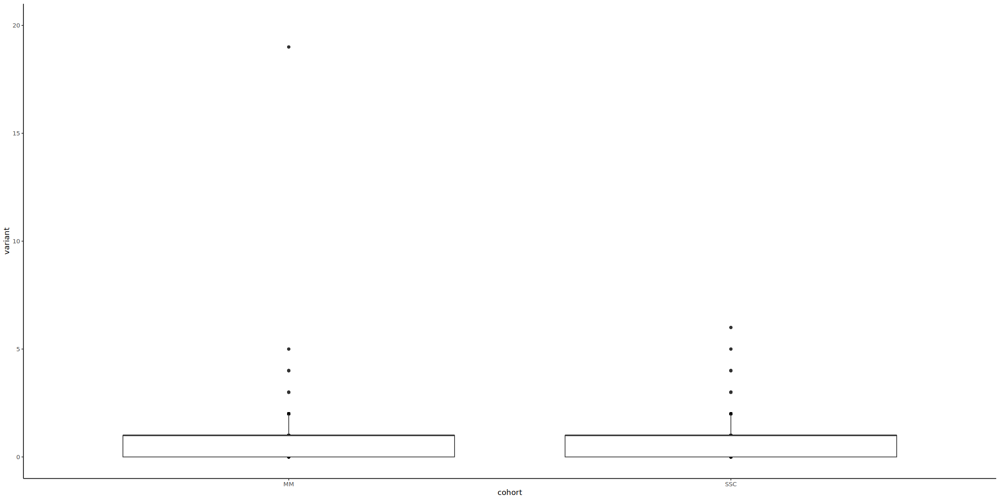

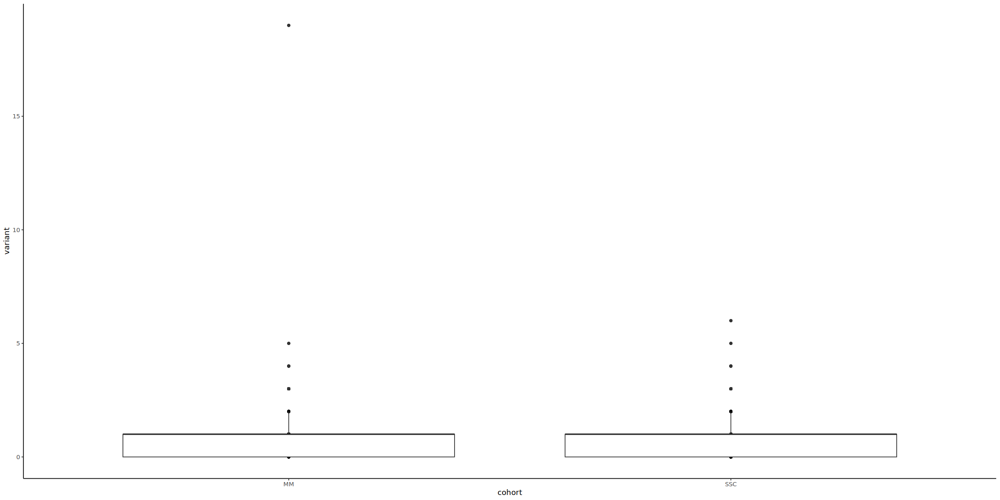

In [56]:

df.total <- subset(df.melt, df.melt$class == 'All')
head(df.total)
ggplot(df.total, aes(x= cohort, y=variant)) + 
geom_point() + 
geom_boxplot() + theme_classic() + 
scale_y_continuous(limits = c(0,20))

df.total <- subset(df.melt, df.melt$class == 'All')
head(df.total)
ggplot(df.total, aes(x= cohort, y=variant)) + 
geom_point() + 
geom_boxplot() + theme_classic()

## plot

In [57]:
figure_a = c('All','Coding', 'Nonsynonymous', 'Missense', 'Missense3', 'LGD', 'Damaging', 'Synonymous')#, 'Splice_region')
figure_b = c('LGD', 'LGD_SNV', 'LGD_FS', 'Inframe', 'Splice_region')

In [58]:
#install.packages("Hmisc")
library("Hmisc")

ERROR: Error in library("Hmisc"): there is no package called 'Hmisc'


In [59]:
SE <- function(values){
    se = sd(values) / sqrt(length(values))
    return (se)
}

CI <- function(values){
    t = qt((1-0.05)/2 + 0.5, length(values)-1)
    ci = t*SE(values)
    return (as.numeric(ci))
}

No summary function supplied, defaulting to `mean_se()`


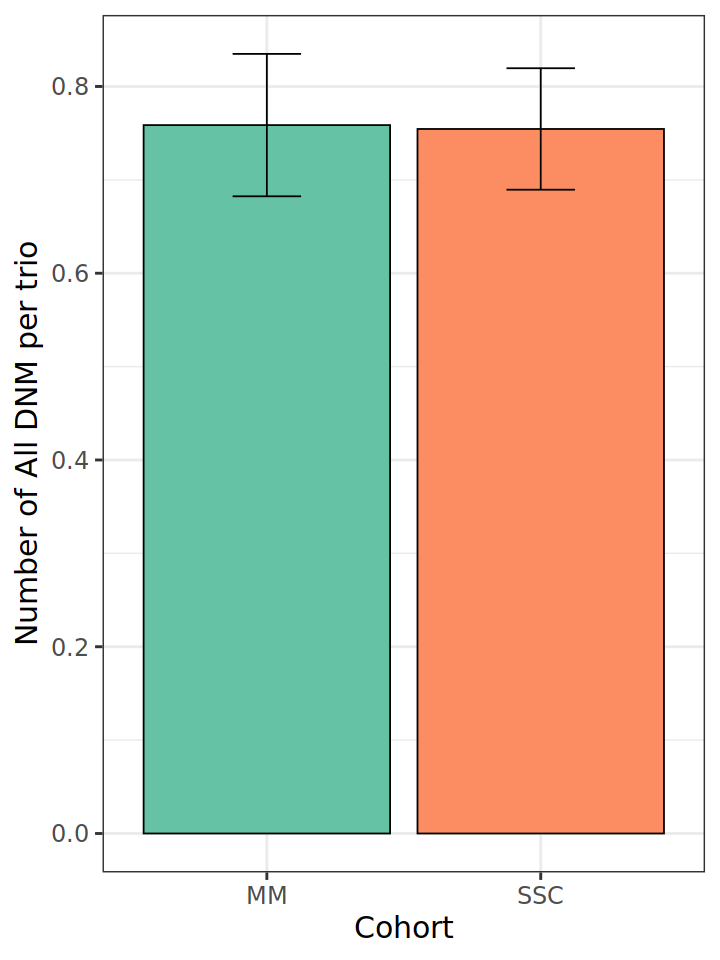

In [60]:
#Not filtering by coding term
options(repr.plot.width=6, repr.plot.height=8)

Get_summary <- function(input, category){
    df_tmp <- data.frame()
    tmp_data = subset(df.melt, class == category)
    head(tmp_data)
    tmp_mm = tmp_data[tmp_data$cohort == 'MM', ]
    tmp_ssc = tmp_data[tmp_data$cohort == 'SSC', ]
    mean(tmp_mm$variant)
    df_tmp <- rbind(df_tmp,c('MM', mean(tmp_mm$variant), sd(tmp_mm$variant), SE(tmp_mm$variant), CI(tmp_mm$variant)))
    df_tmp <- rbind(df_tmp, c('SSC', mean(tmp_ssc$variant), sd(tmp_ssc$variant),SE(tmp_ssc$variant), CI(tmp_ssc$variant)))
    colnames(df_tmp) = c('cohort', 'mean', 'sd', 'se', 'ci')
    return (df_tmp)
}


df_tmp <- Get_summary(df.melt, 'All')
p = ggplot(data=df_tmp, width=0.7) +
    geom_bar(aes(x = cohort,y = as.numeric(mean), fill = cohort),
             color='black', 
             position = position_dodge(width = 0.8), 
             stat = "summary") +
    # stat_summary(fun.data = mean_cl_normal, geom = "errorbar", position = position_dodge(width = 0.8), width = 0.25) +
    geom_errorbar(aes(x = cohort,ymin= as.numeric(mean) - as.numeric(ci), ymax = as.numeric(mean) + as.numeric(ci)), position = position_dodge(width = 0.8), width = 0.25)+
   # stat_summary(aes(mean_se(tmp_data$variant)), geom = "errorbar") + 
    scale_fill_brewer(palette='Set2') +
    labs(fill='Cohort', x='Cohort', y='Number of All DNM per trio') +
    theme(legend.position='none')
p



cohort,category,mean,sd,se,ci
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
MM,All,0.758620689655172,1.08664251571651,0.038833435399578,0.0762301191356766
SSC,All,0.75448275862069,0.892183623168988,0.0331348679240785,0.0650518967017751
MM,Coding,0.316730523627075,0.641141515295096,0.0229125285050923,0.04497734387058
SSC,Coding,0.284137931034483,0.524888288834283,0.0194938616600513,0.03827124580469
MM,Noncoding,0.441890166028097,0.737301711654075,0.0263490135673898,0.0517231716092651
SSC,Noncoding,0.470344827586207,0.728857061251608,0.0270690716943699,0.0531432465555562


[1] "===All==="


	Wilcoxon rank sum test with continuity correction

data:  df.mm$All and df.ss$All
W = 281374, p-value = 0.7511
alternative hypothesis: true location shift is not equal to 0


[1] "Mean of mm dnm:  0.758620689655172"

[1] "Mean of control dnm:  0.75448275862069"

[1] "===Coding==="


	Wilcoxon rank sum test with continuity correction

data:  df.mm$Coding and df.ss$Coding
W = 287750, p-value = 0.5429
alternative hypothesis: true location shift is not equal to 0


[1] "Mean of mm dnm:  0.316730523627075"

[1] "Mean of control dnm:  0.284137931034483"

[1] "===Noncoding==="


	Wilcoxon rank sum test with continuity correction

data:  df.mm$Noncoding and df.ss$Noncoding
W = 278769, p-value = 0.477
alternative hypothesis: true location shift is not equal to 0


[1] "Mean of mm dnm:  0.441890166028097"

[1] "Mean of control dnm:  0.470344827586207"

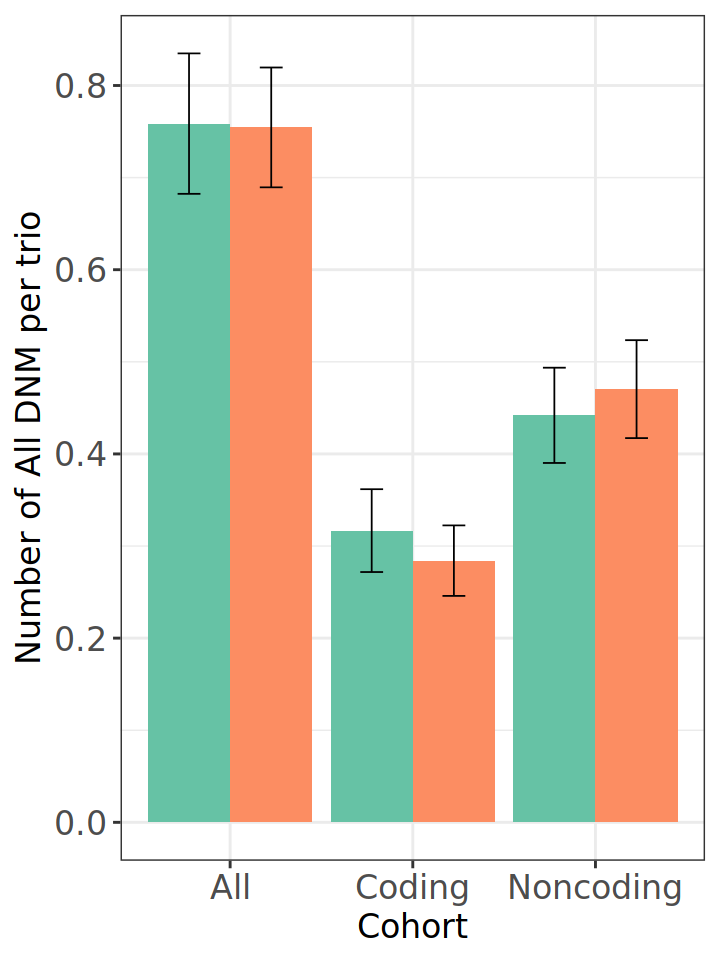

In [61]:
#Not filtering by coding term
options(repr.plot.width=6, repr.plot.height=8)

#Not filtering by coding term
options(repr.plot.width=6, repr.plot.height=8)

Get_summary <- function(input, category){
    
    tmp_data = subset(df.melt, class == category)
    head(tmp_data)
    tmp_mm = tmp_data[tmp_data$cohort == 'MM', ]
    tmp_ssc = tmp_data[tmp_data$cohort == 'SSC', ]
    mean(tmp_mm$variant)
    df_tmp <- rbind(df_tmp,c('MM', category,  mean(tmp_mm$variant), sd(tmp_mm$variant), SE(tmp_mm$variant), CI(tmp_mm$variant)))
    df_tmp <- rbind(df_tmp, c('SSC',category, mean(tmp_ssc$variant), sd(tmp_ssc$variant),SE(tmp_ssc$variant), CI(tmp_ssc$variant)))
    colnames(df_tmp) = c('cohort', 'category','mean', 'sd', 'se', 'ci')
    return (df_tmp)
}


df_tmp <- data.frame()
df_tmp <- Get_summary(df.melt, 'All')
df_tmp <- Get_summary(df.melt, 'Coding')
df_tmp <- Get_summary(df.melt, 'Noncoding')

df_tmp

p = ggplot(data=df_tmp,aes(x = as.factor(category),y = as.numeric(mean), fill = cohort), width=0.7) +
    #geom_bar(,
   #          color='black', 
   #          position = position_dodge(width = 1), 
    #         stat = "identity") +
    geom_col(position = "dodge") + 
    geom_errorbar(aes(x = as.factor(category), ymin= as.numeric(mean) - as.numeric(ci), ymax = as.numeric(mean) + as.numeric(ci)),
                  position = position_dodge(width=0.9), width = 0.25, stat = 'identity')+
    
    scale_fill_brewer(palette='Set2') +
    labs(fill='Cohort', x='Cohort', y='Number of All DNM per trio') +
    theme(legend.position='none') + 
    theme(text = element_text(size = 20),
         axis.text.x = element_text(size = 20),
         axis.text.y = element_text(size = 20))
p

"===All==="
wilcox.test(df.mm$All, df.ss$All, alternative= "two.sided")
paste("Mean of mm dnm: ", mean(df.mm$All))
paste("Mean of control dnm: ", mean(df.ss$All))

"===Coding==="
wilcox.test(df.mm$Coding, df.ss$Coding, alternative= "two.sided")
paste("Mean of mm dnm: ", mean(df.mm$Coding))
paste("Mean of control dnm: ", mean(df.ss$Coding))

"===Noncoding==="
wilcox.test(df.mm$Noncoding, df.ss$Noncoding, alternative= "two.sided")
paste("Mean of mm dnm: ", mean(df.mm$Noncoding))
paste("Mean of control dnm: ", mean(df.ss$Noncoding))

#pdf = (p, "")

## INDEL

,sample,family,cohort,callable,class,variant
,<fct>,<chr>,<chr>,<chr>,<fct>,<table[1d]>
1,S14383,103,MM,78872610,All,0
2,S14386,103,MM,79120866,All,0
3,11000.s1,11000,SSC,47881923,All,1
4,11002.s1,11002,SSC,55431363,All,3
5,11003.s1,11003,SSC,62732391,All,3
6,11004.s1,11004,SSC,64331070,All,0


cohort,category,mean,sd,se,ci
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
MM,All,0.758620689655172,1.08664251571651,0.038833435399578,0.0762301191356766
SSC,All,0.75448275862069,0.892183623168988,0.0331348679240785,0.0650518967017751
MM,SNV,0.717752234993614,1.07078337598146,0.0382666759828551,0.0751175691535926
SSC,SNV,0.72,0.865355290620867,0.0321384886670286,0.0630957591172247
MM,INDEL,0.0408684546615581,0.228114167614672,0.00815213528245932,0.0160026594968412
SSC,INDEL,0.0344827586206897,0.182591576337151,0.00678128090324164,0.0133133225650442


[1] "===All==="


	Wilcoxon rank sum test with continuity correction

data:  df.mm$All and df.ss$All
W = 281374, p-value = 0.7511
alternative hypothesis: true location shift is not equal to 0


[1] "Mean of mm dnm:  0.758620689655172"

[1] "Mean of control dnm:  0.75448275862069"

[1] "===SNV==="


	Wilcoxon rank sum test with continuity correction

data:  df.mm$SNV and df.ss$SNV
W = 279378, p-value = 0.5633
alternative hypothesis: true location shift is not equal to 0


[1] "Mean of mm dnm:  0.717752234993614"

[1] "Mean of control dnm:  0.72"

[1] "===INDEL==="


	Wilcoxon rank sum test with continuity correction

data:  df.mm$INDEL and df.ss$INDEL
W = 284238, p-value = 0.8822
alternative hypothesis: true location shift is not equal to 0


[1] "Mean of mm dnm:  0.0408684546615581"

[1] "Mean of control dnm:  0.0344827586206897"

[1] "+++++++++++"

[1] "Rate of SNV/INDEL in all:  19.0175438596491"

[1] "Rate of SNV/INDEL in mm:  17.5625"

[1] "Rate of SNV/INDEL in ssc:  20.88"

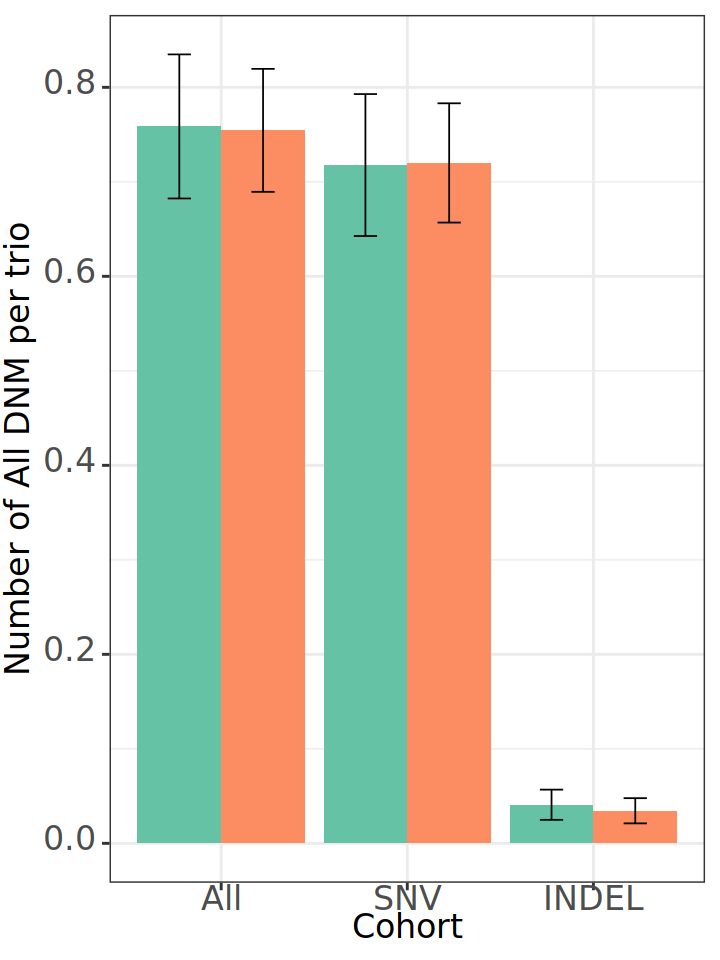

In [62]:
#Not filtering by coding term
options(repr.plot.width=6, repr.plot.height=8)
#subset(df.melt, df.melt$class == 'SNV')

Get_summary <- function(input, category){
    
    tmp_data = subset(df.melt, class == category)
    head(tmp_data)
    tmp_mm = tmp_data[tmp_data$cohort == 'MM', ]
    tmp_ssc = tmp_data[tmp_data$cohort == 'SSC', ]
    mean(tmp_mm$variant)
    df_tmp <- rbind(df_tmp,c('MM', category,  mean(tmp_mm$variant), sd(tmp_mm$variant), SE(tmp_mm$variant), CI(tmp_mm$variant)))
    df_tmp <- rbind(df_tmp, c('SSC',category, mean(tmp_ssc$variant), sd(tmp_ssc$variant),SE(tmp_ssc$variant), CI(tmp_ssc$variant)))
    colnames(df_tmp) = c('cohort', 'category','mean', 'sd', 'se', 'ci')
    return (df_tmp)
}


df_tmp <- data.frame()
df_tmp <- Get_summary(df.melt, 'All')
head(df.melt)
df_tmp <- Get_summary(df.melt, 'SNV')
df_tmp <- Get_summary(df.melt, 'INDEL')

df_tmp


df_tmp$category <- factor(df_tmp$category, levels=c("All", "SNV", "INDEL"))

p = ggplot(data=df_tmp,aes(x = as.factor(category),y = as.numeric(mean), fill = cohort), width=0.7) +
    #geom_bar(,
   #          color='black', 
   #          position = position_dodge(width = 1), 
    #         stat = "identity") +
    geom_col(position = "dodge") + 
    geom_errorbar(aes(x = as.factor(category), ymin= as.numeric(mean) - as.numeric(ci), ymax = as.numeric(mean) + as.numeric(ci)),
                  position = position_dodge(width=0.9), width = 0.25, stat = 'identity')+
    
    scale_fill_brewer(palette='Set2') +
    labs(fill='Cohort', x='Cohort', y='Number of All DNM per trio') +
    theme(legend.position='none') + 
    theme(text = element_text(size = 20),
         axis.text.x = element_text(size = 20),
         axis.text.y = element_text(size = 20))
p

"===All==="
wilcox.test(df.mm$All, df.ss$All, alternative= "two.sided")
paste("Mean of mm dnm: ", mean(df.mm$All))
paste("Mean of control dnm: ", mean(df.ss$All))

"===SNV==="
wilcox.test(df.mm$SNV, df.ss$SNV, alternative= "two.sided")
paste("Mean of mm dnm: ", mean(df.mm$SNV))
paste("Mean of control dnm: ", mean(df.ss$SNV))

"===INDEL==="
wilcox.test(df.mm$INDEL, df.ss$INDEL, alternative= "two.sided")
paste("Mean of mm dnm: ", mean(df.mm$INDEL))
paste("Mean of control dnm: ", mean(df.ss$INDEL))

"+++++++++++"
paste("Rate of SNV/INDEL in all: ",mean(df$SNV)/mean(df$INDEL) )

paste("Rate of SNV/INDEL in mm: ",mean(df.mm$SNV)/mean(df.mm$INDEL) )
paste("Rate of SNV/INDEL in ssc: ",mean(df.ss$SNV)/mean(df.ss$INDEL) )

#pdf = (p, "")

No summary function supplied, defaulting to `mean_se()`


[1] "===All==="


	Wilcoxon rank sum test with continuity correction

data:  df.mm$All and df.ss$All
W = 281374, p-value = 0.7511
alternative hypothesis: true location shift is not equal to 0


[1] "Mean of mm dnm:  0.758620689655172"

[1] "Mean of control dnm:  0.75448275862069"

[1] "===Coding==="


	Wilcoxon rank sum test with continuity correction

data:  df.mm$Coding and df.ss$Coding
W = 287750, p-value = 0.5429
alternative hypothesis: true location shift is not equal to 0


[1] "Mean of mm dnm:  0.316730523627075"

[1] "Mean of control dnm:  0.284137931034483"

[1] "===Noncoding==="


	Wilcoxon rank sum test with continuity correction

data:  df.mm$Noncoding and df.ss$Noncoding
W = 278769, p-value = 0.477
alternative hypothesis: true location shift is not equal to 0


[1] "Mean of mm dnm:  0.441890166028097"

[1] "Mean of control dnm:  0.470344827586207"

Warning message in geom_bar(aes(fill = cohort), color = "black", position = position_dodge(width = 0.8), :
"Ignoring unknown parameters: `fun.y`"
Don't know how to automatically pick scale for object of type <table>. Defaulting to
continuous.
No summary function supplied, defaulting to `mean_se()`
Warning message:
"Computation failed in `stat_summary()`
Caused by error in `fun.data()`:
! The package `Hmisc` is required."


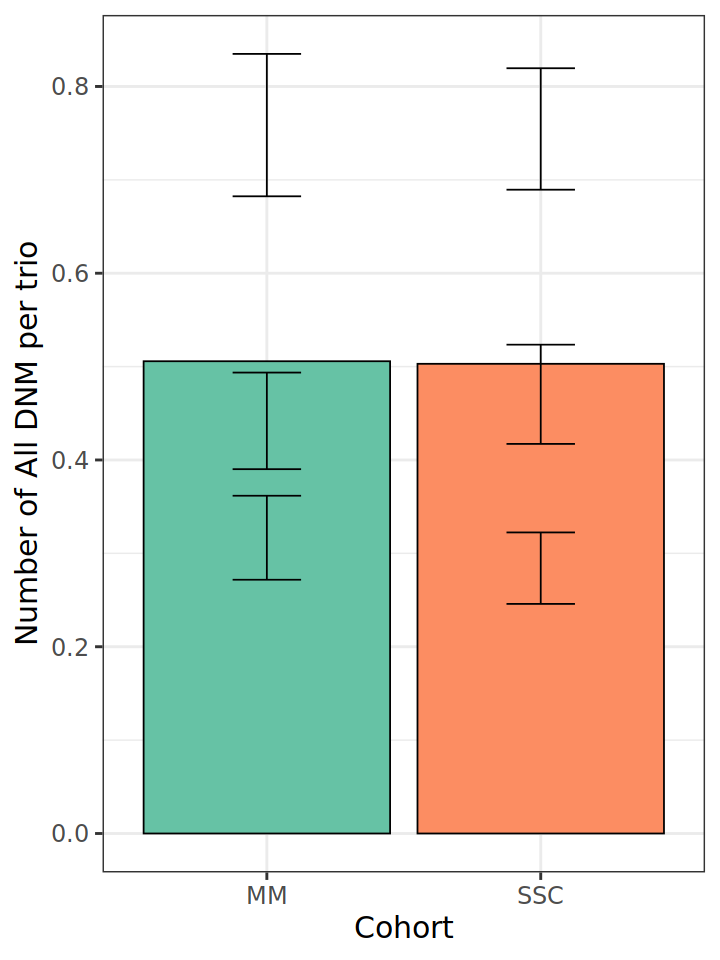


	Wilcoxon rank sum test with continuity correction

data:  df.mm$Coding and df.ss$Coding
W = 287750, p-value = 0.5429
alternative hypothesis: true location shift is not equal to 0


[1] "Mean of mm dnm:  0.316730523627075"

[1] "Mean of control dnm:  0.284137931034483"

Warning message in geom_bar(aes(fill = cohort), color = "black", position = position_dodge(width = 0.8), :
"Ignoring unknown parameters: `fun.y`"
Don't know how to automatically pick scale for object of type <table>. Defaulting to
continuous.
No summary function supplied, defaulting to `mean_se()`
Warning message:
"Computation failed in `stat_summary()`
Caused by error in `fun.data()`:
! The package `Hmisc` is required."


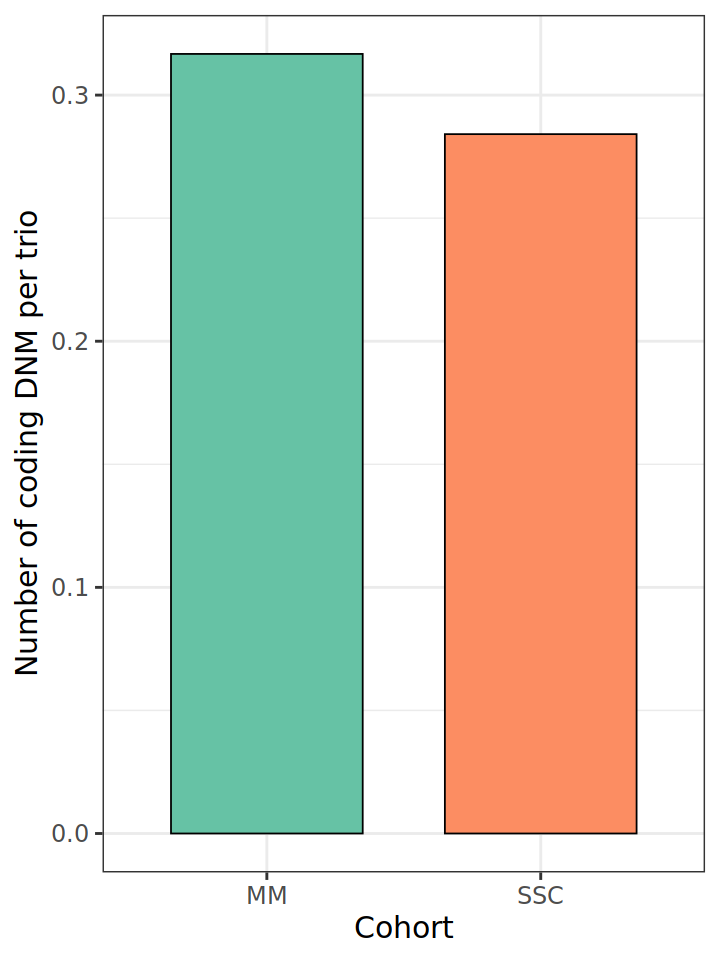


	Wilcoxon rank sum test with continuity correction

data:  df.mm$Noncoding and df.ss$Noncoding
W = 278769, p-value = 0.477
alternative hypothesis: true location shift is not equal to 0


[1] "Mean of mm dnm:  0.441890166028097"

[1] "Mean of control dnm:  0.470344827586207"

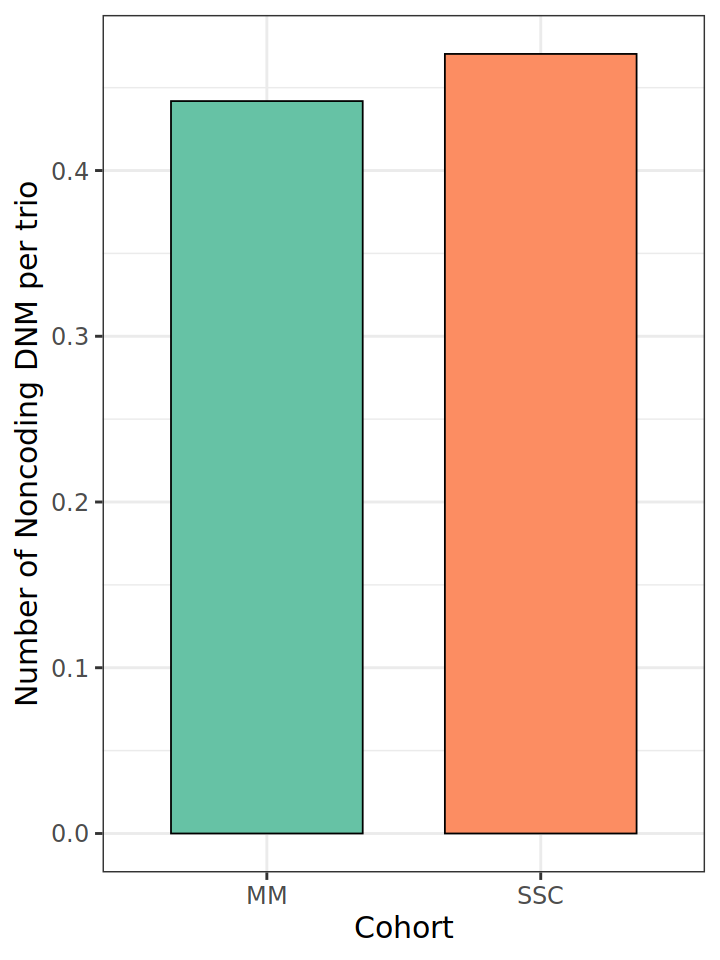

In [63]:
#Not filtering by coding term
options(repr.plot.width=6, repr.plot.height=8)

#Not filtering by coding term
options(repr.plot.width=6, repr.plot.height=8)

Get_summary <- function(input, category){
    
    tmp_data = subset(df.melt, class == category)
    head(tmp_data)
    tmp_mm = tmp_data[tmp_data$cohort == 'MM', ]
    tmp_ssc = tmp_data[tmp_data$cohort == 'SSC', ]
    mean(tmp_mm$variant)
    df_tmp <- rbind(df_tmp,c('MM', category,  mean(tmp_mm$variant), sd(tmp_mm$variant), SE(tmp_mm$variant), CI(tmp_mm$variant)))
    df_tmp <- rbind(df_tmp, c('SSC',category, mean(tmp_ssc$variant), sd(tmp_ssc$variant),SE(tmp_ssc$variant), CI(tmp_ssc$variant)))
    colnames(df_tmp) = c('cohort', 'category','mean', 'sd', 'se', 'ci')
    return (df_tmp)
}


df_tmp <- data.frame()
df_tmp <- Get_summary(df.melt, 'All')
df_tmp <- Get_summary(df.melt, 'Coding')
df_tmp <- Get_summary(df.melt, 'Noncoding')

p = ggplot(data=df_tmp, width=0.7) +
    geom_bar(aes(x = cohort,y = as.numeric(mean), fill = cohort),
             color='black', 
             position = position_dodge(width = 0.8), 
             stat = "summary") +
    # stat_summary(fun.data = mean_cl_normal, geom = "errorbar", position = position_dodge(width = 0.8), width = 0.25) +
    geom_errorbar(aes(x = cohort,ymin= as.numeric(mean) - as.numeric(ci), ymax = as.numeric(mean) + as.numeric(ci)), position = position_dodge(width = 0.8), width = 0.25)+
   # stat_summary(aes(mean_se(tmp_data$variant)), geom = "errorbar") + 
    scale_fill_brewer(palette='Set2') +
    labs(fill='Cohort', x='Cohort', y='Number of All DNM per trio') +
    theme(legend.position='none')
p

"===All==="
wilcox.test(df.mm$All, df.ss$All, alternative= "two.sided")
paste("Mean of mm dnm: ", mean(df.mm$All))
paste("Mean of control dnm: ", mean(df.ss$All))

"===Coding==="
wilcox.test(df.mm$Coding, df.ss$Coding, alternative= "two.sided")
paste("Mean of mm dnm: ", mean(df.mm$Coding))
paste("Mean of control dnm: ", mean(df.ss$Coding))

"===Noncoding==="
wilcox.test(df.mm$Noncoding, df.ss$Noncoding, alternative= "two.sided")
paste("Mean of mm dnm: ", mean(df.mm$Noncoding))
paste("Mean of control dnm: ", mean(df.ss$Noncoding))





#Filtering by only coding term
options(repr.plot.width=6, repr.plot.height=8)
p = ggplot(data=subset(df.melt, class=='Coding'), aes(cohort,variant, width=0.7)) +
    geom_bar(aes(fill = cohort), color='black', position = position_dodge(width = 0.8), stat = "summary", fun.y = "mean") +
    stat_summary(fun.data = mean_cl_normal, geom = "errorbar", position = position_dodge(width = 0.8), width = 0.25) +
    scale_fill_brewer(palette='Set2') +
    labs(fill='Cohort', x='Cohort', y='Number of coding DNM per trio') +
    theme(legend.position='none')
p

wilcox.test(df.mm$Coding, df.ss$Coding, alternative= "two.sided")
paste("Mean of mm dnm: ", mean(df.mm$Coding))
paste("Mean of control dnm: ", mean(df.ss$Coding))


#Filtering by only noncoding term
options(repr.plot.width=6, repr.plot.height=8)
p = ggplot(data=subset(df.melt, class=='Noncoding'), aes(cohort,variant, width=0.7)) +
    geom_bar(aes(fill = cohort), color='black', position = position_dodge(width = 0.8), stat = "summary", fun.y = "mean") +
    stat_summary(fun.data = mean_cl_normal, geom = "errorbar", position = position_dodge(width = 0.8), width = 0.25) +
    scale_fill_brewer(palette='Set2') +
    labs(fill='Cohort', x='Cohort', y='Number of Noncoding DNM per trio') +
    theme(legend.position='none')
p

wilcox.test(df.mm$Noncoding, df.ss$Noncoding, alternative= "two.sided")
paste("Mean of mm dnm: ", mean(df.mm$Noncoding))
paste("Mean of control dnm: ", mean(df.ss$Noncoding))





In [64]:
c= c(sum(df.mm$All), sum(df.ss$All))
c
sum(df.mm$All)/sample.mm
sum(df.ss$All)/sample.ssc

T = c(sum(df.mm$callable), sum(df.ss$callable))
T
df.mm$All
df.mm$callable
paste("Poisson on NTD", percent, " consensus")
poisson.test(df.mm$All, df.mm$callable )

round(poisson.test(c,T)$p.value,3)
poisson.test(c, T)$estimate

total_size = 34350518 #size of coding region (hg19)

#callable

options(repr.plot.width=6, repr.plot.height=8)
p = ggplot(data=subset(df.melt, class=='All'), aes(cohort, variant / 64546288 * 100000000 / 2, width=0.7)) +
    geom_bar(aes(fill = cohort), color='black', position = position_dodge(width = 0.8), stat = "summary", fun.y = "mean") +
    stat_summary(fun.data = mean_cl_normal, geom = "errorbar", position = position_dodge(width = 0.8), width = 0.25) +
    scale_fill_brewer(palette='Set2') +
    scale_y_continuous(sec.axis = sec_axis(~ . / (100000000 / 2) * total_size, name = 'Theoretical Variant Rate (per child)')) +
    labs(fill='Cohort', x='Cohort', y='Variant rate (x 10e-8)') +
    theme(legend.position='bottom', axis.title.y.right = element_text( angle = 90))
p

[1] 594 547

[1] 0.7586207

[1] 0.7544828

ERROR: Error in sum(df.mm$callable): invalid 'type' (character) of argument


In [65]:
figure_a = c('All', 'Nonsynonymous', 'Missense', 'Missense3','Missense4','Missense5', 'LGD', 'Damaging', 'Synonymous')
total_size = 34350518 #size of coding region (hg19)
percent = '90'
consensus = read.delim(paste("/oasis/tscc/scratch/azoopatel/genome_cov_NTD/per_batch_", percent,"/consensus_count_all_batches.txt", sep=""), header = FALSE)


paste("consensus size is ", consensus[1,])
consensus_size = consensus[1,]

for (eff in figure_a) {
    c = c(sum(df.mm[, eff]), sum(df.ss[, eff]))
    T = c(sum(consensus_size), sum(consensus_size))
    pt = poisson.test(c, T, alternative='greater')
    show(paste0(eff, ': ', round(pt$p.value, 3), '   ', 'Rate ratio: ', pt$estimate))
}

options(repr.plot.width=14, repr.plot.height=8)
p = ggplot(data=subset(df.melt, class %in% figure_a), aes(class, variant * 100000000 / consensus_size / 2, width=0.7)) +
    geom_bar(aes(fill = cohort), color='black', position = position_dodge(width = 0.8), stat = "summary", fun = "mean") +
    #stat_summary(aes(group = cohort), fun.data = mean_cl_normal, geom = "errorbar", position = position_dodge(width = 0.80), width = 0.25, size=0.3) +
    geom_errorbar(stat='summary', fun="mean_se", width = 0.25)+
    scale_fill_brewer(palette='Set2') +
    scale_y_continuous(sec.axis = sec_axis(~ . / (100000000 / 2) * total_size, name = 'Theoretical Variant Rate (per child)')) +
    labs(fill='Cohort', x='', y='Variant rate (x 10e-8)') +
    theme(legend.position='bottom', axis.title.y.right = element_text( angle = 90))
p

[1] "consensus size is  26812411"

[1] "All: 0.087   Rate ratio: 1.08592321755027"
[1] "Nonsynonymous: 0.034   Rate ratio: 1.2258064516129"
[1] "Missense: 0.142   Rate ratio: 1.15384615384615"
[1] "Missense3: 0.033   Rate ratio: 1.86666666666667"
[1] "Missense4: 0.239   Rate ratio: 1.15254237288136"
[1] "Missense5: 0.091   Rate ratio: 1.38235294117647"
[1] "LGD: 0.033   Rate ratio: 1.52941176470588"
[1] "Damaging: 0.004   Rate ratio: 1.63265306122449"
[1] "Synonymous: 0.283   Rate ratio: 1.13725490196078"


ERROR while rich displaying an object: Error in `[.data.frame`(data[[var]], scale_index[[i]]): undefined columns selected

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler)
6. repr::mime2repr[[mime]](obj)
7. repr_text.default(obj)


## ARZOO ERROR BAR

m

[1] "All: 0.134   Rate ratio: 1.06842105263158"
[1] "Coding: 0.055   Rate ratio: 1.15677966101695"
[1] "Noncoding: 0.485   Rate ratio: 1.0059880239521"
[1] "Nonsynonymous: 0.069   Rate ratio: 1.16949152542373"
[1] "Missense: 0.258   Rate ratio: 1.08759124087591"
[1] "Missense3: 0.106   Rate ratio: 1.47619047619048"
[1] "Missense4: 0.227   Rate ratio: 1.14925373134328"
[1] "LGD: 0.029   Rate ratio: 1.52777777777778"
[1] "Damaging: 0.009   Rate ratio: 1.50877192982456"
[1] "Synonymous: 0.296   Rate ratio: 1.11864406779661"


Warning message:
"Computation failed in `stat_summary()`:
undefined columns selected"


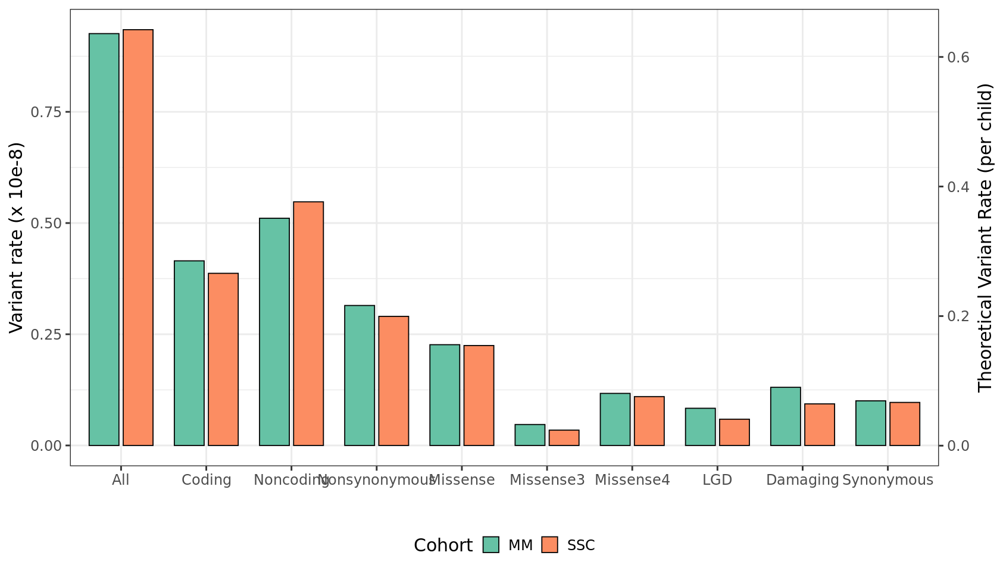

In [371]:


figure_a = c('All', 'Coding','Noncoding','Nonsynonymous', 'Missense', 'Missense3', 'Missense4','LGD', 'Damaging', 'Synonymous')
##40%
consensus_size = 42056047

##60%
#consensus_size = 58829901

for (eff in figure_a) {
    c = c(sum(df.mm[, eff]), sum(df.ss[, eff]))
    T = c(sum(consensus_size), sum(consensus_size))
    pt = poisson.test(c, T, alternative='greater')
    show(paste0(eff, ': ', round(pt$p.value, 3), '   ', 'Rate ratio: ', pt$estimate))
}

options(repr.plot.width=14, repr.plot.height=8)
p = ggplot(data=subset(df.melt, class %in% figure_a), aes(class, variant * 100000000 / consensus_size / 2, width=0.7)) +
    geom_bar(aes(fill = cohort), color='black', position = position_dodge(width = 0.8), stat = "summary", fun = "mean") +
    #stat_summary(aes(group = cohort), fun.data = mean_cl_normal, geom = "errorbar", position = position_dodge(width = 0.80), width = 0.25, size=0.3) +
    geom_errorbar(stat='summary', fun="mean_se", width = 0.25)+
    scale_fill_brewer(palette='Set2') +
    scale_y_continuous(sec.axis = sec_axis(~ . / (100000000 / 2) * total_size, name = 'Theoretical Variant Rate (per child)')) +
    labs(fill='Cohort', x='', y='Variant rate (x 10e-8)') +
    theme(legend.position='bottom', axis.title.y.right = element_text( angle = 90))
p

[1] "Coding: 0.055   Rate ratio: 1.15677966101695"
[1] "Noncoding: 0.485   Rate ratio: 1.0059880239521"
[1] "Nonsynonymous: 0.069   Rate ratio: 1.16949152542373"
[1] "Missense: 0.258   Rate ratio: 1.08759124087591"
[1] "Missense3: 0.106   Rate ratio: 1.47619047619048"
[1] "LGD: 0.029   Rate ratio: 1.52777777777778"
[1] "Damaging: 0.009   Rate ratio: 1.50877192982456"
[1] "Synonymous: 0.296   Rate ratio: 1.11864406779661"


Warning message:
"Computation failed in `stat_summary()`:
undefined columns selected"


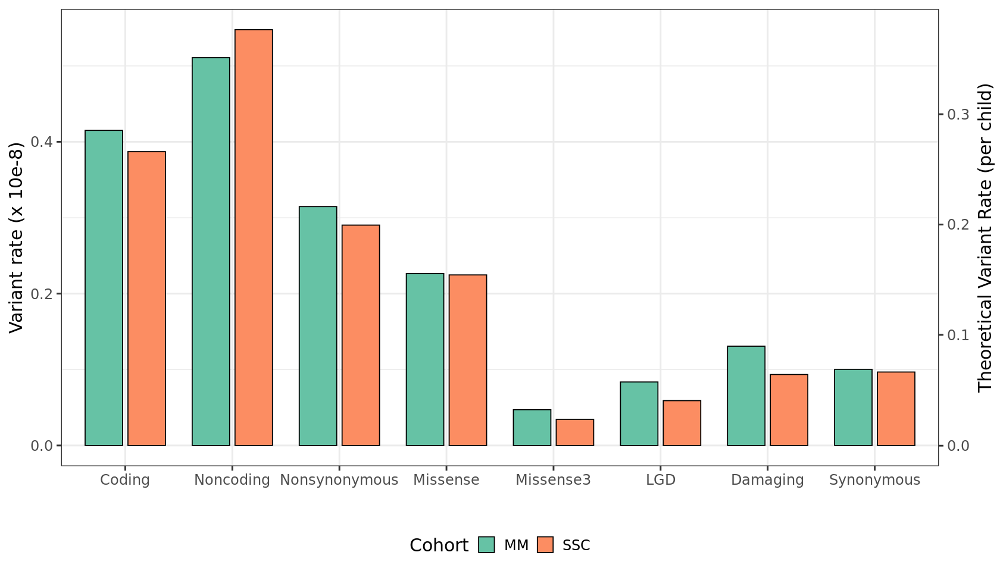

In [372]:
figure_a = c('Coding','Noncoding','Nonsynonymous', 'Missense', 'Missense3', 'LGD', 'Damaging', 'Synonymous')
##40%
consensus_size =42056047

##60%
#consensus_size = 58829901

for (eff in figure_a) {
    c = c(sum(df.mm[, eff]), sum(df.ss[, eff]))
    T = c(sum(consensus_size), sum(consensus_size))
    pt = poisson.test(c, T, alternative='greater')
    show(paste0(eff, ': ', round(pt$p.value, 3), '   ', 'Rate ratio: ', pt$estimate))
}

options(repr.plot.width=14, repr.plot.height=8)
p = ggplot(data=subset(df.melt, class %in% figure_a), aes(class, variant * 100000000 / consensus_size / 2, width=0.7)) +
    geom_bar(aes(fill = cohort), color='black', position = position_dodge(width = 0.8), stat = "summary", fun = "mean") +
    #stat_summary(aes(group = cohort), fun.data = mean_cl_normal, geom = "errorbar", position = position_dodge(width = 0.80), width = 0.25, size=0.3) +
    geom_errorbar(stat='summary', fun="mean_se", width = 0.25)+
    scale_fill_brewer(palette='Set2') +
    scale_y_continuous(sec.axis = sec_axis(~ . / (100000000 / 2) * total_size, name = 'Theoretical Variant Rate (per child)')) +
    labs(fill='Cohort', x='', y='Variant rate (x 10e-8)') +
    theme(legend.position='bottom', axis.title.y.right = element_text( angle = 90))
p

# total set

[1] "LGD: 0.029   Rate ratio: 1.52777777777778"
[1] "LGD_SNV: 0.035   Rate ratio: 1.73684210526316"
[1] "LGD_FS: 0.209   Rate ratio: 1.375"
[1] "Inframe: 0.938   Rate ratio: 0.333333333333333"


Warning message:
"Computation failed in `stat_summary()`:
undefined columns selected"


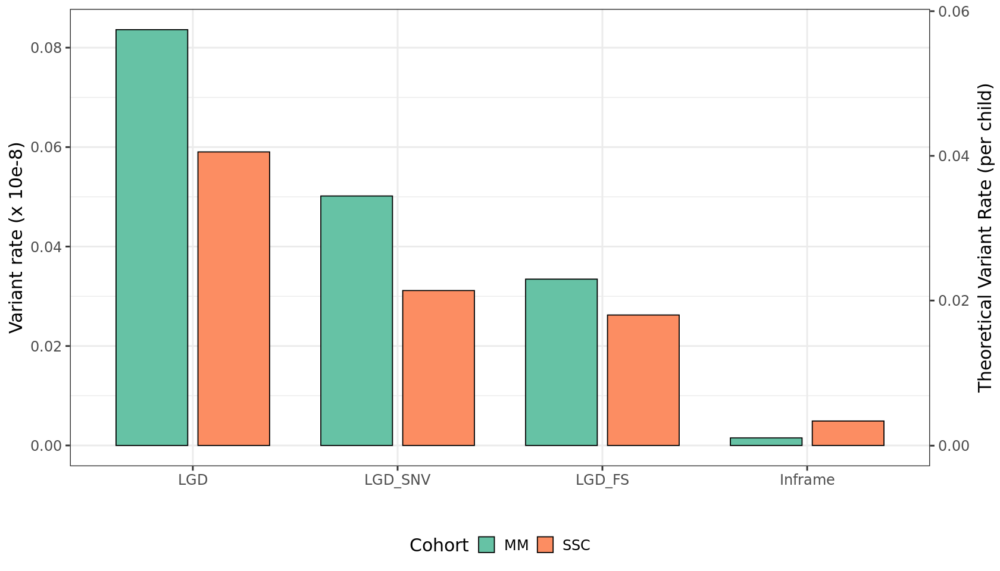

In [373]:
figure_b = c('LGD', 'LGD_SNV', 'LGD_FS', 'Inframe') #, 'Splice_region')

##40%
consensus_size = 42056047

##60%
#consensus_size = 58829901

for (eff in figure_b) {
    c = c(sum(df.mm[, eff]), sum(df.ss[, eff]))
    T = c(sum(consensus_size), sum(consensus_size))
    pt = poisson.test(c, T, alternative='greater')
    show(paste0(eff, ': ', round(pt$p.value, 3), '   ', 'Rate ratio: ', pt$estimate))
}

options(repr.plot.width=14, repr.plot.height=8)
p = ggplot(data=subset(df.melt, class %in% figure_b), aes(class, variant * 100000000 / consensus_size / 2, width=0.7)) +
    geom_bar(aes(fill = cohort), color='black', position = position_dodge(width = 0.8), stat = "summary", fun = "mean") +
    #stat_summary(aes(group = cohort), fun.data = mean_cl_normal, geom = "errorbar", position = position_dodge(width = 0.80), width = 0.25, size=0.3) +
    geom_errorbar(stat='summary', fun="mean_se", width = 0.25)+
    scale_fill_brewer(palette='Set2') +
    scale_y_continuous(sec.axis = sec_axis(~ . / (100000000 / 2) * total_size, name = 'Theoretical Variant Rate (per child)')) +
    labs(fill='Cohort', x='', y='Variant rate (x 10e-8)') +
    theme(legend.position='bottom', axis.title.y.right = element_text( angle = 90))
p



[1] "LGD: 0.029   Rate ratio: 1.52777777777778"
[1] "LGD_FS: 0.209   Rate ratio: 1.375"
[1] "LGD_SP_A: 0.688   Rate ratio: 1"
[1] "LGD_SP_D: 0.344   Rate ratio: 2"
[1] "LGD_STOP: 0.063   Rate ratio: 1.6875"


Warning message:
"Computation failed in `stat_summary()`:
undefined columns selected"


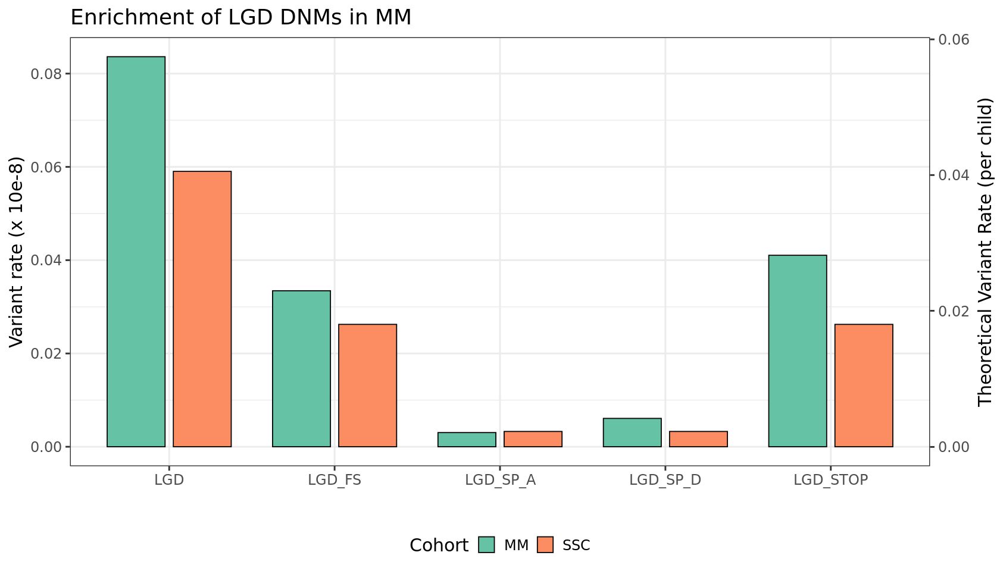

In [374]:
figure_c = c('LGD', 'LGD_FS', 'LGD_SP_A', 'LGD_SP_D','LGD_STOP') 
##40%

data.fil = data.fil.save
##60%
#consensus_size = 58829901

for (eff in figure_c) {
    c = c(sum(df.mm[, eff]), sum(df.ss[, eff]))
    T = c(sum(consensus_size), sum(consensus_size))
    pt = poisson.test(c, T, alternative='greater')
    show(paste0(eff, ': ', round(pt$p.value, 3), '   ', 'Rate ratio: ', pt$estimate))
}

options(repr.plot.width=14, repr.plot.height=8)
p = ggplot(data=subset(df.melt, class %in% figure_c), aes(class, variant * 100000000 / consensus_size / 2, width=0.7)) +
    geom_bar(aes(fill = cohort), color='black', position = position_dodge(width = 0.8), stat = "summary", fun = "mean") +
    #stat_summary(aes(group = cohort), fun.data = mean_cl_normal, geom = "errorbar", position = position_dodge(width = 0.80), width = 0.25, size=0.3) +
    geom_errorbar(stat='summary', fun="mean_se", width = 0.25)+
    scale_fill_brewer(palette='Set2') +
    scale_y_continuous(sec.axis = sec_axis(~ . / (100000000 / 2) * total_size, name = 'Theoretical Variant Rate (per child)')) +
    labs(fill='Cohort', x='', y='Variant rate (x 10e-8)') +
    theme(legend.position='bottom', axis.title.y.right = element_text( angle = 90)) + 
    ggtitle(label = "Enrichment of LGD DNMs in MM")
p



## Intolerant genes

In [323]:

data.fil.save = data.fil

In [324]:
#head(data.fil)
data.fil.ori = data.fil
colnames(data.fil)[5] = "sample"
colnames(ped.pro)[2] = "sample"
data.intol = subset(data.fil.ori, as.numeric(data.fil.ori$pLI) >0.9)
data.fil = data.intol
head(data.intol)
data.fil$sample = factor(as.vector(data.fil$sample), levels=as.vector(ped.pro$sample))
df = data.frame(sample = factor(levels(data.fil$sample), levels=levels(data.fil$sample)))
df = merge(df, ped.pro[, c('sample', 'family')], by.x= 'sample',by.y = 'sample', sort = F, all.x = TRUE)
head(df)
df$cohort = ifelse(levels(data.fil$sample) %in% ped.pro[grepl('s', ped.pro$sample), ]$sample, 'SSC', 'MM')
#df$cohort = factor(df$cohort, levels=c('MM', 'SSC'))
head(df)
dim(df)
#df = left_join(df, callable, by = 'sample')
df = merge(df, callable[, c('sample', 'callable')], by= 'sample', sort = F, all.x=TRUE)
df$callable = ifelse(is.na(df$callable), 'NA', df$callable)
dim(df)
head(df)




df$All = table(data.fil$sample)

df$Coding = table(data.fil[data.fil$term %in% coding_term,]$sample)
df$Noncoding = table(data.fil[!data.fil$term %in% coding_term,]$sample)
df$Nonsynonymous = table(data.fil[data.fil$term != 'synonymous_variant' &data.fil$term %in% coding_term ,]$sample)
df$Missense = table(data.fil[data.fil$term == 'missense_variant',]$sample)
df$Missense3 = table(data.fil[data.fil$term == 'missense_variant' & (data.fil$metasvm == 'D' ),]$sample)
df$Missense4 = table(data.fil[data.fil$term == 'missense_variant'& grepl("damaging",data.fil$polyphen),]$sample)



term.lgd = c('frameshift_variant', 'splice_acceptor_variant', 'splice_donor_variant', 'stop_gained')
term.coding = c()
df$LGD = table(data.fil[data.fil$term %in% term.lgd,]$sample)
df$Damaging = table(data.fil[data.fil$term %in% term.lgd | data.fil$term == 'missense_variant' & (data.fil$metasvm == 'D' ),]$sample)


df$Synonymous = table(data.fil[data.fil$term == 'synonymous_variant',]$sample)
df$LGD_SNV = table(data.fil[data.fil$term %in% term.lgd & data.fil$var_class == 'SNV',]$sample)
df$LGD_FS = table(data.fil[data.fil$term == 'frameshift_variant',]$sample)
df$Inframe = table(data.fil[data.fil$term == 'inframe_deletion' | data.fil$term == 'inframe_insertion',]$sample)
df$Splice_region = table(data.fil[data.fil$term == 'splice_region_variant',]$sample)

df$LGD_FS = table(data.fil[data.fil$term == 'frameshift_variant',]$sample)
df$LGD_SP_A = table(data.fil[data.fil$term == 'splice_acceptor_variant',]$sample)
df$LGD_SP_D = table(data.fil[data.fil$term == 'splice_donor_variant',]$sample)
df$LGD_STOP = table(data.fil[data.fil$term == 'stop_gained',]$sample)


df$Tolerant_gene = table(data.fil[as.numeric(data.fil$pLI)<0.9 ,]$sample)
df$Intolerant_gene = table(data.fil[as.numeric(data.fil$pLI)>=0.9 ,]$sample)

df$SNV = table(data.fil[data.fil$var_class == 'SNV',]$sample)
df$INDEL = table(data.fil[data.fil$var_class == 'insertion' | data.fil$var_class == 'deletion',]$sample)
#ratio = ifelse(df$INDEL != 0, df$SNV/df$INDEL, NA)
#df <- cbind(df, ratio)

df
df.mm = df[df$cohort == 'MM', ]
df.ss = df[df$cohort == 'SSC', ]
head(df.mm)

dim(df.mm)
dim(df.ss)

dim(df.mm$All)
dim(df.ss$All)
df.melt <- melt(df, id.vars=c('sample', 'family', 'cohort', 'callable'))

df.mm = df[df$cohort == 'MM', ]
df.ss = df[df$cohort == 'SSC', ]
colnames(df.melt)[5] = 'class'
colnames(df.melt)[6] = 'variant'
head(df.melt)


,locus,ref,alt,family,sample,dad,mom,pro_s,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,var_class,term,on,gene,gene_id,protein,HGVS_c,HGVS_p,impact,polyphen,polyphen_score,sift,metasvm,metasvm_score,cadd,gnomad_an,gnomad_ac,gnomad_af,MQ,QD,filters,other_gene,occurence,samples,batch,Gene_interest,gene_alias,gene_hgnc,Approved.name,ppi,ppi_prediction,Inspection,pLI,pNull,pRec,oe_lof,oe_lof_lower,oe_lof_upper,DP_filter12,pval
,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
3,chr1:10418892,C,T,6137,1065817357,9484178706,6071727996,1,21,11,10,0/1,99,34,34,0,0/0,99,35,35,0,0/0,99,.,hiConfDeNovo,SNV,non_coding_transcript_exon_variant,4/6,PGD,ENSG00000142657,,ENST00000498356.1:n.433C>T,,MODIFIER,,0,,,NA,NA,NA,NA,NA,60,9.32,PASS,NA,2,1065817357/6578846017,Murat,NA,,PGD,phosphogluconate dehydrogenase,NA,NA,NA,0.98788,3.4517e-08,0.012117,0.11301,0.05,0.292,TRUE,1
4,chr1:10418892,C,T,6137,6578846017,9484178706,6071727996,1,137,71,66,0/1,99,34,34,0,0/0,99,35,35,0,0/0,99,.,hiConfDeNovo,SNV,non_coding_transcript_exon_variant,4/6,PGD,ENSG00000142657,,ENST00000498356.1:n.433C>T,,MODIFIER,,0,,,NA,NA,NA,NA,NA,60,9.32,PASS,NA,2,1065817357/6578846017,Macrogen,NA,,PGD,phosphogluconate dehydrogenase,NA,NA,NA,0.98788,3.4517e-08,0.012117,0.11301,0.05,0.292,TRUE,0.732684093591042
5,chr1:11013867,T,C,6292,1544002197,8967908026,2231421668,1,60,33,27,0/1,99,39,39,0,0/0,91,33,33,0,0/0,76,.,hiConfDeNovo,SNV,missense_variant,1/6,TARDBP,ENSG00000120948,ENSP00000497327,ENST00000649624.1:c.140T>C,ENSP00000497327.1:p.Val47Ala,MODERATE,benign(0.005),0.002,tolerated(0.32),T,0.68065,23.2,NA,NA,NA,60,8.85,PASS,NA,1,1544002197,Macrogen,NA,"TDP-43, ALS10",TARDBP,TAR DNA binding protein,NA,NA,NA,0.98542,1.3286e-06,0.014583,0.058054,0.02,0.275,TRUE,0.518958003189654
9,chr1:15928231,AC,A,6972,7273636705,4843125924,3251615950,2,69,31,38,0/1,99,35,35,0,0/0,76,33,33,0,0/0,76,.,hiConfDeNovo,deletion,frameshift_variant,11/15,SPEN,ENSG00000065526,ENSP00000364912,ENST00000375759.8:c.1993del,ENSP00000364912.3:p.Gln665LysfsTer144,HIGH,,0,,,NA,NA,NA,NA,NA,60,16.67,PASS,NA,1,7273636705,Murat,NA,"KIAA0929, MINT, SHARP, RBM15C",SPEN,spen family transcriptional repressor,NA,NA,0,1,1.155e-47,1.4629e-18,0.03101,0.014,0.071,TRUE,0.470368531858145
10,chr1:19126590,G,A,13058,13058.s1,13058.fa,13058.mo,1,94,50,44,0/1,99,38,38,0,0/0,76,38,38,0,0/0,79,.,hiConfDeNovo,SNV,non_coding_transcript_exon_variant,2/4,UBR4,ENSG00000127481,,ENST00000475973.1:n.145C>T,,MODIFIER,,0,,,NA,NA,NA,NA,NA,60,14.47,PASS,NA,1,13058.s1,SSC,NA,"KIAA1307, KIAA0462, RBAF600, p600,ZUBR1",UBR4,ubiquitin protein ligase E3 component n-recognin 4,NA,NA,NA,1,7.214e-85,2.0413e-30,0.062772,0.042,0.095,TRUE,0.606295937693966
14,chr1:23057487,C,T,6423,5354343250,2882125302,5991601920,1,50,26,24,0/1,99,34,34,0,0/0,76,35,35,0,0/0,76,.,hiConfDeNovo,SNV,missense_variant,7/17,KDM1A,ENSG00000004487,ENSP00000510144,ENST00000693156.1:c.934C>T,ENSP00000510144.1:p.Arg312Cys,MODERATE,probably_damaging(1),1,deleterious(0),D,0.9937,32,NA,NA,NA,60,13.46,PASS,NA,1,5354343250,Murat,NA,"KIAA0601, BHC110, LSD1,AOF2, KDM1",KDM1A,lysine demethylase 1A,NA,NA,NA,0.99667,2.4644e-12,0.0033338,0.14688,0.083,0.276,TRUE,0.887724827340787


,sample,family
,<fct>,<chr>
1,S14383,103
2,S14386,103
3,11000.s1,11000
4,11002.s1,11002
5,11003.s1,11003
6,11004.s1,11004


,sample,family,cohort
,<fct>,<chr>,<chr>
1,S14383,103,MM
2,S14386,103,MM
3,11000.s1,11000,SSC
4,11002.s1,11002,SSC
5,11003.s1,11003,SSC
6,11004.s1,11004,SSC


[1] 1507    3

[1] 1507    4

,sample,family,cohort,callable
,<fct>,<chr>,<chr>,<chr>
1,S14383,103,MM,78872610
2,S14386,103,MM,79120866
3,11000.s1,11000,SSC,47881923
4,11002.s1,11002,SSC,55431363
5,11003.s1,11003,SSC,62732391
6,11004.s1,11004,SSC,64331070


sample,family,cohort,callable,All,Coding,Noncoding,Nonsynonymous,Missense,Missense3,Missense4,LGD,Damaging,Synonymous,LGD_SNV,LGD_FS,Inframe,Splice_region,LGD_SP_A,LGD_SP_D,LGD_STOP,Tolerant_gene,Intolerant_gene,SNV,INDEL
<fct>,<chr>,<chr>,<chr>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>
S14383,103,MM,78872610,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
S14386,103,MM,79120866,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11000.s1,11000,SSC,47881923,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11002.s1,11002,SSC,55431363,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
11003.s1,11003,SSC,62732391,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
11004.s1,11004,SSC,64331070,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11005.s1,11005,SSC,53838822,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11007.s1,11007,SSC,53333492,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11008.s1,11008,SSC,58502617,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0


,sample,family,cohort,callable,All,Coding,Noncoding,Nonsynonymous,Missense,Missense3,Missense4,LGD,Damaging,Synonymous,LGD_SNV,LGD_FS,Inframe,Splice_region,LGD_SP_A,LGD_SP_D,LGD_STOP,Tolerant_gene,Intolerant_gene,SNV,INDEL
,<fct>,<chr>,<chr>,<chr>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>
1,S14383,103,MM,78872610,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,S14386,103,MM,79120866,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
454,S16128,122,MM,86739214,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
501,S13324,125,MM,77840952,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
521,S12833,126,MM,67342022,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
692,S16116,134,MM,88045008,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


[1] 782  25

[1] 725  25

[1] 782

[1] 725

,sample,family,cohort,callable,class,variant
,<fct>,<chr>,<chr>,<chr>,<fct>,<table>
1,S14383,103,MM,78872610,All,0
2,S14386,103,MM,79120866,All,0
3,11000.s1,11000,SSC,47881923,All,0
4,11002.s1,11002,SSC,55431363,All,1
5,11003.s1,11003,SSC,62732391,All,1
6,11004.s1,11004,SSC,64331070,All,0


[1] "Coding: 0.045   Rate ratio: 1.35593220338983"
[1] "Noncoding: 0.469   Rate ratio: 1.025"
[1] "Nonsynonymous: 0.032   Rate ratio: 1.5"
[1] "Missense: 0.06   Rate ratio: 1.5"
[1] "Missense3: 0.02   Rate ratio: 8"
[1] "LGD: 0.143   Rate ratio: 1.75"
[1] "Damaging: 0.015   Rate ratio: 2.44444444444444"
[1] "Synonymous: 0.44   Rate ratio: 1.0952380952381"


Warning message:
"Computation failed in `stat_summary()`:
undefined columns selected"


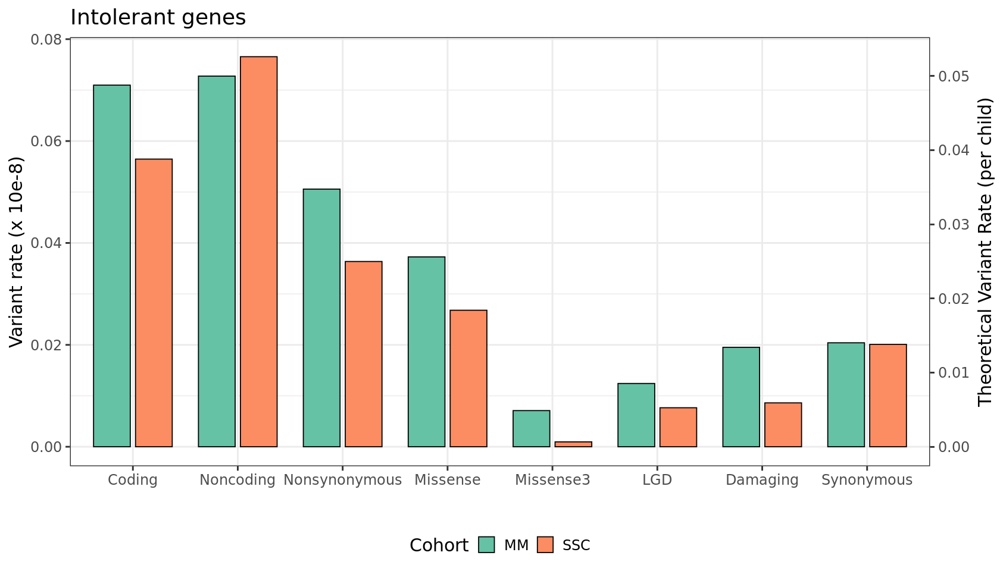

In [325]:


figure_a = c('Coding','Noncoding','Nonsynonymous', 'Missense', 'Missense3','LGD', 'Damaging', 'Synonymous')
##40%
consensus_size = 72070293

##60%
#consensus_size = 58829901

for (eff in figure_a) {
    c = c(sum(df.mm[, eff]), sum(df.ss[, eff]))
    T = c(sum(consensus_size), sum(consensus_size))
    pt = poisson.test(c, T, alternative='greater')
    show(paste0(eff, ': ', round(pt$p.value, 3), '   ', 'Rate ratio: ', pt$estimate))
}

options(repr.plot.width=14, repr.plot.height=8)
p = ggplot(data=subset(df.melt, class %in% figure_a), aes(class, variant * 100000000 / consensus_size / 2, width=0.7)) +
    geom_bar(aes(fill = cohort), color='black', position = position_dodge(width = 0.8), stat = "summary", fun = "mean") +
    #stat_summary(aes(group = cohort), fun.data = mean_cl_normal, geom = "errorbar", position = position_dodge(width = 0.80), width = 0.25, size=0.3) +
    geom_errorbar(stat='summary', fun="mean_se", width = 0.25)+
    scale_fill_brewer(palette='Set2') +
    scale_y_continuous(sec.axis = sec_axis(~ . / (100000000 / 2) * total_size, name = 'Theoretical Variant Rate (per child)')) +
    labs(fill='Cohort', x='', y='Variant rate (x 10e-8)') +

    theme(legend.position='bottom', axis.title.y.right = element_text( angle = 90)) + 
    ggtitle(label = "Intolerant genes")
p

## PPI

In [326]:
#head(data.fil)
data.fil.ori = data.fil.save
head(data.fil.ori)
colnames(data.fil)[5] = "sample"
colnames(ped.pro)[2] = "sample"
data.ppi = subset(data.fil.ori, data.fil.ori$ppi != 'NA')
data.fil = data.ppi
head(data.ppi)
data.fil$sample = factor(as.vector(data.fil$sample), levels=as.vector(ped.pro$sample))
df = data.frame(sample = factor(levels(data.fil$sample), levels=levels(data.fil$sample)))
df = merge(df, ped.pro[, c('sample', 'family')], by.x= 'sample',by.y = 'sample', sort = F, all.x = TRUE)
head(df)
df$cohort = ifelse(levels(data.fil$sample) %in% ped.pro[grepl('s', ped.pro$sample), ]$sample, 'SSC', 'MM')
#df$cohort = factor(df$cohort, levels=c('MM', 'SSC'))
head(df)
dim(df)
#df = left_join(df, callable, by = 'sample')
df = merge(df, callable[, c('sample', 'callable')], by= 'sample', sort = F, all.x=TRUE)
df$callable = ifelse(is.na(df$callable), 'NA', df$callable)
dim(df)
head(df)




df$All = table(data.fil$sample)

df$Coding = table(data.fil[data.fil$term %in% coding_term,]$sample)
df$Noncoding = table(data.fil[!data.fil$term %in% coding_term,]$sample)
df$Nonsynonymous = table(data.fil[data.fil$term != 'synonymous_variant' &data.fil$term %in% coding_term ,]$sample)
df$Missense = table(data.fil[data.fil$term == 'missense_variant',]$sample)
df$Missense3 = table(data.fil[data.fil$term == 'missense_variant' & (data.fil$metasvm == 'D' ),]$sample)
df$Missense4 = table(data.fil[data.fil$term == 'missense_variant'& grepl("damaging",data.fil$polyphen),]$sample)



term.lgd = c('frameshift_variant', 'splice_acceptor_variant', 'splice_donor_variant', 'stop_gained')
term.coding = c()
df$LGD = table(data.fil[data.fil$term %in% term.lgd,]$sample)
df$Damaging = table(data.fil[data.fil$term %in% term.lgd | data.fil$term == 'missense_variant' & (data.fil$metasvm == 'D' ),]$sample)


df$Synonymous = table(data.fil[data.fil$term == 'synonymous_variant',]$sample)
df$LGD_SNV = table(data.fil[data.fil$term %in% term.lgd & data.fil$var_class == 'SNV',]$sample)
df$LGD_FS = table(data.fil[data.fil$term == 'frameshift_variant',]$sample)
df$Inframe = table(data.fil[data.fil$term == 'inframe_deletion' | data.fil$term == 'inframe_insertion',]$sample)
df$Splice_region = table(data.fil[data.fil$term == 'splice_region_variant',]$sample)

df$LGD_FS = table(data.fil[data.fil$term == 'frameshift_variant',]$sample)
df$LGD_SP_A = table(data.fil[data.fil$term == 'splice_acceptor_variant',]$sample)
df$LGD_SP_D = table(data.fil[data.fil$term == 'splice_donor_variant',]$sample)
df$LGD_STOP = table(data.fil[data.fil$term == 'stop_gained',]$sample)


df$Tolerant_gene = table(data.fil[as.numeric(data.fil$pLI)<0.9 ,]$sample)
df$Intolerant_gene = table(data.fil[as.numeric(data.fil$pLI)>=0.9 ,]$sample)

df$SNV = table(data.fil[data.fil$var_class == 'SNV',]$sample)
df$INDEL = table(data.fil[data.fil$var_class == 'insertion' | data.fil$var_class == 'deletion',]$sample)
#ratio = ifelse(df$INDEL != 0, df$SNV/df$INDEL, NA)
#df <- cbind(df, ratio)

df
df.mm = df[df$cohort == 'MM', ]
df.ss = df[df$cohort == 'SSC', ]
head(df.mm)

dim(df.mm)
dim(df.ss)

dim(df.mm$All)
dim(df.ss$All)
df.melt <- melt(df, id.vars=c('sample', 'family', 'cohort', 'callable'))

df.mm = df[df$cohort == 'MM', ]
df.ss = df[df$cohort == 'SSC', ]
colnames(df.melt)[5] = 'class'
colnames(df.melt)[6] = 'variant'
head(df.melt)



,locus,ref,alt,family,sample,dad,mom,pro_s,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,var_class,term,on,gene,gene_id,protein,HGVS_c,HGVS_p,impact,polyphen,polyphen_score,sift,metasvm,metasvm_score,cadd,gnomad_an,gnomad_ac,gnomad_af,MQ,QD,filters,other_gene,occurence,samples,batch,Gene_interest,gene_alias,gene_hgnc,Approved.name,ppi,ppi_prediction,Inspection,pLI,pNull,pRec,oe_lof,oe_lof_lower,oe_lof_upper,DP_filter12,pval
,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,chr1:1486163,G,C,7004,4926035813,2917406449,3160220249,1,64,30,34,0/1,99,54,54,0,0/0,97,59,59,0,0/0,97,.,hiConfDeNovo,SNV,missense_variant,10/16,ATAD3B,ENSG00000160072,ENSP00000500094,ENST00000673477.1:c.1017G>C,ENSP00000500094.1:p.Lys339Asn,MODERATE,possibly_damaging(0.824),0.955,deleterious(0),D,0.94306,23.7,NA,NA,NA,59.68,16.27,PASS,NA,1,4926035813,UCI,NA,"TOB3, KIAA1273",ATAD3B,ATPase family AAA domain containing 3B,NA,NA,NA,1.0032e-22,0.99972,0.00027792,1.0995,0.829,1.477,TRUE,0.707980754134766
2,chr1:9356429,G,A,6144,7350647467,2898643437,4401829860,1,154,76,78,0/1,99,33,33,0,0/0,76,33,33,0,0/0,76,.,hiConfDeNovo,SNV,missense_variant,2/2,SPSB1,ENSG00000171621,ENSP00000409235,ENST00000450402.1:c.538G>A,ENSP00000409235.1:p.Ala180Thr,MODERATE,benign(0.031),0.027,deleterious(0),T,0.56603,24.4,NA,NA,NA,60,9.72,PASS,NA,1,7350647467,Macrogen,NA,SSB-1,SPSB1,splA/ryanodine receptor domain and SOCS box containing 1,NA,NA,NA,0.51982,0.0032925,0.47688,0.18868,0.076,0.594,TRUE,0.935808920020393
3,chr1:10418892,C,T,6137,1065817357,9484178706,6071727996,1,21,11,10,0/1,99,34,34,0,0/0,99,35,35,0,0/0,99,.,hiConfDeNovo,SNV,non_coding_transcript_exon_variant,4/6,PGD,ENSG00000142657,,ENST00000498356.1:n.433C>T,,MODIFIER,,0,,,NA,NA,NA,NA,NA,60,9.32,PASS,NA,2,1065817357/6578846017,Murat,NA,,PGD,phosphogluconate dehydrogenase,NA,NA,NA,0.98788,3.4517e-08,0.012117,0.11301,0.05,0.292,TRUE,1
4,chr1:10418892,C,T,6137,6578846017,9484178706,6071727996,1,137,71,66,0/1,99,34,34,0,0/0,99,35,35,0,0/0,99,.,hiConfDeNovo,SNV,non_coding_transcript_exon_variant,4/6,PGD,ENSG00000142657,,ENST00000498356.1:n.433C>T,,MODIFIER,,0,,,NA,NA,NA,NA,NA,60,9.32,PASS,NA,2,1065817357/6578846017,Macrogen,NA,,PGD,phosphogluconate dehydrogenase,NA,NA,NA,0.98788,3.4517e-08,0.012117,0.11301,0.05,0.292,TRUE,0.732684093591042
5,chr1:11013867,T,C,6292,1544002197,8967908026,2231421668,1,60,33,27,0/1,99,39,39,0,0/0,91,33,33,0,0/0,76,.,hiConfDeNovo,SNV,missense_variant,1/6,TARDBP,ENSG00000120948,ENSP00000497327,ENST00000649624.1:c.140T>C,ENSP00000497327.1:p.Val47Ala,MODERATE,benign(0.005),0.002,tolerated(0.32),T,0.68065,23.2,NA,NA,NA,60,8.85,PASS,NA,1,1544002197,Macrogen,NA,"TDP-43, ALS10",TARDBP,TAR DNA binding protein,NA,NA,NA,0.98542,1.3286e-06,0.014583,0.058054,0.02,0.275,TRUE,0.518958003189654
6,chr1:11285729,C,G,7157,8492074309,6664684039,1778753936,2,112,57,55,0/1,99,63,63,0,0/0,97,52,52,0,0/0,97,.,hiConfDeNovo,SNV,missense_variant,2/5,UBIAD1,ENSG00000120942,ENSP00000473612,ENST00000486588.6:c.258C>G,ENSP00000473612.1:p.Ile86Met,MODERATE,benign(0.325),0.022,deleterious(0.01),T,0.82169,22.5,NA,NA,NA,60,14.08,PASS,NA,1,8492074309,UCI,NA,"TERE1,SCCD",UBIAD1,UbiA prenyltransferase domain containing 1,NA,NA,NA,0.019529,0.072066,0.90841,0.44836,0.22,1.026,TRUE,0.924775093657227


,locus,ref,alt,family,sample,dad,mom,pro_s,pro_DP,pro_ref,pro_alt,pro_GT,pro_GQ,dad_DP,dad_ref,dad_alt,dad_GT,dad_GQ,mom_DP,mom_ref,mom_alt,mom_GT,mom_GQ,p_denovo,confidence,var_class,term,on,gene,gene_id,protein,HGVS_c,HGVS_p,impact,polyphen,polyphen_score,sift,metasvm,metasvm_score,cadd,gnomad_an,gnomad_ac,gnomad_af,MQ,QD,filters,other_gene,occurence,samples,batch,Gene_interest,gene_alias,gene_hgnc,Approved.name,ppi,ppi_prediction,Inspection,pLI,pNull,pRec,oe_lof,oe_lof_lower,oe_lof_upper,DP_filter12,pval
,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
60,chr1:101804525,T,C,11869,11869.s1,11869.fa,11869.mo,2,47,23,24,0/1,99,23,23,0,0/0,37,36,36,0,0/0,79,.,hiConfDeNovo,SNV,3_prime_UTR_variant,6/6,OLFM3,ENSG00000118733,ENSP00000443471,ENST00000536598.1:c.*1179A>G,,MODIFIER,,0,,,NA,NA,NA,NA,NA,60,16.81,PASS,NA,1,11869.s1,SSC,NA,NOE3,OLFM3,olfactomedin 3,OLFM3_VCL,Predicted Interface,NA,0.0010163,0.0021358,0.99685,0.39445,0.237,0.688,TRUE,1
73,chr1:151406022,G,A,7227,4842831943,5835470369,2732579737,2,101,46,55,0/1,99,41,41,0,0/0,79,101,101,0,0/0,97,.,hiConfDeNovo,SNV,missense_variant,18/18,POGZ,ENSG00000143442,ENSP00000431259,ENST00000531094.5:c.2827C>T,ENSP00000431259.1:p.Arg943Cys,MODERATE,probably_damaging(0.982),1,deleterious(0.04),T,0.32928,29.3,NA,NA,NA,60,16.72,PASS,POGZ_missense_variant;PSMB4_downstream_gene_variant,1,4842831943,UCI,NA,"KIAA0461, ZNF635, ZNF280E",POGZ,pogo transposable element derived with ZNF domain,POGZ_AURKB;BANP;CBX5;CDK6;CENPC;CREB1;DAB1;DAZAP2;GABPB1;HGS;NFYA;NFYC;NRF1;POU2F1;PRR20A;PRR20C;Q9H891;Q9NSS6;QRICH1;RBPMS;SP1;V9HWG0;VAV2;ZBTB24;ZXDC,Predicted Interface,NA,1,1.4584e-23,5.9543e-09,0.045859,0.02,0.119,TRUE,0.426160015466994
91,chr1:161222496,T,C,12115,12115.s1,12115.fa,12115.mo,1,214,110,104,0/1,99,44,44,0,0/0,78,39,39,0,0/0,82,.,hiConfDeNovo,SNV,upstream_gene_variant,,MIR5187,ENSG00000284035,,,,MODIFIER,,0,,,NA,NA,NA,NA,NA,60,12.37,PASS,FCER1G_downstream_gene_variant;TOMM40L_upstream_gene_variant;APOA2_missense_variant;MIR5187_upstream_gene_variant,1,12115.s1,SSC,NA,hsa-mir-5187,MIR5187,microRNA 5187,APOA2_APOA1;APOA2;APOD;APOF;CATSPER1;CREB3;DGAT1;LCAT;PLTP;VKORC1,Predicted Interface,NA,NA,NA,NA,NA,NA,NA,TRUE,0.732595851996956
97,chr1:171710782,A,G,6695,5379285870,4295888784,4410709247,1,41,24,17,0/1,99,37,37,0,0/0,76,58,58,0,0/0,97,.,hiConfDeNovo,SNV,non_coding_transcript_exon_variant,5/8,VAMP4,ENSG00000117533,,ENST00000482519.1:n.402T>C,,MODIFIER,,0,,,NA,NA,NA,NA,NA,60,9.27,PASS,NA,1,5379285870,Murat,NA,,VAMP4,vesicle associated membrane protein 4,VAMP4_AP1M1;BCL2L13;CSNK2A1;KASH5;STX12;STX6;VPS51,Predicted Interface,NA,0.14407,0.016663,0.83927,0.298,0.135,0.77,TRUE,0.348888879449079
105,chr1:183529004,C,A,6661,1500858759,6292550477,9676620672,1,14,9,5,0/1,94,18,18,0,0/0,37,26,26,0,0/0,37,.,hiConfDeNovo,SNV,synonymous_variant,7/23,SMG7,ENSG00000116698,ENSP00000510175,ENST00000688051.1:c.669C>A,ENSP00000510175.1:p.Ser223%3D,LOW,,0,,,NA,NA,NA,NA,NA,60,8.51,PASS,NA,1,1500858759,Murat,NA,"KIAA0250, EST1C, SGA56M, SMG-7,C1orf16",SMG7,SMG7 nonsense mediated mRNA decay factor,SMG7_FGFR3,Predicted Interface,NA,0.99998,1.9073e-18,1.9941e-05,0.12165,0.07,0.219,TRUE,0.4239501953125
120,chr1:207022067,C,T,12290,12290.s1,12290.fa,12290.mo,2,21,12,9,0/1,99,21,21,0,0/0,46,16,16,0,0/0,29,.,hiConfDeNovo,SNV,missense_variant,3/3,C1orf116,ENSG00000182795,ENSP00000436862,ENST00000461135.2:c.959G>A,ENSP00000436862.1:p.Arg320His,MODERATE,benign(0.019),0,tolerated(0.22),T,0.30535,16.16,246620,14,5.67675e-05,60,12.77,PASS,NA,1,12290.s1,SSC,NA,"SARG, FLJ36507, MGC2742, MGC4309",C1orf116,chromosome 1 open reading frame 116,SARG_HOMER1,Predicted Interface,NA,0.0017075,0.00496

,sample,family
,<fct>,<chr>
1,S14383,103
2,S14386,103
3,11000.s1,11000
4,11002.s1,11002
5,11003.s1,11003
6,11004.s1,11004


,sample,family,cohort
,<fct>,<chr>,<chr>
1,S14383,103,MM
2,S14386,103,MM
3,11000.s1,11000,SSC
4,11002.s1,11002,SSC
5,11003.s1,11003,SSC
6,11004.s1,11004,SSC


[1] 1507    3

[1] 1507    4

,sample,family,cohort,callable
,<fct>,<chr>,<chr>,<chr>
1,S14383,103,MM,78872610
2,S14386,103,MM,79120866
3,11000.s1,11000,SSC,47881923
4,11002.s1,11002,SSC,55431363
5,11003.s1,11003,SSC,62732391
6,11004.s1,11004,SSC,64331070


sample,family,cohort,callable,All,Coding,Noncoding,Nonsynonymous,Missense,Missense3,Missense4,LGD,Damaging,Synonymous,LGD_SNV,LGD_FS,Inframe,Splice_region,LGD_SP_A,LGD_SP_D,LGD_STOP,Tolerant_gene,Intolerant_gene,SNV,INDEL
<fct>,<chr>,<chr>,<chr>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>
S14383,103,MM,78872610,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
S14386,103,MM,79120866,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11000.s1,11000,SSC,47881923,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11002.s1,11002,SSC,55431363,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11003.s1,11003,SSC,62732391,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11004.s1,11004,SSC,64331070,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11005.s1,11005,SSC,53838822,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11007.s1,11007,SSC,53333492,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11008.s1,11008,SSC,58502617,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


,sample,family,cohort,callable,All,Coding,Noncoding,Nonsynonymous,Missense,Missense3,Missense4,LGD,Damaging,Synonymous,LGD_SNV,LGD_FS,Inframe,Splice_region,LGD_SP_A,LGD_SP_D,LGD_STOP,Tolerant_gene,Intolerant_gene,SNV,INDEL
,<fct>,<chr>,<chr>,<chr>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>,<table>
1,S14383,103,MM,78872610,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,S14386,103,MM,79120866,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
454,S16128,122,MM,86739214,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
501,S13324,125,MM,77840952,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
521,S12833,126,MM,67342022,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
692,S16116,134,MM,88045008,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


[1] 782  25

[1] 725  25

[1] 782

[1] 725

,sample,family,cohort,callable,class,variant
,<fct>,<chr>,<chr>,<chr>,<fct>,<table>
1,S14383,103,MM,78872610,All,0
2,S14386,103,MM,79120866,All,0
3,11000.s1,11000,SSC,47881923,All,0
4,11002.s1,11002,SSC,55431363,All,0
5,11003.s1,11003,SSC,62732391,All,0
6,11004.s1,11004,SSC,64331070,All,0


[1] "Coding: 0.068   Rate ratio: 1.64705882352941"
[1] "Nonsynonymous: 0.066   Rate ratio: 1.76923076923077"
[1] "Missense: 0.5   Rate ratio: 1.08333333333333"
[1] "Missense3: 0.688   Rate ratio: 1"
[1] "LGD: 0.006   Rate ratio: 10"
[1] "Damaging: 0.018   Rate ratio: 4"
[1] "Synonymous: 0.5   Rate ratio: 1.25"


Warning message:
"Computation failed in `stat_summary()`:
undefined columns selected"


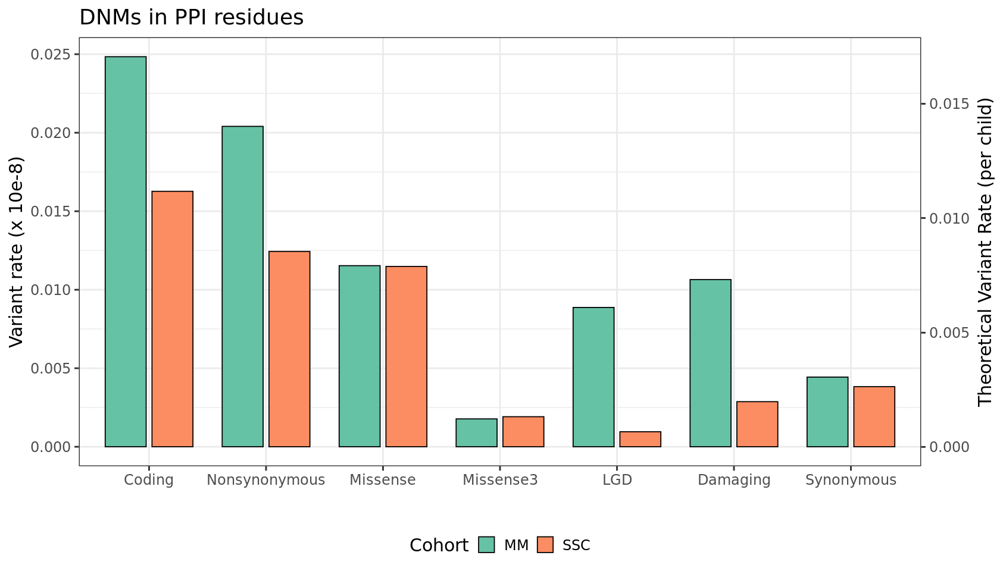

In [327]:

figure_a = c('Coding','Nonsynonymous', 'Missense', 'Missense3','LGD', 'Damaging', 'Synonymous')
##40%
consensus_size = 72070293

##60%
#consensus_size = 58829901

for (eff in figure_a) {
    c = c(sum(df.mm[, eff]), sum(df.ss[, eff]))
    T = c(sum(consensus_size), sum(consensus_size))
    pt = poisson.test(c, T, alternative='greater')
    show(paste0(eff, ': ', round(pt$p.value, 3), '   ', 'Rate ratio: ', pt$estimate))
}

options(repr.plot.width=14, repr.plot.height=8)
p = ggplot(data=subset(df.melt, class %in% figure_a), aes(class, variant * 100000000 / consensus_size / 2, width=0.7)) +
    geom_bar(aes(fill = cohort), color='black', position = position_dodge(width = 0.8), stat = "summary", fun = "mean") +
    #stat_summary(aes(group = cohort), fun.data = mean_cl_normal, geom = "errorbar", position = position_dodge(width = 0.80), width = 0.25, size=0.3) +
    geom_errorbar(stat='summary', fun="mean_se", width = 0.25)+
    scale_fill_brewer(palette='Set2') +
    scale_y_continuous(sec.axis = sec_axis(~ . / (100000000 / 2) * total_size, name = 'Theoretical Variant Rate (per child)')) +
    labs(fill='Cohort', x='', y='Variant rate (x 10e-8)') +

    theme(legend.position='bottom', axis.title.y.right = element_text( angle = 90)) + 
    ggtitle(label = "DNMs in PPI residues")
p